## Parameter Recovery: Fitting (Oedema Oct 25)

Alpha/SARSA Only

Didn't realise we had 4(?) winning models til after the KF Param recovery; that said was a huge job so spliting into two is fine. 


In [1]:
#preamble and imports
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb
import numpy as np
from scipy.io import loadmat
from mat73 import loadmat as loadmat73
from cmdstanpy import CmdStanModel
import os
from joblib import Parallel, delayed
import time 

In [2]:
# load simulated plays data 
sim_struct_path = 'simulated_data/2025-10-24-18-04-30-simulations/simulations_stan_struct.mat'
simulations = loadmat73(sim_struct_path)['simulations']

# see check at the end of notbook for plots 

In [3]:
# compile CmdStanModels for parallelised job for parameter recovery
# note that these have empirical priors FOR PARAM RECOVERY
AlphaSMP_model= CmdStanModel(stan_file= '../cmdPyStan/stan_parameter_recovery/AlphaSMP_model.stan',force_compile=True)
exe_AlphaSMP = AlphaSMP_model.exe_file
AlphaSMEP_model= CmdStanModel(stan_file='../cmdPyStan/stan_parameter_recovery/AlphaSMEP_model.stan', force_compile=True)
exe_AlphaSMEP = AlphaSMEP_model.exe_file


18:14:37 - cmdstanpy - INFO - compiling stan file /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_parameter_recovery/AlphaSMP_model.stan to exe file /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_parameter_recovery/AlphaSMP_model
18:14:49 - cmdstanpy - INFO - compiled model executable: /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_parameter_recovery/AlphaSMP_model
18:14:49 - cmdstanpy - INFO - compiling stan file /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_parameter_recovery/AlphaSMEP_model.stan to exe file /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_parameter_recovery/AlphaSMEP_model
18:15:02 - cmdstanpy - INFO - compiled model executable: /home/isla/Projects/oedema_Oct25/cmdPyStan/stan_parameter_recovery/AlphaSMEP_model


In [9]:
CHAINS= 4
nWarmup = 2500
nSamples = 2500

def fit_model_parallel(model_executable, data, outdir):
    print(f"Fitting model... {outdir}", flush=True)
    os.makedirs(outdir, exist_ok=True)

    model = CmdStanModel(exe_file=model_executable)
    fit = model.sample(data=data,chains=CHAINS,parallel_chains=CHAINS,iter_warmup=nWarmup,iter_sampling=nSamples, output_dir=outdir,show_console=False)

    print(f"Fitted {outdir}")
    for p in fit.runset.csv_files:
        print("  ", p)
        
    return fit 

In [8]:
# set up job indexing & lists I need as well as a 
out_root = 'fits'
N_PER_SUBJECT = 15
nTrials = 300
groups = ['HC', 'PreTreat', 'PostTreat', 'PostTreat_Liv', 'PostTreat_Dun']
models = ['AlphaSMP', 'AlphaSMEP']
model_executables = [exe_AlphaSMP, exe_AlphaSMEP]


jobs = [
    (group_idx, model_idx, subject_idx)
    for group_idx, group in enumerate(groups)                 
    for model_idx, _ in enumerate(models)                 
    for subject_idx in range(simulations[group]['AlphaSMP']['choice'].shape[0])
]

# wrapper for param recovery jobs, 
# warning: context-bound as simulations, groups, models, executables are defined 
def run_parameter_recovery(group_idx,model_idx,subject_idx):
    
    group = groups[group_idx]
    model = models[model_idx]
    model_executable = model_executables[model_idx]

    choice_sim = simulations[group][model]['choice'][subject_idx].reshape(N_PER_SUBJECT, nTrials).astype(int)
    reward_sim = simulations[group][model]['reward_obt'][subject_idx].reshape(N_PER_SUBJECT, nTrials)

    data = {
        'nSubjects': N_PER_SUBJECT,
        'nTrials': nTrials,
        'choice': choice_sim,
        'reward': reward_sim
    }

    outdir = os.path.join(out_root, group, model, f"subject_{subject_idx+1:02d}")

    fit = fit_model_parallel(model_executable, data, outdir)



In [10]:
N_JOBS = 6
start = time.time()
results = Parallel(n_jobs=N_JOBS, backend="loky", verbose=10)(
    delayed(run_parameter_recovery)(group_idx, model_idx, subject_idx) for (group_idx, model_idx, subject_idx) in jobs
)
print(f"Elapsed: {time.time() - start:.3f} seconds")

[Parallel(n_jobs=6)]: Using backend LokyBackend with 6 concurrent workers.


Fitting model... fits/HC/AlphaSMP/subject_01
Fitting model... fits/HC/AlphaSMP/subject_02
Fitting model... fits/HC/AlphaSMP/subject_03
Fitting model... fits/HC/AlphaSMP/subject_04
Fitting model... fits/HC/AlphaSMP/subject_06
Fitting model... fits/HC/AlphaSMP/subject_05


18:20:22 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status18:20:22 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status18:20:22 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status18:20:22 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status18:20:22 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status18:20:22 - cmdstanpy - INFO - CmdSt

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_05
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_05/AlphaSMP_model-20251024182022_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_05/AlphaSMP_model-20251024182022_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_05/AlphaSMP_model-20251024182022_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_05/AlphaSMP_model-20251024182022_4.csv
Fitting model... fits/HC/AlphaSMP/subject_07


18:30:01 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 3 |█████████▊| 09:40 Iteration: 4800 / 5000 [ 96%]  (Sampling)


chain 4 |███████▌  | 09:42 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 1 |██████████| 09:43 Sampling completed                       
chain 2 |██████████| 09:43 Sampling completed                       
chain 3 |██████████| 09:43 Sampling completed                       
chain 4 |██████████| 09:43 Sampling completed                       
18:30:05 - cmdstanpy - INFO - CmdStan done processing.


                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_03
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_03/AlphaSMP_model-20251024182022_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_03/AlphaSMP_model-20251024182022_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_03/AlphaSMP_model-20251024182022_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_03/AlphaSMP_model-20251024182022_4.csv
Fitting model... fits/HC/AlphaSMP/subject_08


18:30:06 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |█████████▌| 09:45 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |████████  | 09:45 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |███████▋  | 09:45 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 1 |████████▊ | 09:46 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |█████████▏| 09:46 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 2 |█████████ | 09:47 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |████████▍ | 09:47 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 1 |██████████| 09:47 Sampling completed                       
chain 2 |██████████| 09:47 Sampling completed                       
chain 3 |██████████| 09:47 Sampling completed                       
chain 4 |██████████| 09:47 Sampling completed                       
18:30:10 - cmdstanpy - INFO - CmdStan do

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_01
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_01/AlphaSMP_model-20251024182022_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_01/AlphaSMP_model-20251024182022_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_01/AlphaSMP_model-20251024182022_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_01/AlphaSMP_model-20251024182022_4.csv
Fitting model... fits/HC/AlphaSMP/subject_09


18:30:10 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |█████████▌| 09:52 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |█████████▊| 09:53 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 1 |█████████ | 09:57 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 4 |███████▉  | 09:58 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |███████▌  | 09:59 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |███████▋  | 09:59 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |████████▊ | 10:00 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |█████████▍| 10:00 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 1 |█████████▊| 10:03 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 1 |███████▌  | 10:03 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 2 |████████▋ | 10:05 Iteration

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_06
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_06/AlphaSMP_model-20251024182022_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_06/AlphaSMP_model-20251024182022_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_06/AlphaSMP_model-20251024182022_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_06/AlphaSMP_model-20251024182022_4.csv
Fitting model... fits/HC/AlphaSMP/subject_10





chain 4 |█▌        | 01:37 Iteration:  600 / 5000 [ 12%]  (Warmup)18:31:39 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |██        | 01:29 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 1 |█▋        | 01:30 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |█▎        | 01:32 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 4 |████████▊ | 11:21 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |█▎        | 01:42 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |█▉        | 01:33 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |████████▊ | 11:23 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |▉         | 01:39 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |██▎       | 01:35 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 1 |█▉        | 01:36 Iteration:  800 / 5000

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_02
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_02/AlphaSMP_model-20251024182022_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_02/AlphaSMP_model-20251024182022_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_02/AlphaSMP_model-20251024182022_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_02/AlphaSMP_model-20251024182022_4.csv
Fitting model... fits/HC/AlphaSMP/subject_11


18:32:49 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▊         | 01:10 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 1 |███▎      | 02:48 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |███▎      | 02:49 Iteration: 1500 / 5000 [ 30%]  (Warmup)

chain 1 |██▌       | 02:46 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |██▉       | 02:51 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |████▌     | 02:42 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 4 |▊         | 01:14 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 1 |████▍     | 02:44 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |████▍     | 02:44 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 1 |█▎        | 01:18 Iteration:  500 / 5000 [ 10%]  (Warmup)g)

chain 3 |████      

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_04
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_04/AlphaSMP_model-20251024182022_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_04/AlphaSMP_model-20251024182022_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_04/AlphaSMP_model-20251024182022_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_04/AlphaSMP_model-20251024182022_4.csv


chain 1 |█▏        | 01:17 Iteration:  400 / 5000 [  8%]  (Warmup)18:34:07 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

Fitting model... fits/HC/AlphaSMP/subject_12




chain 3 |▏         | 00:00 Status


chain 1 |███       | 02:28 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |██████▉   | 03:57 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 2 |███▋      | 04:01 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |█▉        | 02:29 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |█▋        | 02:29 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 1 |████▊     | 04:07 Iteration: 2300 / 5000 [ 46%]  (Warmup)g)


chain 4 |█████     | 03:58 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█▉        | 01:20 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 1 |████▍     | 04:04 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 4 |█▏        | 01:23 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |███▎      | 04:07 Iteration: 1500 / 5000 [ 30%]  (Warmup)

chain 3 |█▏        | 01:24 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |█████     | 04:12 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 1 |██████▋   | 04:04 Iteration: 3200 / 5000 [ 64%]  (Sampling)A

c

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_09
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_09/AlphaSMP_model-20251024183010_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_09/AlphaSMP_model-20251024183010_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_09/AlphaSMP_model-20251024183010_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_09/AlphaSMP_model-20251024183010_4.csv
Fitting model... fits/HC/AlphaSMP/subject_13





chain 4 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |████████▍ | 07:39 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 1 |███▍      | 03:35 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 1 |██████▌   | 04:54 Iteration: 3100 / 5000 [ 62%]  (Sampling)


chain 4 |███       | 03:37 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 4 |██████▎   | 07:38 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |██████▎   | 06:06 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chain 2 |█████████▌| 07:43 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |███████▋  | 04:57 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 1 |███████▋  | 06:07 Iteration: 3700 / 5000 [ 74%]  (Sampling)A

chain 1 |█████████▏| 07:45 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 1 |███████▉  | 07:42 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |███████▎  | 07:44 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 1 |██████▋   | 05:02 Iteration: 3200 / 5000 [ 64%] 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_07
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_07/AlphaSMP_model-20251024183001_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_07/AlphaSMP_model-20251024183001_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_07/AlphaSMP_model-20251024183001_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_07/AlphaSMP_model-20251024183001_4.csv
Fitting model... fits/HC/AlphaSMP/subject_14


18:38:49 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 1 |████████▎ | 06:01 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |███████▉  | 07:14 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |█████▌    | 04:46 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |█████████ | 06:04 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 4 |████████  | 07:15 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |█████     | 04:48 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |███████▎  | 08:49 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |██████▉   | 06:06 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 1 |▊         | 01:19 Iteration:  200 / 5000 [  4%]  (Warmup)g)A
chain 2 |▊         | 01:20 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |████████  | 07:22 Iteration: 39

                                                                                                                                                                                                                                                                                                                                
                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_10
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_10/AlphaSMP_model-20251024183139_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_10/AlphaSMP_model-20251024183139_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_10/Alpha


chain 2 |██        | 02:42 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 1 |██▎       | 02:42 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |█████████▏| 11:26 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |█████     | 03:52 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 1 |████      | 03:52 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 2 |████████▎ | 07:27 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 1 |█████████ | 07:29 Iteration: 4400 / 5000 [ 88%]  (Sampling)A


chain 4 |████████▋ | 07:29 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 4 |███▋      | 03:56 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 3 |█████████▊| 07:30 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |████▊     | 03:58 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |██▎       | 02:49 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |██▎       | 02:49 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |█████▍    | 03:59 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 1 |████▏     | 04:03 Iteration

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_08
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_08/AlphaSMP_model-20251024183006_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_08/AlphaSMP_model-20251024183006_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_08/AlphaSMP_model-20251024183006_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_08/AlphaSMP_model-20251024183006_4.csv
Fitting model... fits/HC/AlphaSMP/subject_17


18:42:33 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |█████▍    | 04:54 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 1 |▊         | 01:06 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |██████▋   | 04:56 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |███▍      | 03:47 Iteration: 1600 / 5000 [ 32%]  (Warmup)


chain 4 |███▎      | 03:48 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |█████████▌| 08:31 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |███████   | 04:58 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 2 |▊         | 01:09 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |█▏        | 01:10 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |████      | 03:50 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 1 |███▋      | 03:51 Iteration: 1700 / 5000 [ 34%]  (Warmup)g)


chain 4 |█▏        | 01:12 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |██████▉

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_12
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_12/AlphaSMP_model-20251024183407_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_12/AlphaSMP_model-20251024183407_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_12/AlphaSMP_model-20251024183407_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_12/AlphaSMP_model-20251024183407_4.csv
Fitting model... fits/HC/AlphaSMP/subject_18


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 1 |▉         | 01:33 Iteration:  300 / 5000 [  6%]  (Warmup)g)
chain 1 |█▎        | 01:34 Iteration:  500 / 5000 [ 10%]  (Warmup)g)


chain 4 |███▋      | 04:16 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 2 |█▋        | 01:36 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |▍         | 00:34 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |████▊     | 04:18 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 4 |█▋        | 01:38 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |█▎        | 01:39 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 1 |████▏     | 04:21 Iteration: 2000 / 5000 [ 40%]  (Warmup)g)
chain 1 |█████▉    | 05:32 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 3 |▉         | 01:43 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 1 |█▌        | 01:43 Iteration:  600 / 5000 [ 12%]  (Warmup)g)

chain 3 |████      | 04:25 Iterat

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_13
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_13/AlphaSMP_model-20251024183740_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_13/AlphaSMP_model-20251024183740_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_13/AlphaSMP_model-20251024183740_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_13/AlphaSMP_model-20251024183740_4.csv
Fitting model... fits/HC/AlphaSMP/subject_19




chain 3 |███▋      | 03:57 Iteration: 1700 / 5000 [ 34%]  (Warmup)18:46:30 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |████████▍ | 07:41 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |█████▍    | 05:01 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 1 |█████▊    | 05:02 Iteration: 2700 / 5000 [ 54%]  (Sampling)A
chain 1 |██        | 03:32 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |████      | 05:03 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 4 |████▊     | 05:05 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |███████▉  | 07:46 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 1 |███▊      | 04:03 Iteration: 1800 / 5000 [ 36%]  (Warmup)g)


chain 4 |███████   | 07:47 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 3 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_14
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_14/AlphaSMP_model-20251024183849_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_14/AlphaSMP_model-20251024183849_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_14/AlphaSMP_model-20251024183849_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_14/AlphaSMP_model-20251024183849_4.csv
Fitting model... fits/HC/AlphaSMP/subject_20




chain 3 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 1 |███████▌  | 07:10 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 1 |██        | 03:13 Iteration:  900 / 5000 [ 18%]  (Warmup)g)
chain 2 |███████▉  | 08:14 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 1 |██████▎   | 08:15 Iteration: 3000 / 5000 [ 60%]  (Sampling)

chain 3 |███       | 03:16 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 4 |█████▌    | 06:46 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |██████▌   | 07:14 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 3 |███████▎  | 08:18 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |███████▎  | 07:15 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 1 |█████▍    | 06:49 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 2 |██▌       | 03:21 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |████████  | 08:23 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |████████  | 08:23 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |████████▊ | 0

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_15
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_15/AlphaSMP_model-20251024184129_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_15/AlphaSMP_model-20251024184129_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_15/AlphaSMP_model-20251024184129_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_15/AlphaSMP_model-20251024184129_4.csv
Fitting model... fits/HC/AlphaSMP/subject_21


chain 1 |██▉       | 02:29 Iteration: 1300 / 5000 [ 26%]  (Warmup)g)


chain 4 |██▌       | 02:30 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |██▎       | 02:30 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |████▊     | 05:43 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 1 |█████████▊| 09:42 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |███████▎  | 05:46 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 1 |███       | 02:35 Iteration: 1400 / 5000 [ 28%]  (Warmup)g)

chain 3 |██▌       | 02:35 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |████████▊ | 10:49 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |██▋       | 02:36 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |███████▉  | 09:18 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |██████▋   | 09:20 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 1 |█████▍    | 05:52 Iteration: 2501 / 5000 [ 50%]  (Sampling)A
chain 2 |█████████ | 09:50 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 1 |███████▌  | 09:23 Ite

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_17
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_17/AlphaSMP_model-20251024184233_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_17/AlphaSMP_model-20251024184233_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_17/AlphaSMP_model-20251024184233_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_17/AlphaSMP_model-20251024184233_4.csv
Fitting model... fits/HC/AlphaSMP/subject_22



chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |██████████| 10:04 Iteration: 4900 / 5000 [ 98%]  (Sampling)


chain 4 |▌         | 00:53 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 3 |████████▍ | 06:35 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 1 |██████▎   | 06:36 Iteration: 3000 / 5000 [ 60%]  (Sampling)

chain 3 |███▋      | 03:25 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 1 |████▊     | 03:27 Iteration: 2300 / 5000 [ 46%]  (Warmup)g)


chain 4 |█████▉    | 06:40 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 1 |████████▎ | 10:10 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 1 |▊         | 01:00 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |███▋      | 03:31 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 3 |████████▋ | 06:43 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |███████▌  | 10:14 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 1 |█████▏    | 03:35 Iteration: 2500 / 5000 [ 50%]  (Wa

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_16
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_16/AlphaSMP_model-20251024184130_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_16/AlphaSMP_model-20251024184130_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_16/AlphaSMP_model-20251024184130_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_16/AlphaSMP_model-20251024184130_4.csv
Fitting model... fits/HC/AlphaSMP/subject_23




chain 3 |█████████▏| 07:11 Iteration: 4500 / 5000 [ 90%]  (Sampling)18:53:41 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |███████▉  | 07:12 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |████▍     | 04:01 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 4 |██████▌   | 07:14 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 1 |█████▉    | 04:05 Iteration: 2800 / 5000 [ 56%]  (Sampling)A
chain 2 |████████  | 10:47 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |█▏        | 01:37 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |████▊     | 04:07 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |█▏        | 01:39 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 3 |▌         | 00:46 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |█

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_18
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_18/AlphaSMP_model-20251024184300_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_18/AlphaSMP_model-20251024184300_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_18/AlphaSMP_model-20251024184300_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_18/AlphaSMP_model-20251024184300_4.csv
Fitting model... fits/HC/AlphaSMP/subject_24


18:55:44 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |█████████▏| 09:15 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |██▎       | 02:41 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 2 |███████   | 06:03 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |███       | 03:34 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |▉         | 02:05 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |██████████| 09:16 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 1 |█▌        | 02:06 Iteration:  600 / 5000 [ 12%]  (Warmup)g)

chain 3 |███▎      | 03:37 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |██████▉   | 06:06 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 1 |███▎      | 02:46 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |████████▍ | 09:21 Iteration: 4100 / 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_19
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_19/AlphaSMP_model-20251024184630_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_19/AlphaSMP_model-20251024184630_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_19/AlphaSMP_model-20251024184630_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_19/AlphaSMP_model-20251024184630_4.csv
Fitting model... fits/HC/AlphaSMP/subject_25


18:57:18 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 4 |██▌       | 03:37 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |████████▍ | 07:37 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 1 |█████▌    | 04:15 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |████▏     | 04:15 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 2 |████▏     | 05:09 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 1 |█████████▊| 07:38 Iteration: 4800 / 5000 [ 96%]  (Sampling)A


chain 4 |█████▌    | 05:10 Iteration: 2600 / 5000 [ 52%]  (Sampling)

chain 3 |███▋      | 03:40 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 3 |█▎        | 01:38 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 1 |█▎        | 01:39 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |██  

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_20
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_20/AlphaSMP_model-20251024184942_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_20/AlphaSMP_model-20251024184942_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_20/AlphaSMP_model-20251024184942_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_20/AlphaSMP_model-20251024184942_4.csv
Fitting model... fits/HC/AlphaSMP/subject_26


18:58:54 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |███████▉  | 06:44 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |██████▎   | 05:52 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chain 2 |█████▊    | 06:45 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 3 |█████▍    | 05:15 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 1 |██████▌   | 06:47 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 2 |████      | 05:17 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 1 |███▎      | 03:15 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |███▋      | 03:15 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 2 |▉         | 01:42 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |▉         | 01:43 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |█

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_21
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_21/AlphaSMP_model-20251024185211_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_21/AlphaSMP_model-20251024185211_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_21/AlphaSMP_model-20251024185211_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_21/AlphaSMP_model-20251024185211_4.csv
Fitting model... fits/HC/AlphaSMP/subject_27





chain 4 |██████▏   | 06:23 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |█████▊    | 06:23 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 2 |████████  | 10:00 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 1 |█████████▍| 07:58 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 1 |█████▍    | 06:27 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |█████████▍| 08:01 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |████████▎ | 10:05 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |█████▉    | 04:52 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |██████▌   | 04:53 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 1 |█████████▌| 08:05 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |██████▉   | 04:56 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |██████▎   | 06:33 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |█████████▊| 10:47 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |█████████▌| 08:07 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |█████▉ 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_24
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_24/AlphaSMP_model-20251024185544_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_24/AlphaSMP_model-20251024185544_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_24/AlphaSMP_model-20251024185544_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_24/AlphaSMP_model-20251024185544_4.csv
Fitting model... fits/HC/AlphaSMP/subject_28





chain 1 |██████████| 11:01 Sampling completed                       
chain 2 |██████████| 11:01 Sampling completed                       
chain 3 |██████████| 11:01 Sampling completed                       
chain 4 |██████████| 11:01 Sampling completed                       
19:04:06 - cmdstanpy - INFO - CmdStan done processing.
19:04:06 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |███████▎  | 05:11 Iteration: 3500 / 5000 [ 70%]  (Sampling)

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_22
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_22/AlphaSMP_model-20251024185304_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_22/AlphaSMP_model-20251024185304_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_22/AlphaSMP_model-20251024185304_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_22/AlphaSMP_model-20251024185304_4.csv
Fitting model... fits/HC/AlphaSMP/subject_29


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |████████▋ | 10:25 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 1 |█████▊    | 05:13 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 1 |█████▊    | 06:51 Iteration: 2700 / 5000 [ 54%]  (Sampling)A
chain 2 |███████   | 05:15 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |▍         | 00:30 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |██████▌   | 05:17 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 3 |███████▌  | 05:18 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |██████▋   | 06:55 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 2 |██████▎   | 06:55 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chain 2 |████████▋ | 10:33 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 4 |████████▊ | 10:36 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 1 |█████▉    | 07:03 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 3 |███████▋  | 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_23
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_23/AlphaSMP_model-20251024185341_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_23/AlphaSMP_model-20251024185341_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_23/AlphaSMP_model-20251024185341_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_23/AlphaSMP_model-20251024185341_4.csv
Fitting model... fits/HC/AlphaSMP/subject_30



chain 2 |█▎        | 02:06 Iteration:  500 / 5000 [ 10%]  (Warmup)19:05:48 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status
chain 2 |█▎        | 01:43 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |█▎        | 02:08 Iteration:  500 / 5000 [ 10%]  (Warmup)g)
chain 1 |██        | 01:45 Iteration:  900 / 5000 [ 18%]  (Warmup)g)

chain 3 |███████▋  | 08:31 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 1 |▉         | 01:44 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |█▏        | 01:44 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |█████████ | 06:56 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 1 |███████▌  | 08:34 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 1 |███████▌  | 06:59 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_26
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_26/AlphaSMP_model-20251024185854_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_26/AlphaSMP_model-20251024185854_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_26/AlphaSMP_model-20251024185854_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_26/AlphaSMP_model-20251024185854_4.csv
Fitting model... fits/HC/AlphaSMP/subject_31



chain 2 |█████▉    | 04:20 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |█████████▏| 11:06 Iteration: 4500 / 5000 [ 90%]  (Sampling)19:08:25 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 4 |█▉        | 02:37 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |██▉       | 04:21 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |█████     | 04:46 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |█████▏    | 04:47 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 4 |███▋      | 04:47 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |█████▊    | 04:25 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 1 |████▍     | 04:50 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |██████▏   | 04:27 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |███ 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_25
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_25/AlphaSMP_model-20251024185718_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_25/AlphaSMP_model-20251024185718_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_25/AlphaSMP_model-20251024185718_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_25/AlphaSMP_model-20251024185718_4.csv
Fitting model... fits/HC/AlphaSMP/subject_32


19:09:40 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 1 |██▎       | 03:54 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |██████▋   | 05:38 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |████      | 03:54 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 2 |███▊      | 03:54 Iteration: 1800 / 5000 [ 36%]  (Warmup)


chain 4 |███▋      | 03:55 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 1 |▊         | 01:19 Iteration:  200 / 5000 [  4%]  (Warmup)g)


chain 1 |█████▉    | 06:04 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 3 |██████▎   | 06:04 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |████▊     | 05:39 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |████▍     | 05:40 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |███▊      | 05:41 Iteration: 1800 / 50

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_28
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_28/AlphaSMP_model-20251024190404_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_28/AlphaSMP_model-20251024190404_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_28/AlphaSMP_model-20251024190404_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_28/AlphaSMP_model-20251024190404_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_01


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |██████▋   | 08:40 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |██████▎   | 08:16 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chain 2 |██████▏   | 06:34 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |████████  | 08:42 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 1 |████      | 03:59 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 3 |██        | 02:44 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 1 |██▌       | 02:45 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |█████     | 04:01 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▊    | 08:21 Iteration: 2700 / 5000 [ 54%]  (Sampling)


chain 1 |███████▉  | 08:47 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 1 |████▏     | 04:06 Iteration: 2000 / 5000 [ 40%]  (Warmup)g)

chain 3 |██████▌   | 06:43 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 2 |███▊      | 04:06 Ite

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_27
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_27/AlphaSMP_model-20251024190341_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_27/AlphaSMP_model-20251024190341_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_27/AlphaSMP_model-20251024190341_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_27/AlphaSMP_model-20251024190341_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_02


19:17:16 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |███████▎  | 07:38 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |█████████▌| 08:53 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |██████▌   | 07:39 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 2 |█████████ | 13:13 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 1 |███████▉  | 11:36 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |█████████▌| 11:37 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |█████████▊| 09:00 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |██████▋   | 07:45 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 1 |▍         | 00:09 Iteration:    1 / 5000 [  0%]  (Warmup)g)
chain 2 |█████████▏| 13:22 Iteration: 4500 / 5000 [ 90%]  (Sampling)



                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_31
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_31/AlphaSMP_model-20251024190825_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_31/AlphaSMP_model-20251024190825_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_31/AlphaSMP_model-20251024190825_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_31/AlphaSMP_model-20251024190825_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_03




chain 3 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status
chain 1 |███████▋  | 07:54 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |███████▋  | 07:55 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |█████████▊| 11:48 Iteration: 4800 / 5000 [ 96%]  (Sampling)


chain 4 |▍         | 00:21 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |████████▎ | 07:58 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |█████████▍| 13:32 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 1 |███████▉  | 08:02 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |████████▍ | 08:05 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |███████▉  | 08:06 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |███████▎  | 08:06 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |██████████| 12:01 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 1 |████████  | 08:11 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |█▏        | 05:31 Iteration:  400 / 5000 [  8

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_29
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_29/AlphaSMP_model-20251024190406_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_29/AlphaSMP_model-20251024190406_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_29/AlphaSMP_model-20251024190406_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_29/AlphaSMP_model-20251024190406_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_04


19:18:11 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 1 |████████▍ | 12:25 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 1 |████████▋ | 08:36 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 4 |████████▍ | 08:39 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 3 |█████████▏| 08:40 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 1 |████████▊ | 08:46 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |█████████▍| 08:48 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 2 |████████▍ | 08:50 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |████████▋ | 08:52 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 1 |█████████ | 08:56 Iteration: 4400 / 5000 [ 88%]  (Sampling)A

chain 3 |█████████▌| 08:57 Iteratio

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_32
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_32/AlphaSMP_model-20251024190940_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_32/AlphaSMP_model-20251024190940_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_32/AlphaSMP_model-20251024190940_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_32/AlphaSMP_model-20251024190940_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_05


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |██▎       | 07:34 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |▊         | 07:38 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |▌         | 02:48 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |█▎        | 07:44 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 1 |█████████▌| 14:21 Iteration: 4700 / 5000 [ 94%]  (Sampling)A


chain 4 |██▌       | 07:55 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |▉         | 07:57 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |▊         | 03:10 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 1 |█████████▊| 14:44 Iteration: 4800 / 5000 [ 96%]  (Sampling)A


chain 4 |██▋       | 08:14 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |█▏        | 08:18 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |▉         | 03:31 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 1 |██████████| 15:06 Sampling compl

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMP/subject_30
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_30/AlphaSMP_model-20251024190548_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_30/AlphaSMP_model-20251024190548_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_30/AlphaSMP_model-20251024190548_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMP/subject_30/AlphaSMP_model-20251024190548_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_06


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |██▉       | 08:36 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |█▎        | 08:43 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |█▏        | 03:53 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 3 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▍         | 00:17 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |█▉        | 08:55 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |▍         | 03:45 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |▍         | 00:27 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |█▎        | 04:13 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |█▌        | 09:09 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |██        | 09:20 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |▍         | 04:10 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███▎      | 09:23 Iteration: 1500 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_03
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_03/AlphaSMEP_model-20251024191732_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_03/AlphaSMEP_model-20251024191732_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_03/AlphaSMEP_model-20251024191732_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_03/AlphaSMEP_model-20251024191732_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_07





chain 4 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 1 |████▊     | 18:55 Iteration: 2300 / 5000 [ 46%]  (Warmup)g)
chain 2 |███████▌  | 18:57 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |███       | 21:40 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 1 |██▌       | 21:44 Iteration: 1100 / 5000 [ 22%]  (Warmup)g)

chain 3 |█████████▊| 22:40 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |█████████▍| 20:05 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |███████▋  | 22:46 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |██████▉   | 20:13 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 1 |█████     | 19:17 Iteration: 2400 / 5000 [ 48%]  (Warmup)g)

chain 1 |█████▏    | 19:17 Iteration: 2500 / 5000 [ 50%]  (Warmup)g)


chain 4 |███▎      | 22:01 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |███████▋  | 19:18 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 1 |██▋       | 22:01 Iteration: 1200 / 5000 [ 24%]

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_05
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_05/AlphaSMEP_model-20251024191953_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_05/AlphaSMEP_model-20251024191953_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_05/AlphaSMEP_model-20251024191953_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_05/AlphaSMEP_model-20251024191953_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_08


19:43:42 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |██▋       | 03:54 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 1 |█████▍    | 25:37 Iteration: 2501 / 5000 [ 50%]  (Sampling)A

chain 3 |███████▉  | 25:37 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 1 |███████▋  | 22:56 Iteration: 3700 / 5000 [ 74%]  (Sampling)A

chain 3 |▍         | 00:08 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |██████████| 26:38 Sampling completed                       
chain 2 |██████████| 26:38 Sampling completed                       
chain 3 |██████████| 26:38 Sampling completed                       
chain 4 |██████████| 26:38 Sampling completed                       
19:43:55 - cmdstanpy - INFO - CmdStan done processing.


chain 3 |███████▎ 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_02
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_02/AlphaSMEP_model-20251024191716_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_02/AlphaSMEP_model-20251024191716_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_02/AlphaSMEP_model-20251024191716_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_02/AlphaSMEP_model-20251024191716_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_09





chain 4 |█████▌    | 25:44 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |██▉       | 04:06 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |█▎        | 25:47 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 4 |█▋        | 23:06 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |▉         | 04:12 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 1 |▍         | 04:18 Iteration:    1 / 5000 [  0%]  (Warmup)g)
chain 2 |▉         | 04:19 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 1 |███████▉  | 23:18 Iteration: 3800 / 5000 [ 76%]  (Sampling)A
chain 2 |▍         | 00:33 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█▏        | 04:27 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 1 |█████▌    | 26:08 Iteration: 2600 / 5000 [ 52%]  (Sampling)

chain 3 |███▎      | 04:32 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |█▌        | 26:10 Iteration:  600 / 5000 [ 12%]  (Warmup)




                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_07
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_07/AlphaSMEP_model-20251024193949_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_07/AlphaSMEP_model-20251024193949_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_07/AlphaSMEP_model-20251024193949_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_07/AlphaSMEP_model-20251024193949_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_10


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |██▉       | 44:01 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |████████  | 12:27 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 1 |███████▋  | 12:32 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |████████▊ | 12:33 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 1 |██████████| 35:36 Sampling completed                       
chain 2 |██████████| 35:36 Sampling completed                       
chain 3 |██████████| 35:36 Sampling completed                       
chain 4 |██████████| 35:36 Sampling completed                       
19:56:31 - cmdstanpy - INFO - CmdStan done processing.
19:56:31 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_06
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_06/AlphaSMEP_model-20251024192054_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_06/AlphaSMEP_model-20251024192054_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_06/AlphaSMEP_model-20251024192054_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_06/AlphaSMEP_model-20251024192054_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_11




chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status


chain 4 |███       | 12:51 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 1 |████▍     | 12:57 Iteration: 2100 / 5000 [ 42%]  (Warmup)g)
chain 2 |█████▊    | 12:57 Iteration: 2700 / 5000 [ 54%]  (Sampling)


chain 4 |██████▏   | 12:44 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |███████▋  | 38:29 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |█████████ | 12:46 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 1 |███████▉  | 12:46 Iteration: 3800 / 5000 [ 76%]  (Sampling)A

chain 1 |███▎      | 44:30 Iteration: 1500 / 5000 [ 30%]  (Warmup)g)


chain 4 |███▎      | 13:11 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 1 |████████  | 13:01 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 1 |████▌     | 13:19 Iteration: 2200 / 5000 [ 44%]  (Warmup)g)

chain 3 |████████▋ | 13:06 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |███████▉  | 38:53 Iteration: 3800 / 5000 [ 76%] 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_04
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_04/AlphaSMEP_model-20251024191811_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_04/AlphaSMEP_model-20251024191811_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_04/AlphaSMEP_model-20251024191811_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_04/AlphaSMEP_model-20251024191811_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_12


20:01:06 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |█▋        | 04:35 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 1 |███████   | 17:28 Iteration: 3400 / 5000 [ 68%]  (Sampling)A

chain 3 |█▋        | 04:49 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |██▎       | 04:40 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |█████████▊| 17:19 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |███████▉  | 17:34 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |██▎       | 04:55 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 1 |██▎       | 04:57 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |███       | 04:48 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |█▉ 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_09
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_09/AlphaSMEP_model-20251024194355_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_09/AlphaSMEP_model-20251024194355_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_09/AlphaSMEP_model-20251024194355_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_09/AlphaSMEP_model-20251024194355_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_13


20:01:32 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 1 |██        | 05:05 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |██        | 05:06 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 1 |███████▎  | 17:58 Iteration: 3500 / 5000 [ 70%]  (Sampling)A

chain 3 |██▋       | 05:11 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 2 |█▋        | 05:24 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |███▍      | 05:14 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 1 |██▎       | 05:19 Iteration: 1000 / 5000 [ 20%]  (Warmup)g)
chain 2 |██▎       | 05:19 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |██        | 05:30 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |███▊      | 18:11 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 3 |▍       

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_01
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_01/AlphaSMEP_model-20251024191221_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_01/AlphaSMEP_model-20251024191221_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_01/AlphaSMEP_model-20251024191221_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_01/AlphaSMEP_model-20251024191221_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_14





chain 4 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status
chain 1 |█████▉    | 09:40 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 4 |████████  | 22:30 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |████▌     | 09:54 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 4 |███████▎  | 09:47 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |█████▊    | 09:54 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 3 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |██████▏   | 09:57 Iteration: 2900 / 5000 [ 58%]  (Sampling)A

chain 3 |█████▊    | 09:57 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 2 |████▊     | 10:10 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 1 |█████▍    | 10:19 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |█████▉    | 22:59 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 1 |██▎       | 05:39 Iteration: 1000 / 5000 [ 20%]  (Warmup)g)


chain 4 |████████▎ | 23:04 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |▍         | 00:

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_11
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_11/AlphaSMEP_model-20251024195631_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_11/AlphaSMEP_model-20251024195631_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_11/AlphaSMEP_model-20251024195631_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_11/AlphaSMEP_model-20251024195631_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_15


20:13:35 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 1 |██████▋   | 12:33 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |████▏     | 12:35 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |████████▊ | 29:59 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |███▍      | 12:36 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 2 |████▍     | 12:11 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |████████  | 17:22 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |███       | 12:11 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 1 |█████▏    | 12:14 Iteration: 2500 / 5000 [ 50%]  (Warmup)

chain 1 |██▎       | 07:36 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |▊         | 07:36 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 3 |███

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_08
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_08/AlphaSMEP_model-20251024194342_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_08/AlphaSMEP_model-20251024194342_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_08/AlphaSMEP_model-20251024194342_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_08/AlphaSMEP_model-20251024194342_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_16



chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |██        | 10:35 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |█████████▌| 20:26 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |██████▉   | 15:17 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |█████▉    | 15:44 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 1 |█████████ | 20:32 Iteration: 4400 / 5000 [ 88%]  (Sampling)A
chain 2 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█████     | 15:24 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |██▎       | 10:45 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 1 |████████▋ | 15:53 Iteration: 4200 / 5000 [ 84%]  (Sampling)A


chain 1 |████      | 10:51 Iteration: 1900 / 5000 [ 38%]  (Warmup)g)A
chain 2 |████▍     | 15:56 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |██████▋   | 15:57 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |██▎       | 10:55 Iteration: 1000 / 5000 [ 20%] 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_10
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_10/AlphaSMEP_model-20251024195621_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_10/AlphaSMEP_model-20251024195621_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_10/AlphaSMEP_model-20251024195621_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_10/AlphaSMEP_model-20251024195621_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_17



chain 2 |██████▏   | 18:50 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 1 |█████▉    | 13:46 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 3 |████████▋ | 18:53 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 1 |█████████ | 18:34 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |█████▌    | 18:36 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |█████████ | 18:36 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 4 |████      | 13:58 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 4 |████████  | 19:05 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 3 |▌         | 06:38 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 4 |█▎        | 06:39 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 4 |███████▌  | 18:42 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |████████▊ | 19:09 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |████      | 14:04 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 1 |██▎       | 06:

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_12
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_12/AlphaSMEP_model-20251024200106_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_12/AlphaSMEP_model-20251024200106_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_12/AlphaSMEP_model-20251024200106_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_12/AlphaSMEP_model-20251024200106_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_18


20:26:08 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |█████████▊| 20:00 Iteration: 4800 / 5000 [ 96%]  (Sampling)A

chain 3 |████      | 12:38 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 1 |█████▊    | 12:41 Iteration: 2700 / 5000 [ 54%]  (Sampling)


chain 4 |█▌        | 09:32 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |▍         | 00:09 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |██▎       | 20:07 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 2 |███▊      | 12:43 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 3 |▉         | 06:23 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |████████  | 20:09 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |███▎      | 06:23 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |████

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_13
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_13/AlphaSMEP_model-20251024200132_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_13/AlphaSMEP_model-20251024200132_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_13/AlphaSMEP_model-20251024200132_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_13/AlphaSMEP_model-20251024200132_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_19





chain 4 |███▊      | 07:10 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |████████  | 20:58 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 3 |█▎        | 07:16 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |████▍     | 13:41 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 4 |█████▉    | 13:42 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 1 |▊         | 07:25 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 1 |██████▎   | 13:48 Iteration: 3000 / 5000 [ 60%]  (Sampling)A


chain 4 |████      | 07:29 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 3 |████████▋ | 21:15 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |████▊     | 13:52 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |█▏        | 10:47 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |▍         | 01:26 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |██        | 10:50 Iteration:  900 / 5000 [ 18%]  (Warmup

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_15
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_15/AlphaSMEP_model-20251024201335_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_15/AlphaSMEP_model-20251024201335_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_15/AlphaSMEP_model-20251024201335_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_15/AlphaSMEP_model-20251024201335_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_20


20:40:49 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 1 |▏         | 00:00 Statusion: 4800 / 5000 [ 96%]  (Sampling)


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |██▉       | 24:06 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |███▊      | 14:44 Iteration: 1800 / 5000 [ 36%]  (Warmup)


chain 1 |██████▋   | 13:50 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 2 |██████▏   | 13:51 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |██▉       | 14:50 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |████████▊ | 13:53 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 1 |█▉        | 14:54 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |██████▉   | 24:19 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |██████████| 21:08 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 2 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_14
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_14/AlphaSMEP_model-20251024200611_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_14/AlphaSMEP_model-20251024200611_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_14/AlphaSMEP_model-20251024200611_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_14/AlphaSMEP_model-20251024200611_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_21




chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |██████▌   | 14:28 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 1 |██        | 15:32 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 4 |█████████▍| 14:34 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 3 |███▎      | 15:34 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |▍         | 00:10 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |███████▎  | 14:38 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |████████▊ | 25:04 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |████▍     | 15:43 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |███▋      | 25:09 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 1 |█████████▍| 21:59 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |█████████▌| 14:49 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 1 |███████▌  | 14:59 Iteration: 3600 / 5000 [ 72%]  (Sampling)A

chain 3 |███▍      | 15:59 Iteration: 1600 / 5000 [ 32%]  (Wa

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_17
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_17/AlphaSMEP_model-20251024201957_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_17/AlphaSMEP_model-20251024201957_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_17/AlphaSMEP_model-20251024201957_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_17/AlphaSMEP_model-20251024201957_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_22




chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status


chain 4 |█████████▍| 26:26 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 1 |█▌        | 26:31 Iteration:  600 / 5000 [ 12%]  (Warmup)g)
chain 2 |████▌     | 26:32 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 1 |▍         | 02:37 Iteration:    1 / 5000 [  0%]  (Warmup)g)A


chain 1 |██▉       | 17:18 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |██████▎   | 16:20 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |█████▍    | 17:23 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |████▏     | 17:23 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 1 |█▋        | 26:52 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 1 |▍         | 00:28 Iteration:    1 / 5000 [  0%]  (Warmup)g)


chain 4 |█████████▌| 26:56 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |███████▉  | 27:00 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 1 |███       | 17:45 Iteration: 1400 / 5000 [ 28%]  (W

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_19
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_19/AlphaSMEP_model-20251024202707_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_19/AlphaSMEP_model-20251024202707_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_19/AlphaSMEP_model-20251024202707_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_19/AlphaSMEP_model-20251024202707_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_23



chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |████████▊ | 23:35 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 1 |███       | 09:00 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |███       | 08:17 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 1 |████▌     | 33:07 Iteration: 2200 / 5000 [ 44%]  (Warmup)
chain 2 |███████▎  | 33:08 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |██▌       | 09:04 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |██▋       | 09:08 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 1 |█████▉    | 23:52 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 1 |▍         | 00:25 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█████████ | 23:54 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |▍         | 00:27 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |███▎      | 09:21 Iteration: 1500 / 5000 [ 30%]  (Warmup)g)
chain 2 |███▎      | 08:35 Iteration: 1500 / 5000 [ 30%]  (Warmup)
cha

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_20
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_20/AlphaSMEP_model-20251024204049_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_20/AlphaSMEP_model-20251024204049_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_20/AlphaSMEP_model-20251024204049_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_20/AlphaSMEP_model-20251024204049_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_24


21:03:19 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status

chain 1 |██▉       | 13:45 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 1 |██████████| 46:38 Sampling completed                       A
chain 2 |██████████| 46:38 Sampling completed                       
chain 3 |██████████| 46:38 Sampling completed                       
chain 4 |██████████| 46:38 Sampling completed                       
21:03:23 - cmdstanpy - INFO - CmdStan done processing.
21:03:23 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_16
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_16/AlphaSMEP_model-20251024201645_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_16/AlphaSMEP_model-20251024201645_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_16/AlphaSMEP_model-20251024201645_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_16/AlphaSMEP_model-20251024201645_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_25




chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |███████▉  | 21:55 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 1 |████████▎ | 20:22 Iteration: 4000 / 5000 [ 80%]  (Sampling)A


chain 4 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |██        | 14:00 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |██████████| 22:04 Iteration: 4900 / 5000 [ 98%]  (Sampling)


chain 4 |█████▍    | 14:03 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |▍         | 00:15 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |████▏     | 20:30 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 1 |███▎      | 22:08 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 1 |▍         | 00:27 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███       | 20:40 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |████▍     | 14:21 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 1 |███▍      | 22:26 Iteration: 1600 / 5000 [ 32%]  (Warmup)g)

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_22
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_22/AlphaSMEP_model-20251024204310_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_22/AlphaSMEP_model-20251024204310_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_22/AlphaSMEP_model-20251024204310_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_22/AlphaSMEP_model-20251024204310_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_26





chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |████████▎ | 12:56 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 1 |█████████▏| 26:42 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 2 |████▌     | 12:55 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 1 |██████████| 13:02 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 2 |█████████▍| 26:46 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 1 |█▏        | 13:00 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 3 |████████▍ | 13:07 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |▍         | 00:18 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |█████████▏| 13:12 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |█████████▌| 13:12 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |███▎      | 13:11 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |████▊     | 13:11 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |████████▋ | 13:18 Iteration: 4200 / 5000 [ 84%]  (Sampling

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_23
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_23/AlphaSMEP_model-20251024204936_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_23/AlphaSMEP_model-20251024204936_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_23/AlphaSMEP_model-20251024204936_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_23/AlphaSMEP_model-20251024204936_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_27




chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 1 |██████████| 14:25 Sampling completed                       
chain 2 |██████████| 14:25 Sampling completed                       
chain 3 |██████████| 14:25 Sampling completed                       
chain 4 |██████████| 14:25 Sampling completed                       
21:17:45 - cmdstanpy - INFO - CmdStan done processing.


                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_24
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_24/AlphaSMEP_model-20251024210319_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_24/AlphaSMEP_model-20251024210319_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_24/AlphaSMEP_model-20251024210319_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_24/AlphaSMEP_model-20251024210319_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_28


21:17:45 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |██        | 14:23 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |████▍     | 14:25 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 1 |▍         | 00:10 Iteration:    1 / 5000 [  0%]  (Warmup)g)


chain 4 |▊         | 01:48 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 1 |██▎       | 14:44 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 2 |██████▏   | 14:48 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |████▊     | 14:59 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 1 |██▌       | 15:06 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 1 |▍         | 00:53 Iteration:    1 / 5000 [  0%]  (Warmup)g)

chain 3 |█████     | 15:22 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |█████▏    | 15:22 Iteration: 2500 / 5000 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_28
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_28/AlphaSMEP_model-20251024211745_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_28/AlphaSMEP_model-20251024211745_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_28/AlphaSMEP_model-20251024211745_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_28/AlphaSMEP_model-20251024211745_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_29



chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 1 |█████████▏| 16:41 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |███████▉  | 51:19 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |███████▎  | 15:09 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |████████▍ | 15:10 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |███████▌  | 1:06:48 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 1 |█████▌    | 15:20 Iteration: 2600 / 5000 [ 52%]  (Sampling)A


chain 4 |██        | 29:41 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 4 |▍         | 00:14 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███████▉  | 15:24 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |████████  | 51:36 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 1 |█████████▌| 17:00 Iteration: 4700 / 5000 [ 94%]  (Sampling)g)
chain 2 |███████▌  | 15:29 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |████████▋ | 15:30 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 1 |███████

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_26
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_26/AlphaSMEP_model-20251024211612_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_26/AlphaSMEP_model-20251024211612_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_26/AlphaSMEP_model-20251024211612_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_26/AlphaSMEP_model-20251024211612_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_30


21:33:31 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 4 |██▌       | 30:07 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |████████▎ | 51:57 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |████████▊ | 15:50 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 1 |▍         | 00:50 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |████████▎ | 16:00 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |▍         | 00:15 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |█████▉    | 16:04 Iteration: 2800 / 5000 [ 56%]  (Sampling)A
chain 2 |███████▉  | 16:05 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |████████  | 1:07:41 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |████████▍ | 52:21 Iteration: 4100 / 5000 [ 82%]  (Sampling)

c

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_21
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_21/AlphaSMEP_model-20251024204134_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_21/AlphaSMEP_model-20251024204134_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_21/AlphaSMEP_model-20251024204134_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_21/AlphaSMEP_model-20251024204134_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_31



chain 2 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 1 |██▎       | 04:05 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 1 |███████▌  | 19:20 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |▌         | 03:34 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 1 |██▌       | 04:20 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 1 |██████████| 1:11:06 Sampling completed                     g)
chain 2 |██████████| 1:11:06 Sampling completed                       
chain 3 |██████████| 1:11:06 Sampling completed                     
chain 4 |██████████| 1:11:06 Sampling completed                     
21:37:15 - cmdstanpy - INFO - CmdStan done processing.
21:37:15 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_18
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_18/AlphaSMEP_model-20251024202608_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_18/AlphaSMEP_model-20251024202608_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_18/AlphaSMEP_model-20251024202608_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_18/AlphaSMEP_model-20251024202608_4.csv
Fitting model... fits/HC/AlphaSMEP/subject_32





chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |█████▍    | 33:56 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |▉         | 04:29 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 1 |██▋       | 04:36 Iteration: 1200 / 5000 [ 24%]  (Warmup)g)


chain 1 |███████▋  | 19:47 Iteration: 3700 / 5000 [ 74%]  (Sampling)A


chain 4 |▊         | 04:02 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 1 |██▉       | 04:53 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |█████▌    | 34:25 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 1 |███       | 05:08 Iteration: 1400 / 5000 [ 28%]  (Warmup)g)A

chain 3 |█▎        | 05:09 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 1 |▌         | 04:41 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 1 |███▎      | 05:23 Iteration: 1500 / 5000 [ 30%]  (Warmup)g)


chain 4 |█▏        | 04:45 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 1 |███▍      | 05:37 Iteration: 1600 / 5000 [ 32%]  

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_27
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_27/AlphaSMEP_model-20251024211744_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_27/AlphaSMEP_model-20251024211744_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_27/AlphaSMEP_model-20251024211744_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_27/AlphaSMEP_model-20251024211744_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_01



chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |█▏        | 10:42 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 3 |███▍      | 06:45 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 2 |███       | 06:45 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |█▏        | 10:07 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 1 |██▉       | 10:10 Iteration: 1300 / 5000 [ 26%]  (Warmup)g)


chain 4 |████▍     | 06:49 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 4 |████▊     | 10:12 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |██        | 06:30 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 1 |██████▉   | 10:53 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |███▋      | 06:59 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 2 |██▉       | 11:00 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |███▎      | 06:59 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |████▌     | 07:04 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chai

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_25
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_25/AlphaSMEP_model-20251024210323_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_25/AlphaSMEP_model-20251024210323_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_25/AlphaSMEP_model-20251024210323_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_25/AlphaSMEP_model-20251024210323_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_02


21:49:24 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 1 |▏         | 00:00 Statusion: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |█████▏    | 05:50 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 4 |███████▎  | 15:54 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |████▏     | 16:33 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |████████  | 12:34 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 3 |█████▊    | 12:14 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 1 |███▋      | 12:39 Iteration: 1700 / 5000 [ 34%]  (Warmup)g)
chain 2 |██████▎   | 16:40 Iteration: 3000 / 5000 [ 60%]  (Sampling)

chain 3 |████      | 06:00 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 1 |█████████▌| 16:44 Iteration: 4700 / 5000 [ 94%]  (Sampling)A

chain 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_01
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_01/AlphaSMP_model-20251024214334_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_01/AlphaSMP_model-20251024214334_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_01/AlphaSMP_model-20251024214334_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_01/AlphaSMP_model-20251024214334_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_03


21:56:18 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |█████████ | 06:54 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |███████▎  | 06:54 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 1 |████████▎ | 19:26 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |█████████▌| 23:28 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |███████▉  | 23:28 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |██████▉   | 19:09 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |█████████▏| 07:01 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |██████████| 19:10 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 2 |█████████▏| 19:11 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 2 |███████▌  | 07:03 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |████████▍ | 22:57 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |███████▎  | 07:04 Iteratio

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_31
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_31/AlphaSMEP_model-20251024213653_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_31/AlphaSMEP_model-20251024213653_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_31/AlphaSMEP_model-20251024213653_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_31/AlphaSMEP_model-20251024213653_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_04




chain 1 |█████████ | 08:46 Iteration: 4400 / 5000 [ 88%]  (Sampling)A
chain 1 |███▎      | 01:54 Iteration: 1500 / 5000 [ 30%]  (Warmup)g)A


chain 4 |██████████| 08:50 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 3 |███▋      | 01:57 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |██▋       | 01:57 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 2 |███▎      | 01:58 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 1 |█████████▏| 08:55 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |███▊      | 02:02 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 3 |█████████▌| 24:49 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |███▍      | 02:03 Iteration: 1600 / 5000 [ 32%]  (Warmup)


chain 1 |███▋      | 02:04 Iteration: 1700 / 5000 [ 34%]  (Warmup)g)


chain 1 |█▉        | 21:08 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 2 |█████████ | 24:53 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |████      | 02:07 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 1 |███▊      | 02:09 Ite

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_02
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_02/AlphaSMP_model-20251024214924_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_02/AlphaSMP_model-20251024214924_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_02/AlphaSMP_model-20251024214924_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_02/AlphaSMP_model-20251024214924_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_05


chain 1 |█████     | 02:39 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |████      | 02:40 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 3 |██████████| 25:27 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 2 |▊         | 00:48 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |█████████▍| 25:28 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 3 |█████▌    | 02:42 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 1 |█▏        | 00:51 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 1 |█████▍    | 02:44 Iteration: 2501 / 5000 [ 50%]  (Sampling)A

chain 3 |▊         | 00:53 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |████▏     | 02:46 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |█████▊    | 02:47 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 1 |█▎        | 00:59 Iteration:  500 / 5000 [ 10%]  (Warmup)g)A
chain 2 |█████▍    | 02:51 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 4 |▉         | 01:00 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |█████████▍| 21:56 Itera

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_29
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_29/AlphaSMEP_model-20251024213253_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_29/AlphaSMEP_model-20251024213253_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_29/AlphaSMEP_model-20251024213253_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_29/AlphaSMEP_model-20251024213253_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_06


21:59:29 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |██████▎   | 03:13 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chain 2 |█▌        | 01:20 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |█████▉    | 03:14 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 4 |█████     | 03:14 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |█▎        | 01:23 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 1 |▊         | 00:38 Iteration:  200 / 5000 [  4%]  (Warmup)g)


chain 4 |▊         | 00:38 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 1 |██████▌   | 03:19 Iteration: 3100 / 5000 [ 62%]  (Sampling)A


chain 1 |██        | 01:27 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |█████████▊| 26:08 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |█▋        | 01:30 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |██████▉   | 03:23 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 2 |▌   

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_30
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_30/AlphaSMEP_model-20251024213331_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_30/AlphaSMEP_model-20251024213331_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_30/AlphaSMEP_model-20251024213331_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_30/AlphaSMEP_model-20251024213331_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_07



chain 2 |▏         | 00:00 Status


chain 4 |█▌        | 01:03 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 1 |███████▎  | 03:45 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 1 |▍         | 00:33 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▍         | 00:34 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |██▉       | 01:54 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |█▏        | 01:09 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |█▋        | 01:09 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |██        | 01:57 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |███████▋  | 03:49 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |▍         | 00:39 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |█▋        | 01:13 Iteration:  700 / 5000 [ 14%]  (Warmup)g)

chain 3 |▍         | 00:41 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█████▉    | 03:53 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 1 |███       | 02:01 Iteration: 1400 / 5000 [ 28%]  (Warmup)

ch

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_03
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_03/AlphaSMP_model-20251024215618_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_03/AlphaSMP_model-20251024215618_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_03/AlphaSMP_model-20251024215618_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_03/AlphaSMP_model-20251024215618_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_08




chain 3 |███▍      | 03:06 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 1 |███▍      | 03:39 Iteration: 1600 / 5000 [ 32%]  (Warmup)g)

chain 3 |████      | 03:40 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 4 |███▋      | 03:09 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |███████   | 04:13 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 1 |██████▎   | 04:16 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chain 2 |█████▊    | 03:14 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 2 |███▎      | 03:45 Iteration: 1500 / 5000 [ 30%]  (Warmup)

chain 3 |█████▉    | 04:18 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 1 |████████▎ | 05:05 Iteration: 4000 / 5000 [ 80%]  (Sampling)A

chain 3 |███▋      | 03:16 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 3 |████▏     | 03:47 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 2 |█████▉    | 05:06 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |████▊     | 04:20 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 4 |███▊      | 03:18 Itera

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_04
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_04/AlphaSMP_model-20251024215810_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_04/AlphaSMP_model-20251024215810_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_04/AlphaSMP_model-20251024215810_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_04/AlphaSMP_model-20251024215810_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_09



chain 2 |█████████▊| 07:45 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |████▍     | 03:35 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |█████████▏| 06:42 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |████████▊ | 06:42 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 1 |███████▋  | 07:14 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 1 |██████▉   | 29:30 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |█████▍    | 03:38 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 1 |██████▋   | 03:39 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |███████▌  | 07:17 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |████▌     | 03:41 Iteration: 2200 / 5000 [ 44%]  (Warmup)
chain 1 |██████████| 07:52 Sampling completed                       
chain 2 |██████████| 07:52 Sampling completed                       
chain 3 |██████████| 07:52 Sampling completed                       
chain 4 |██████████| 07:52 Sampling completed                       
22:06:49 - cmdstanpy - INFO

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_05
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_05/AlphaSMP_model-20251024215857_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_05/AlphaSMP_model-20251024215857_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_05/AlphaSMP_model-20251024215857_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_05/AlphaSMP_model-20251024215857_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_10



chain 2 |██████▉   | 03:42 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |█████████▍| 06:49 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |█████████ | 06:49 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 1 |██████▉   | 03:45 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 1 |███████▉  | 07:23 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |████████▋ | 07:24 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |████▊     | 03:48 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 4 |███████▋  | 07:26 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |█████████▌| 06:56 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 1 |███████   | 03:51 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |█████████▏| 06:59 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 1 |████████  | 07:33 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |████████▊ | 07:33 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |█████     | 03:56 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 1 |███████   | 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_07
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_07/AlphaSMP_model-20251024220001_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_07/AlphaSMP_model-20251024220001_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_07/AlphaSMP_model-20251024220001_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_07/AlphaSMP_model-20251024220001_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_11


chain 1 |████████▎ | 04:28 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |████████  | 04:28 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 3 |▌         | 00:55 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 4 |██████▋   | 04:31 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |▊         | 00:56 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |████████▋ | 08:09 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 4 |▌         | 00:50 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 3 |██████▏   | 04:33 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 1 |▉         | 01:02 Iteration:  300 / 5000 [  6%]  (Warmup)g)
chain 2 |████████▎ | 04:37 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |▌         | 00:55 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |▊         | 00:56 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 1 |████████▋ | 04:41 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |██████▎   | 04:42 Iteration: 3000 / 5000 [ 60%]  (Sampling)

chain 3 |▊         | 01:08 It

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_06
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_06/AlphaSMP_model-20251024215929_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_06/AlphaSMP_model-20251024215929_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_06/AlphaSMP_model-20251024215929_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_06/AlphaSMP_model-20251024215929_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_12


22:09:13 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 4 |█████████▌| 06:07 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |██▋       | 02:33 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |█▏        | 01:39 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |██▌       | 02:25 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |██▋       | 02:26 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 1 |███▊      | 02:28 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 3 |████████▍ | 06:11 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 3 |██▋       | 02:37 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 1 |███       | 02:39 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 4 |█▏        | 01:46 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |█████████▊| 06:14 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |█▌        | 01:47 Iteration:  600 / 5000

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_08
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_08/AlphaSMP_model-20251024220307_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_08/AlphaSMP_model-20251024220307_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_08/AlphaSMP_model-20251024220307_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_08/AlphaSMP_model-20251024220307_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_13




chain 3 |████▍     | 03:33 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 1 |██▋       | 02:48 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 2 |██▋       | 02:49 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 4 |██        | 02:51 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |████▍     | 03:44 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 1 |█████▉    | 03:37 Iteration: 2800 / 5000 [ 56%]  (Sampling)A


chain 4 |█▏        | 01:14 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |▉         | 01:14 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 1 |████▊     | 03:47 Iteration: 2300 / 5000 [ 46%]  (Warmup)g)A
chain 2 |████      | 03:47 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 3 |▊         | 01:16 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |████▌     | 03:49 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 3 |██▌       | 02:56 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |████▌     | 03:43 Iteration: 2200 / 5000 [ 44%]  (Warmup)
chain 2 |██▉       | 02:57 Iteration: 13

                                                                                                                                                                                                                                                                                                                                
Fitted fits/HC/AlphaSMEP/subject_32
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_32/AlphaSMEP_model-20251024213715_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_32/AlphaSMEP_model-20251024213715_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_32/AlphaSMEP_model-20251024213715_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/HC/AlphaSMEP/subject_32/AlphaSMEP_model-20251024213715_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_14


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |████▊     | 04:50 Iteration: 2300 / 5000 [ 46%]  (Warmup)g)

chain 3 |██▌       | 03:13 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |█████▌    | 04:54 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 1 |███████▌  | 05:48 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |████▍     | 04:55 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |███████▋  | 05:41 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |█▎        | 02:08 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 1 |███▍      | 03:18 Iteration: 1600 / 5000 [ 32%]  (Warmup)


chain 4 |███▋      | 03:19 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 3 |██████▉   | 05:50 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |██        | 02:10 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |███████▋  | 05:43 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |██████▎   | 05:52 Iterat

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_10
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_10/AlphaSMP_model-20251024220649_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_10/AlphaSMP_model-20251024220649_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_10/AlphaSMP_model-20251024220649_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_10/AlphaSMP_model-20251024220649_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_15



chain 2 |██████▏   | 05:42 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |████████▎ | 08:14 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |████▏     | 04:36 Iteration: 2000 / 5000 [ 40%]  (Warmup)


chain 4 |█▎        | 02:35 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |█▋        | 02:36 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |███▍      | 04:40 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 3 |█████▌    | 05:50 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |█▌        | 02:38 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 4 |████████  | 08:22 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 1 |███▊      | 04:42 Iteration: 1800 / 5000 [ 36%]  (Warmup)g)A


chain 4 |██████▉   | 05:52 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 1 |█▉        | 02:41 Iteration:  800 / 5000 [ 16%]  (Warmup)g)
chain 2 |██████▎   | 05:54 Iteration: 3000 / 5000 [ 60%]  (Sampling)

chain 3 |█████████▍| 08:26 I

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_09
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_09/AlphaSMP_model-20251024220642_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_09/AlphaSMP_model-20251024220642_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_09/AlphaSMP_model-20251024220642_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_09/AlphaSMP_model-20251024220642_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_16


22:17:37 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |████████▊ | 10:04 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |█████████▊| 10:04 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |██████▏   | 07:17 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |██        | 02:44 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |███████▌  | 07:18 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |█▉        | 02:45 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 1 |█▉        | 02:46 Iteration:  800 / 5000 [ 16%]  (Warmup)g)A

chain 1 |█████▍    | 05:16 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 4 |███▍      | 05:18 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 3 |████████▎ | 10:09 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |████████▍ | 08:32 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_12
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_12/AlphaSMP_model-20251024220913_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_12/AlphaSMP_model-20251024220913_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_12/AlphaSMP_model-20251024220913_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_12/AlphaSMP_model-20251024220913_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_17


22:18:54 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status

chain 3 |▉         | 01:18 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |▊         | 01:18 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |███████▎  | 08:32 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |█▎        | 01:18 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |████████▋ | 08:33 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |██▋       | 04:02 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |█████████▏| 11:22 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 1 |███████▌  | 08:38 Iteration: 3600 / 5000 [ 72%]  (Sampling)A
chain 2 |█████     | 06:36 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▏    | 06:36 Iteration: 2500 / 5000 [ 50%]  (Warmup)
chain 1 |██████████| 11:29 Iteration: 4900 / 5000 [

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_11
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_11/AlphaSMP_model-20251024220735_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_11/AlphaSMP_model-20251024220735_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_11/AlphaSMP_model-20251024220735_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_11/AlphaSMP_model-20251024220735_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_18


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |██▎       | 02:39 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |▊         | 01:21 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |████▏     | 05:22 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 2 |███▍      | 02:41 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 2 |████████▊ | 09:58 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |████▌     | 05:26 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 1 |████████▊ | 09:59 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |██████▏   | 07:57 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |████████  | 07:59 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 3 |███       | 02:47 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |▊         | 01:30 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 1 |███████▋  | 08:00 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 1 |▉         | 01:32 Iteration:  300 / 5000 [  6%]  (Warmup)g)

ch

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_13
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_13/AlphaSMP_model-20251024221022_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_13/AlphaSMP_model-20251024221022_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_13/AlphaSMP_model-20251024221022_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_13/AlphaSMP_model-20251024221022_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_19


22:22:33 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |██████▎   | 07:37 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |██▋       | 03:40 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |██▉       | 03:41 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |███▍      | 03:42 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 3 |█▎        | 02:23 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 4 |████████  | 10:12 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |███████▎  | 07:44 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 1 |█████████▍| 10:15 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |████████▍ | 07:45 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |█▉        | 02:27 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 2 |█▎        | 02:27 Iteration:  500 /

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_14
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_14/AlphaSMP_model-20251024221225_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_14/AlphaSMP_model-20251024221225_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_14/AlphaSMP_model-20251024221225_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_14/AlphaSMP_model-20251024221225_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_20





chain 4 |████▍     | 04:55 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 4 |███████▋  | 07:33 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 1 |████      | 04:55 Iteration: 1900 / 5000 [ 38%]  (Warmup)g)
chain 1 |███████▌  | 06:16 Iteration: 3600 / 5000 [ 72%]  (Sampling)A

chain 3 |████▍     | 04:58 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |██▋       | 02:39 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |████████▋ | 07:35 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |██████▋   | 06:18 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 1 |█▎        | 02:42 Iteration:  500 / 5000 [ 10%]  (Warmup)g)


chain 1 |███████▎  | 07:39 Iteration: 3500 / 5000 [ 70%]  (Sampling)A


chain 4 |█▎        | 02:45 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 1 |███████▋  | 06:24 Iteration: 3700 / 5000 [ 74%]  (Sampling)A


chain 4 |███████▉  | 07:42 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |████▌     | 05:05 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 4 |██████▏   | 0

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_15
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_15/AlphaSMP_model-20251024221455_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_15/AlphaSMP_model-20251024221455_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_15/AlphaSMP_model-20251024221455_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_15/AlphaSMP_model-20251024221455_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_21





chain 4 |█▌        | 01:31 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 1 |███       | 04:09 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |█████████▍| 07:48 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 3 |██████▋   | 06:28 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 1 |█████▉    | 06:28 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 4 |██▋       | 04:10 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |█████     | 04:10 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |█████▏    | 04:10 Iteration: 2500 / 5000 [ 50%]  (Warmup)

chain 1 |█████████▏| 09:07 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 2 |███▍      | 04:12 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 1 |▉         | 01:39 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |███████▋  | 07:54 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 1 |█████████▌| 07:55 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |█▋        | 01:41 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |██████████| 09:14 Iter

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_16
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_16/AlphaSMP_model-20251024221737_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_16/AlphaSMP_model-20251024221737_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_16/AlphaSMP_model-20251024221737_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_16/AlphaSMP_model-20251024221737_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_22





chain 4 |████████▎ | 08:26 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |████▍     | 04:47 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 1 |▍         | 00:42 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▌         | 00:43 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |██████▋   | 07:10 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |███████▌  | 07:11 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 1 |█▌        | 02:17 Iteration:  600 / 5000 [ 12%]  (Warmup)g)
chain 2 |████▌     | 04:55 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 3 |█████▉    | 04:55 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |█▋        | 02:19 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |███████▌  | 07:15 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |████████▍ | 08:35 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |██▎       | 02:21 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |███▍      | 04:57 Ite

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_17
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_17/AlphaSMP_model-20251024221854_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_17/AlphaSMP_model-20251024221854_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_17/AlphaSMP_model-20251024221854_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_17/AlphaSMP_model-20251024221854_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_23


22:28:52 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 1 |██▉       | 03:43 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |██████▌   | 06:20 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 2 |████████▊ | 08:39 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |█████████▏| 08:41 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 1 |█▋        | 02:15 Iteration:  700 / 5000 [ 14%]  (Warmup)g)
chain 2 |█▋        | 02:16 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |██▎       | 02:17 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |█████████▏| 08:44 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |███▎      | 03:50 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 1 |▉         | 01:41 Iteration:  300 / 5000 [  6%]  (Warmup)g)A


chain 1 |██████▎   | 06:29 Iteration: 3000 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_18
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_18/AlphaSMP_model-20251024222014_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_18/AlphaSMP_model-20251024222014_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_18/AlphaSMP_model-20251024222014_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_18/AlphaSMP_model-20251024222014_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_24


22:31:12 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 1 |█▋        | 02:20 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 2 |███▊      | 03:53 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 3 |██████▌   | 06:05 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 2 |████████▊ | 08:42 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |███████   | 08:42 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 1 |████████  | 08:46 Iteration: 3900 / 5000 [ 78%]  (Sampling)A


chain 4 |██████▏   | 06:10 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |█████▌    | 04:38 Iteration: 2600 / 5000 [ 52%]  (Sampling)

chain 3 |██▌       | 02:28 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |█████▊    | 04:39 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 1 |██▋       | 04:01 Iteration: 12

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_19
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_19/AlphaSMP_model-20251024222233_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_19/AlphaSMP_model-20251024222233_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_19/AlphaSMP_model-20251024222233_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_19/AlphaSMP_model-20251024222233_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_25




chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status
chain 2 |███████▎  | 09:03 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |██▌       | 03:00 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |███████   | 06:54 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 1 |██▌       | 03:03 Iteration: 1100 / 5000 [ 22%]  (Warmup)g)
chain 2 |███████▉  | 07:35 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |█████████ | 09:07 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |██████▏   | 05:25 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |█████████ | 09:09 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 4 |█████████▍| 07:37 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |████▏     | 05:26 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 2 |█▉        | 03:06 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |█▉        | 03:06 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |████████▍ | 07:38 Iteration: 4100 / 5000 [ 82%]  (S

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_21
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_21/AlphaSMP_model-20251024222641_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_21/AlphaSMP_model-20251024222641_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_21/AlphaSMP_model-20251024222641_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_21/AlphaSMP_model-20251024222641_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_26




chain 3 |█████▍    | 05:27 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 1 |██▌       | 02:28 Iteration: 1100 / 5000 [ 22%]  (Warmup)g)


chain 4 |███       | 02:29 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |█████████▊| 11:32 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |█████████ | 07:51 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |██▉       | 02:31 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |████▊     | 05:31 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 1 |█████████ | 07:54 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |███▍      | 02:34 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 3 |████████▊ | 09:26 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |███▎      | 02:35 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |██████▋   | 07:56 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 1 |█████▌    | 05:37 Iteration: 2600 / 5000 [ 52%]  (Sampling)A

chain 3 |███       | 02:38 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 1 |██████████| 11:41 Samp

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_20
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_20/AlphaSMP_model-20251024222509_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_20/AlphaSMP_model-20251024222509_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_20/AlphaSMP_model-20251024222509_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_20/AlphaSMP_model-20251024222509_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_27


22:36:50 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |██████████| 09:30 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 3 |█████▌    | 05:39 Iteration: 2600 / 5000 [ 52%]  (Sampling)

chain 3 |█████████▏| 07:59 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 2 |███▋      | 02:41 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |███▍      | 02:41 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 2 |█████████▌| 08:03 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 1 |██▉       | 02:46 Iteration: 1300 / 5000 [ 26%]  (Warmup)g)


chain 4 |█████     | 05:45 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |█████▏    | 05:45 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 4 |██████▉   | 08:07 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_22
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_22/AlphaSMP_model-20251024222720_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_22/AlphaSMP_model-20251024222720_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_22/AlphaSMP_model-20251024222720_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_22/AlphaSMP_model-20251024222720_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_28


chain 1 |██████▉   | 06:47 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |██████▎   | 06:47 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |████████  | 09:09 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |█████▊    | 03:49 Iteration: 2700 / 5000 [ 54%]  (Sampling)


chain 4 |▉         | 01:11 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |████▊     | 03:52 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |█████▊    | 06:52 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 2 |▊         | 01:24 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 1 |▉         | 01:26 Iteration:  300 / 5000 [  6%]  (Warmup)g)

chain 1 |████▍     | 03:55 Iteration: 2100 / 5000 [ 42%]  (Warmup)g)
chain 1 |███████   | 06:56 Iteration: 3400 / 5000 [ 68%]  (Sampling)A
chain 2 |█████▉    | 03:57 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 3 |▉         | 01:29 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |████████▎ | 09:19 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |▊         | 01:21 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_23
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_23/AlphaSMP_model-20251024222852_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_23/AlphaSMP_model-20251024222852_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_23/AlphaSMP_model-20251024222852_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_23/AlphaSMP_model-20251024222852_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_29




chain 3 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 1 |██▉       | 03:00 Iteration: 1300 / 5000 [ 26%]  (Warmup)g)

chain 3 |█████████ | 08:39 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |███████   | 05:40 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 2 |████████▋ | 05:41 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |██▎       | 03:03 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |█▎        | 01:55 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 4 |███▍      | 03:04 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 1 |██████▋   | 05:44 Iteration: 3200 / 5000 [ 64%]  (Sampling)A


chain 4 |████████▋ | 05:44 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |███████▎  | 08:45 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |██▋       | 03:18 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 4 |██▎       | 03:18 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |██▌       | 03:19 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 1 |█████████▍| 08:47 I

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_24
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_24/AlphaSMP_model-20251024223112_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_24/AlphaSMP_model-20251024223112_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_24/AlphaSMP_model-20251024223112_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_24/AlphaSMP_model-20251024223112_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_30




chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status
chain 2 |██▌       | 02:25 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |███▋      | 04:16 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 3 |█▌        | 02:26 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 3 |███▋      | 04:17 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |████▊     | 05:36 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |█████     | 05:26 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 1 |█████████▌| 08:07 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |██▋       | 02:30 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 1 |█████▌    | 05:32 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |██▋       | 02:33 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |████▊     | 05:33 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |█████     | 04:25 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |█████▌    | 05:44 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chai

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_25
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_25/AlphaSMP_model-20251024223412_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_25/AlphaSMP_model-20251024223412_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_25/AlphaSMP_model-20251024223412_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_25/AlphaSMP_model-20251024223412_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_31


22:42:41 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Statusion:    1 / 5000 [  0%]  (Warmup)


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |█████▍    | 06:01 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 1 |█████▉    | 05:51 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 3 |█████▉    | 06:02 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |█████▌    | 04:44 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 4 |███▎      | 02:54 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |██████▋   | 06:04 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |████▏     | 04:45 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 1 |█████▌    | 06:07 Iteration: 2600 / 5000 [ 52%]  (Sampling)A
chain 2 |█████▊    | 05:57 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 1 |██        | 02:59 Iteration:  9

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_26
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_26/AlphaSMP_model-20251024223640_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_26/AlphaSMP_model-20251024223640_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_26/AlphaSMP_model-20251024223640_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_26/AlphaSMP_model-20251024223640_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_32


22:47:56 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |███████▎  | 08:07 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 1 |█████████▊| 09:58 Iteration: 4800 / 5000 [ 96%]  (Sampling)A

chain 1 |██████▌   | 05:43 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 1 |█████▉    | 05:18 Iteration: 2800 / 5000 [ 56%]  (Sampling)A
chain 2 |█████     | 05:44 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |██████▏   | 05:45 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |███████   | 08:11 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 3 |██████▏   | 05:21 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |█████▍    | 05:22 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 2 |████████▍ | 08:14 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 3 |█████████▌| 10:05 Iteration: 4700 / 5000 [ 94%]  (Sampling)

c

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_27
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_27/AlphaSMP_model-20251024223650_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_27/AlphaSMP_model-20251024223650_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_27/AlphaSMP_model-20251024223650_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_27/AlphaSMP_model-20251024223650_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_33





chain 4 |█████▊    | 05:36 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 1 |███████   | 06:03 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |██████▌   | 06:05 Iteration: 3100 / 5000 [ 62%]  (Sampling)


chain 4 |████████▎ | 08:31 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |██████▋   | 05:40 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |███████   | 06:06 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 2 |█████▊    | 06:07 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 1 |██████████| 10:23 Sampling completed                       
chain 2 |██████████| 10:23 Sampling completed                       
chain 3 |██████████| 10:23 Sampling completed                       
chain 4 |██████████| 10:23 Sampling completed                       
22:48:22 - cmdstanpy - INFO - CmdStan done processing.


                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_28
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_28/AlphaSMP_model-20251024223759_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_28/AlphaSMP_model-20251024223759_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_28/AlphaSMP_model-20251024223759_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_28/AlphaSMP_model-20251024223759_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_34


22:48:22 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 1 |███████▉  | 08:36 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |████████▊ | 08:36 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |███████▌  | 08:38 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 1 |██████▌   | 05:48 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 3 |██████▉   | 05:48 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |▍         | 00:33 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |███████▎  | 06:15 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |█████▉    | 06:15 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 4 |██████▏   | 05:52 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |██████▋   | 06:19 Iteration: 3200 / 5000 [ 64%]  (Sampling)
cha

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_31
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_31/AlphaSMP_model-20251024224241_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_31/AlphaSMP_model-20251024224241_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_31/AlphaSMP_model-20251024224241_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_31/AlphaSMP_model-20251024224241_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_35




chain 3 |██▎       | 03:35 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |██████████| 12:07 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 1 |██████████| 12:08 Sampling completed                       A
chain 2 |██████████| 12:08 Sampling completed                       
chain 3 |██████████| 12:08 Sampling completed                       
chain 4 |██████████| 12:08 Sampling completed                       
22:51:58 - cmdstanpy - INFO - CmdStan done processing.


                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_29
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_29/AlphaSMP_model-20251024223950_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_29/AlphaSMP_model-20251024223950_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_29/AlphaSMP_model-20251024223950_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_29/AlphaSMP_model-20251024223950_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_36


22:51:58 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |███▎      | 03:41 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |█████████▌| 09:44 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |██▌       | 03:36 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |████▌     | 04:03 Iteration: 2200 / 5000 [ 44%]  (Warmup)
chain 2 |██▌       | 03:44 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |████      | 04:06 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 3 |███       | 03:46 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 1 |██▉       | 03:47 Iteration: 1300 / 5000 [ 26%]  (Warmup)g)

chain 3 |█████     | 04:09 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 1 |███▎      | 03:42 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |███▊      | 03:42 Iteration: 1800 / 5000 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_30
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_30/AlphaSMP_model-20251024224215_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_30/AlphaSMP_model-20251024224215_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_30/AlphaSMP_model-20251024224215_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_30/AlphaSMP_model-20251024224215_4.csv
Fitting model... fits/PreTreat/AlphaSMP/subject_37


22:52:22 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |██▉       | 04:00 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |███▍      | 04:06 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 2 |████▌     | 04:28 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 1 |███▍      | 04:31 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 2 |██▉       | 04:11 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |████▍     | 04:06 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 1 |███▎      | 04:13 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |███       | 04:08 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |████▊     | 04:36 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 1 |▍         | 00:37 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█████▍    |

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_32
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_32/AlphaSMP_model-20251024224756_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_32/AlphaSMP_model-20251024224756_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_32/AlphaSMP_model-20251024224756_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_32/AlphaSMP_model-20251024224756_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_01


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |███████▋  | 07:07 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |███████▉  | 06:43 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 1 |██████▌   | 07:08 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 3 |███████   | 07:09 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 2 |██████▌   | 06:44 Iteration: 3100 / 5000 [ 62%]  (Sampling)


chain 4 |█████████▊| 10:45 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |█████████ | 10:50 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |███████   | 06:45 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 1 |███████▉  | 06:46 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |█████████▏| 10:47 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |███████▋  | 07:12 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 1 |█████████▌| 10:54 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |███████▋  | 07:14 Iteration: 3700 / 5000 [ 74%] 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_33
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_33/AlphaSMP_model-20251024224817_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_33/AlphaSMP_model-20251024224817_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_33/AlphaSMP_model-20251024224817_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_33/AlphaSMP_model-20251024224817_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_02


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |████████▎ | 08:16 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |█████████▌| 07:52 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 1 |██████████| 11:52 Sampling completed                       
chain 2 |██████████| 11:52 Sampling completed                       
chain 3 |██████████| 11:52 Sampling completed                       
chain 4 |██████████| 11:52 Sampling completed                       
23:00:15 - cmdstanpy - INFO - CmdStan done processing.


                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_34
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_34/AlphaSMP_model-20251024224822_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_34/AlphaSMP_model-20251024224822_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_34/AlphaSMP_model-20251024224822_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_34/AlphaSMP_model-20251024224822_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_03


23:00:15 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |████████▋ | 08:17 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 1 |███████▋  | 08:20 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 1 |█████████▏| 07:56 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |████████▋ | 07:57 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 4 |█████████ | 08:22 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 1 |█████████▏| 08:25 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 2 |███████▉  | 08:28 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |███████▌  | 08:29 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |█████████▊| 08:06 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |████████▍ | 08:31 Iteration: 4100 / 5000 [ 82%]  (Sampling)

c

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_37
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_37/AlphaSMP_model-20251024225222_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_37/AlphaSMP_model-20251024225222_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_37/AlphaSMP_model-20251024225222_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_37/AlphaSMP_model-20251024225222_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_04



chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 3 |█████████▍| 09:34 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 1 |██████████| 09:37 Sampling completed                       
chain 2 |██████████| 09:37 Sampling completed                       
chain 3 |██████████| 09:37 Sampling completed                       
chain 4 |██████████| 09:37 Sampling completed                       
23:01:35 - cmdstanpy - INFO - CmdStan done processing.


                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_36
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_36/AlphaSMP_model-20251024225158_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_36/AlphaSMP_model-20251024225158_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_36/AlphaSMP_model-20251024225158_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_36/AlphaSMP_model-20251024225158_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_05


23:01:35 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |████████▋ | 09:38 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 1 |▏         | 00:00 Status

chain 1 |████████▊ | 09:44 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |█████████▏| 09:46 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |████████▊ | 09:51 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |█████████▊| 09:52 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |█████████▍| 09:58 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |▍         | 00:21 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |▍         | 00:22 Iteration:    1 / 5000 [  0%]  (Warmup)g)A

chain 3 |██████████| 10:01 Iteration: 4900 / 5000 [ 98%]  (Sampling)


chain 4 |█████████ | 10:03 Iteration: 4400 / 5000 [ 88%]  (Sampling)
c

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMP/subject_35
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_35/AlphaSMP_model-20251024225157_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_35/AlphaSMP_model-20251024225157_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_35/AlphaSMP_model-20251024225157_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMP/subject_35/AlphaSMP_model-20251024225157_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_06


23:03:03 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▍         | 00:15 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |▍         | 00:23 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▍         | 00:27 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |▍         | 00:34 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |▍         | 04:54 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |▍         | 03:42 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |▊         | 02:26 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |▍         | 02:28 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▍         | 03:47 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |▉         | 02:47 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |▍         | 04

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_03
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_03/AlphaSMEP_model-20251024230015_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_03/AlphaSMEP_model-20251024230015_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_03/AlphaSMEP_model-20251024230015_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_03/AlphaSMEP_model-20251024230015_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_07


23:25:39 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 1 |█████████▌| 24:04 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |███████▋  | 26:37 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |████████▊ | 26:41 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |██        | 25:34 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |█████████▍| 24:13 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 3 |██████████| 24:14 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 1 |███████   | 26:49 Iteration: 3400 / 5000 [ 68%]  (Sampling)A
chain 1 |█████████▊| 24:20 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 1 |████████▊ | 24:27 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |█████████▌| 24:26 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |██▎       | 25:52 Iteration

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_05
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_05/AlphaSMEP_model-20251024230135_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_05/AlphaSMEP_model-20251024230135_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_05/AlphaSMEP_model-20251024230135_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_05/AlphaSMEP_model-20251024230135_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_08


23:26:27 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |▍         | 00:10 Iteration:    1 / 5000 [  0%]  (Warmup)g)

chain 3 |█████▊    | 26:25 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 3 |████████  | 27:38 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 1 |█████████▏| 25:16 Iteration: 4500 / 5000 [ 90%]  (Sampling)A


chain 4 |█████████▍| 27:52 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 3 |█████▉    | 26:45 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |████████▍ | 27:55 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |██▉       | 26:49 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 1 |█████████▍| 25:41 Iteration: 4600 / 5000 [ 92%]  (Sampling)A

chain 3 |██████▏   | 27:05 Iteration: 2900 / 5000 [ 58%]  (Sampling)

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_04
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_04/AlphaSMEP_model-20251024230132_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_04/AlphaSMEP_model-20251024230132_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_04/AlphaSMEP_model-20251024230132_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_04/AlphaSMEP_model-20251024230132_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_09



chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |███▊      | 28:27 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 1 |████████▍ | 29:43 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |▍         | 00:19 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |███████   | 28:45 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 2 |▌         | 03:24 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 4 |████      | 28:49 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 3 |▍         | 00:27 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |▊         | 03:36 Iteration:  200 / 5000 [  4%]  (Warmup)g)


chain 1 |████████▋ | 30:13 Iteration: 4200 / 5000 [ 84%]  (Sampling)A

chain 3 |███████▎  | 29:08 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |▊         | 03:44 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |████▏     | 29:12 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |████████▊ | 30:22 Iteration: 4300 / 5000 [ 86%]  (Samplin

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_01
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_01/AlphaSMEP_model-20251024225904_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_01/AlphaSMEP_model-20251024225904_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_01/AlphaSMEP_model-20251024225904_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_01/AlphaSMEP_model-20251024225904_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_10





chain 4 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |██████▌   | 33:25 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 1 |▌         | 05:02 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 3 |██▌       | 07:19 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 1 |▌         | 07:19 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 3 |█████████▍| 33:34 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |▌         | 07:21 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 4 |▍         | 05:10 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |███▎      | 08:14 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |████▏     | 08:15 Iteration: 2000 / 5000 [ 40%]  (Warmup)


chain 4 |▍         | 00:19 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |██████▋   | 33:43 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |█▉        | 08:20 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 1 |▍         | 00:28 Iteration:    1 / 5000 [  0%]  (Warmup)
c

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_07
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_07/AlphaSMEP_model-20251024232539_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_07/AlphaSMEP_model-20251024232539_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_07/AlphaSMEP_model-20251024232539_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_07/AlphaSMEP_model-20251024232539_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_11


23:46:40 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |█▏        | 13:05 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |▊         | 18:05 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |██████▏   | 13:08 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |█████▊    | 18:07 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 1 |███▍      | 20:23 Iteration: 1600 / 5000 [ 32%]  (Warmup)g)

chain 1 |██████▋   | 18:16 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |██████████| 20:27 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 3 |█▎        | 13:21 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 1 |███▋      | 20:37 Iteration: 1700 / 5000 [ 34%]  (Warmup)g)


chain 4 |▍         | 00:26 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_08
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_08/AlphaSMEP_model-20251024232627_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_08/AlphaSMEP_model-20251024232627_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_08/AlphaSMEP_model-20251024232627_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_08/AlphaSMEP_model-20251024232627_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_12


23:54:19 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |███▋      | 20:43 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 2 |█▎        | 51:17 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |███████▌  | 20:44 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |██        | 51:17 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |█████     | 25:43 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▏    | 25:43 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 4 |█████████▍| 25:44 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 2 |██████▌   | 54:09 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 1 |███       | 51:25 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███▊ 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_02
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_02/AlphaSMEP_model-20251024230014_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_02/AlphaSMEP_model-20251024230014_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_02/AlphaSMEP_model-20251024230014_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_02/AlphaSMEP_model-20251024230014_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_13


23:58:43 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |█████▍    | 12:03 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 4 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)g)


chain 4 |█████▊    | 55:53 Iteration: 2700 / 5000 [ 54%]  (Sampling)


chain 4 |▊         | 12:16 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 1 |██████▏   | 56:00 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |█████▌    | 12:25 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 4 |████████  | 25:32 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |█████▉    | 56:10 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |███████▋  | 30:42 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |████████▎ | 25:47 Iteration: 4000 / 5000 [ 80%]  (Sampling)

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_10
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_10/AlphaSMEP_model-20251024233336_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_10/AlphaSMEP_model-20251024233336_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_10/AlphaSMEP_model-20251024233336_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_10/AlphaSMEP_model-20251024233336_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_14


00:01:23 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 1 |▍         | 00:07 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███████▌  | 58:28 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |█▉        | 14:51 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 1 |███████▎  | 58:42 Iteration: 3500 / 5000 [ 70%]  (Sampling)A
chain 2 |▍         | 00:22 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |████████▊ | 33:08 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |██████▉   | 15:09 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |███████▋  | 58:49 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |▍         | 00:30 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |█▋        | 15:23 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 1 |▌         | 00:45 Iteration:  100

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_09
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_09/AlphaSMEP_model-20251024232838_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_09/AlphaSMEP_model-20251024232838_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_09/AlphaSMEP_model-20251024232838_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_09/AlphaSMEP_model-20251024232838_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_15


00:04:31 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 1 |███       | 17:59 Iteration: 1400 / 5000 [ 28%]  (Warmup)ing)
chain 2 |█▌        | 05:56 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 4 |█▌        | 05:58 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 4 |█████████▏| 1:01:41 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |███▍      | 18:14 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 1 |███▎      | 18:21 Iteration: 1500 / 5000 [ 30%]  (Warmup)g)


chain 4 |█▋        | 06:18 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 1 |▌         | 10:48 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 1 |████████▍ | 1:02:12 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |█▋        | 06:34 Iteration:  700 / 5000 [ 14%]  (Warmup)


chai

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_11
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_11/AlphaSMEP_model-20251024234640_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_11/AlphaSMEP_model-20251024234640_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_11/AlphaSMEP_model-20251024234640_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_11/AlphaSMEP_model-20251024234640_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_16


00:20:14 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |█████████▏| 21:32 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 1 |████████  | 15:47 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 3 |█▋        | 21:35 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 2 |██████▋   | 26:00 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 2 |██████▏   | 15:50 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 1 |██▌       | 21:44 Iteration: 1100 / 5000 [ 22%]  (Warmup)g)
chain 2 |█████████ | 21:48 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 4 |██████▏   | 19:08 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 1 |██████▏   | 26:15 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 1 |████████▎ | 16:03 Iteration: 4000 / 5000 [ 80%]  (Sampling)A


chai

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_15
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_15/AlphaSMEP_model-20251025000431_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_15/AlphaSMEP_model-20251025000431_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_15/AlphaSMEP_model-20251025000431_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_15/AlphaSMEP_model-20251025000431_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_17


00:28:25 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |███████▋  | 1:25:23 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 1 |████████  | 29:44 Iteration: 3900 / 5000 [ 78%]  (Sampling)A
chain 2 |███████▌  | 27:05 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |█████▊    | 08:19 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 3 |███▎      | 34:16 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |█████▍    | 08:24 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |██████▋   | 29:55 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 1 |████████▎ | 30:03 Iteration: 4000 / 5000 [ 80%]  (Sampling)A


chain 4 |█████▉    | 08:33 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 3 |███▍      | 34:29 Iteration: 1600 / 5000 [ 32%]  (Warmup)
ch

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_06
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_06/AlphaSMEP_model-20251024230303_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_06/AlphaSMEP_model-20251024230303_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_06/AlphaSMEP_model-20251024230303_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_06/AlphaSMEP_model-20251024230303_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_18



chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |█████████▌| 12:46 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |████████▊ | 34:18 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |██▎       | 04:39 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 1 |██▌       | 04:45 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |███████▎  | 38:52 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |█▎        | 04:46 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 1 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |████████▍ | 13:00 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |█████████▊| 13:01 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |██████▌   | 13:02 Iteration: 3100 / 5000 [ 62%]  (Sampling)


chain 1 |██▋       | 04:59 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |▍         | 00:25 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |███████▌  | 39:07 Iteration: 3600 / 5000 [ 72%]  (Sampl

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_13
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_13/AlphaSMEP_model-20251024235843_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_13/AlphaSMEP_model-20251024235843_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_13/AlphaSMEP_model-20251024235843_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_13/AlphaSMEP_model-20251024235843_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_19




chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |████▌     | 07:04 Iteration: 2200 / 5000 [ 44%]  (Warmup)g)


chain 4 |▍         | 00:12 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |███       | 07:13 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |██▎       | 07:14 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |████▏     | 07:15 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 1 |████▊     | 07:18 Iteration: 2300 / 5000 [ 46%]  (Warmup)g)

chain 3 |████████  | 15:30 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 1 |▊         | 15:36 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |███▎      | 07:28 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |████▍     | 07:31 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |█████████▍| 41:39 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 1 |█████▏    | 07:35 Iteration: 2500 / 5000 [ 50%]  (Warmup)


                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_12
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_12/AlphaSMEP_model-20251024235419_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_12/AlphaSMEP_model-20251024235419_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_12/AlphaSMEP_model-20251024235419_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_12/AlphaSMEP_model-20251024235419_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_20


00:36:48 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |█████     | 08:30 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |███       | 08:30 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 4 |█████▏    | 08:30 Iteration: 2500 / 5000 [ 50%]  (Warmup)
chain 2 |████      | 08:31 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 4 |█▏        | 03:57 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 1 |█████▊    | 08:44 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 2 |████▏     | 08:49 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |███▎      | 08:51 Iteration: 1500 / 5000 [ 30%]  (Warmup)

chain 3 |▍         | 00:33 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█▎        | 04:22 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 1 |█▌    

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_16
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_16/AlphaSMEP_model-20251025002014_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_16/AlphaSMEP_model-20251025002014_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_16/AlphaSMEP_model-20251025002014_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_16/AlphaSMEP_model-20251025002014_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_21


00:49:29 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |█▎        | 16:38 Iteration:  500 / 5000 [ 10%]  (Warmup)g)
chain 2 |████      | 12:51 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 3 |███████▉  | 16:41 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 1 |█▌        | 48:23 Iteration:  600 / 5000 [ 12%]  (Warmup)g)

chain 3 |██████▉   | 14:21 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 2 |██████▉   | 14:21 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |████████  | 16:47 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |█████     | 13:05 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 1 |█▌        | 16:56 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 3 |████████  | 16:58 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_17
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_17/AlphaSMEP_model-20251025002825_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_17/AlphaSMEP_model-20251025002825_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_17/AlphaSMEP_model-20251025002825_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_17/AlphaSMEP_model-20251025002825_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_22


chain 1 |█████▍    | 14:11 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 2 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Statusion: 2700 / 5000 [ 54%]  (Sampling)

chain 3 |▏         | 00:00 Status


chain 1 |██████▋   | 15:37 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |▍         | 01:34 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |████▊     | 14:15 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 1 |██▎       | 18:08 Iteration: 1000 / 5000 [ 20%]  (Warmup)g)

chain 3 |████████▊ | 18:10 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |███████▌  | 15:51 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 2 |▍         | 00:20 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |██████▉   | 15:58 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |██████▎   | 16:00 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |█████████ | 18:25 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |███████▋  | 16:02 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |█████████ | 18:

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_19
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_19/AlphaSMEP_model-20251025003525_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_19/AlphaSMEP_model-20251025003525_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_19/AlphaSMEP_model-20251025003525_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_19/AlphaSMEP_model-20251025003525_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_23



chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |██████▎   | 10:42 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 1 |██████▉   | 27:14 Iteration: 3300 / 5000 [ 66%]  (Sampling)A
chain 1 |███▍      | 09:18 Iteration: 1600 / 5000 [ 32%]  (Warmup)g)
chain 2 |███       | 09:18 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |██        | 09:19 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |█████████▌| 23:32 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |██████▌   | 10:54 Iteration: 3100 / 5000 [ 62%]  (Sampling)


chain 4 |███▊      | 09:27 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 3 |█████     | 11:00 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |█████▏    | 11:00 Iteration: 2500 / 5000 [ 50%]  (Warmup)
chain 2 |█████▊    | 11:02 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 1 |███▋      | 09:34 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |██████▋   | 11:06 Iteration: 3200 / 5000 [ 64%]  (Sampl

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_20
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_20/AlphaSMEP_model-20251025003648_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_20/AlphaSMEP_model-20251025003648_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_20/AlphaSMEP_model-20251025003648_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_20/AlphaSMEP_model-20251025003648_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_24



chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |███████▎  | 28:08 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |███▊      | 10:09 Iteration: 1800 / 5000 [ 36%]  (Warmup)


chain 4 |████▍     | 10:11 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |██▋       | 10:12 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 4 |▍         | 01:02 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███████▎  | 11:43 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 1 |▍         | 01:13 Iteration:    1 / 5000 [  0%]  (Warmup)g)
chain 2 |████      | 10:23 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 2 |██████▎   | 11:55 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 1 |████▏     | 11:58 Iteration: 2000 / 5000 [ 40%]  (Warmup)g)
chain 2 |▍         | 01:17 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |████▌     | 10:29 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 3 |██▉       | 10:31 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |████▏     | 10:37 Iterati

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_18
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_18/AlphaSMEP_model-20251025003300_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_18/AlphaSMEP_model-20251025003300_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_18/AlphaSMEP_model-20251025003300_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_18/AlphaSMEP_model-20251025003300_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_25


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |███████▉  | 19:00 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |█▉        | 07:25 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |████████▍ | 17:33 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 1 |██▌       | 07:32 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |██████▋   | 17:37 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 1 |█████▉    | 1:07:19 Iteration: 2800 / 5000 [ 56%]  (Sampling)[A

chain 3 |██        | 07:39 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |█████████▏| 17:45 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 1 |████████  | 19:19 Iteration: 3900 / 5000 [ 78%]  (Sampling)A
chain 2 |██        | 07:44 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 1 |████████  | 17:51 Iteration: 3900 / 5000 [ 78%]  (Sampling)A

chain 3 |████▍     | 08:42 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |████████▊ | 19:26 Iteration: 4300 / 5000 [ 86%]  

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_21
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_21/AlphaSMEP_model-20251025004929_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_21/AlphaSMEP_model-20251025004929_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_21/AlphaSMEP_model-20251025004929_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_21/AlphaSMEP_model-20251025004929_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_26


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 3 |█████     | 11:34 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |█████▏    | 11:34 Iteration: 2500 / 5000 [ 50%]  (Warmup)

chain 1 |████████  | 1:11:18 Iteration: 3900 / 5000 [ 78%]  (Sampling)A
chain 2 |████▍     | 11:39 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |████████▎ | 21:44 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |█████▉    | 12:35 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 1 |██████████| 21:48 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 2 |█▉        | 04:24 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█████     | 11:50 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 1 |█████▏    | 11:52 Iteration: 2500 / 5000 [ 50%]  (Warmup)

chain 3 |███████▋  | 12:46 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |▊         | 04:30 Iter

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_22
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_22/AlphaSMEP_model-20251025005100_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_22/AlphaSMEP_model-20251025005100_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_22/AlphaSMEP_model-20251025005100_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_22/AlphaSMEP_model-20251025005100_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_27





chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |██▋       | 08:31 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 1 |▍         | 00:12 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███████▋  | 16:58 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |███▍      | 08:42 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 2 |██████▋   | 16:05 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 1 |█▋        | 08:43 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 2 |█████     | 08:45 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▏    | 08:45 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 4 |██▉       | 08:46 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |███████▉  | 16:11 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |███████▋  | 16:13 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 1 |███████▎  | 16:15 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |██▋       | 1:15:55 Iteration: 1200 / 5000 [ 24%]  (Warmup

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_24
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_24/AlphaSMEP_model-20251025010104_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_24/AlphaSMEP_model-20251025010104_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_24/AlphaSMEP_model-20251025010104_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_24/AlphaSMEP_model-20251025010104_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_28




chain 3 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |█▌        | 06:12 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 1 |██████████| 22:59 Sampling completed                       
chain 2 |██████████| 22:59 Sampling completed                       
chain 3 |██████████| 22:59 Sampling completed                       
chain 4 |██████████| 22:59 Sampling completed                       
01:23:10 - cmdstanpy - INFO - CmdStan done processing.
01:23:10 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_23
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_23/AlphaSMEP_model-20251025010010_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_23/AlphaSMEP_model-20251025010010_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_23/AlphaSMEP_model-20251025010010_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_23/AlphaSMEP_model-20251025010010_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_29





chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |██▌       | 10:34 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |▌         | 06:15 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 4 |████████▎ | 14:45 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |█▌        | 06:19 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |███▎      | 10:39 Iteration: 1500 / 5000 [ 30%]  (Warmup)

chain 1 |█████▊    | 14:51 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 3 |▍         | 00:12 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |██████████| 14:56 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 1 |██▋       | 10:51 Iteration: 1200 / 5000 [ 24%]  (Warmup)ing)


chain 4 |████████▍ | 15:03 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |▍         | 00:24 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█▋        | 06:38 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |████████  | 15:07 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 3 |█▋        | 06:40 I

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_25
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_25/AlphaSMEP_model-20251025010827_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_25/AlphaSMEP_model-20251025010827_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_25/AlphaSMEP_model-20251025010827_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_25/AlphaSMEP_model-20251025010827_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_30



chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |████▏     | 17:20 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 2 |█████▍    | 13:02 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |▌         | 06:53 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 1 |█▎        | 13:07 Iteration:  500 / 5000 [ 10%]  (Warmup)g)

chain 3 |█████████▍| 1:28:40 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |██████▉   | 13:14 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 1 |▉         | 07:07 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |██████▋   | 17:39 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |██        | 07:09 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |█████▌    | 13:23 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 1 |█▌        | 13:26 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 4 |███████   | 13:29 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 1 |██████▋   | 17:56 Iteration: 3200 / 5000 [ 64%]  (

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_14
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_14/AlphaSMEP_model-20251025000123_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_14/AlphaSMEP_model-20251025000123_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_14/AlphaSMEP_model-20251025000123_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_14/AlphaSMEP_model-20251025000123_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_31


01:31:27 - cmdstanpy - INFO - CmdStan done processing.
01:31:27 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 1 |▏         | 00:00 Statusion: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▍         | 00:07 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▍         | 01:40 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |██▎       | 14:46 Iteration: 1000 / 5000 [ 20%]  (Warmup)g)


chain 4 |█████     | 19:05 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |█████▏    | 19:06 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 4 |████████  | 14:47 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |██▉       | 08:37 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 1 |█▉        | 08:43 Iteration:  800 / 5000 [ 16%]  (Warmup)g)
chain 2 |▌         | 0

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_28
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_28/AlphaSMEP_model-20251025012308_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_28/AlphaSMEP_model-20251025012308_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_28/AlphaSMEP_model-20251025012308_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_28/AlphaSMEP_model-20251025012308_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_32


01:48:48 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 1 |██████████| 31:55 Sampling completed                       
chain 2 |██████████| 31:55 Sampling completed                       
chain 3 |██████████| 31:55 Sampling completed                       
chain 4 |██████████| 31:55 Sampling completed                       
01:48:52 - cmdstanpy - INFO - CmdStan done processing.
01:48:52 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_27
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_27/AlphaSMEP_model-20251025011656_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_27/AlphaSMEP_model-20251025011656_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_27/AlphaSMEP_model-20251025011656_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_27/AlphaSMEP_model-20251025011656_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_33


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |███████▎  | 19:00 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 1 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |████████  | 19:04 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 1 |██████▌   | 25:54 Iteration: 3100 / 5000 [ 62%]  (Sampling)A


chain 4 |████▏     | 17:38 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |█████     | 17:38 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |█████▏    | 17:39 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 4 |▍         | 00:15 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |██████████| 19:10 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 1 |███████▌  | 19:18 Iteration: 3600 / 5000 [ 72%]  (Sampling)A

chain 3 |████████▎ | 19:22 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |████▍     | 17:53 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |████▌     | 26:16 I

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_30
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_30/AlphaSMEP_model-20251025012958_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_30/AlphaSMEP_model-20251025012958_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_30/AlphaSMEP_model-20251025012958_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_30/AlphaSMEP_model-20251025012958_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_34


01:53:00 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |███████   | 21:35 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 1 |▌         | 04:22 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |██████▎   | 30:04 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |███████   | 21:48 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 1 |████████▍ | 30:08 Iteration: 4100 / 5000 [ 82%]  (Sampling)A
chain 2 |▊         | 04:34 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 3 |███▍      | 40:45 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 2 |▌         | 04:35 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |█▎        | 22:03 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |▍         | 00:32 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |█████

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_26
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_26/AlphaSMEP_model-20251025011237_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_26/AlphaSMEP_model-20251025011237_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_26/AlphaSMEP_model-20251025011237_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_26/AlphaSMEP_model-20251025011237_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_35




chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 1 |█████████ | 19:29 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 1 |█▎        | 36:52 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 4 |████████▍ | 19:33 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |████▊     | 15:22 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |█████████▌| 19:36 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 1 |██████▋   | 15:34 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |█████     | 19:43 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |████████  | 19:44 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 1 |███████▎  | 19:45 Iteration: 3500 / 5000 [ 70%]  (Sampling)A


chain 1 |▍         | 00:24 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |█████████▊| 19:52 Iteration: 4800 / 5000 [ 96%]  (Sampling)


chain 4 |████████▋ | 19:55 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |█████     | 15:44 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▏    | 15:44 Ite

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_32
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_32/AlphaSMEP_model-20251025014848_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_32/AlphaSMEP_model-20251025014848_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_32/AlphaSMEP_model-20251025014848_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_32/AlphaSMEP_model-20251025014848_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_36



chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |███████▋  | 17:55 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |██████▏   | 22:05 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |██████▏   | 17:58 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█▋        | 22:12 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |████▊     | 47:55 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |█████████▏| 22:13 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 1 |████████▍ | 22:14 Iteration: 4100 / 5000 [ 82%]  (Sampling)A
chain 1 |███▍      | 39:41 Iteration: 1600 / 5000 [ 32%]  (Warmup)g)

chain 1 |███▋      | 39:56 Iteration: 1700 / 5000 [ 34%]  (Warmup)g)


chain 1 |███████▉  | 18:28 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 1 |████████▋ | 22:40 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |█████████▍| 22:41 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 2 |██████▌   | 18

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_34
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_34/AlphaSMEP_model-20251025015300_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_34/AlphaSMEP_model-20251025015300_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_34/AlphaSMEP_model-20251025015300_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_34/AlphaSMEP_model-20251025015300_4.csv
Fitting model... fits/PreTreat/AlphaSMEP/subject_37


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |████      | 11:39 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 2 |████▌     | 11:43 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 1 |██████▏   | 09:18 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |███▊      | 11:50 Iteration: 1800 / 5000 [ 36%]  (Warmup)


chain 4 |██████▏   | 31:15 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 1 |████▏     | 11:54 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |▉         | 09:24 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 1 |█████████▏| 48:46 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 1 |██████▎   | 09:31 Iteration: 3000 / 5000 [ 60%]  (Sampling)A


chain 4 |████      | 12:03 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 3 |███▎      | 12:08 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 1 |██████▌   | 09:43 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 3 |█▏        | 09:43 It

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_33
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_33/AlphaSMEP_model-20251025014852_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_33/AlphaSMEP_model-20251025014852_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_33/AlphaSMEP_model-20251025014852_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_33/AlphaSMEP_model-20251025014852_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_01




chain 1 |████▏     | 07:41 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |█████████▍| 19:19 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |██████▉   | 07:45 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |████████▎ | 16:52 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |███       | 07:45 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 1 |█████████ | 19:24 Iteration: 4400 / 5000 [ 88%]  (Sampling)A


chain 1 |████▍     | 07:51 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |██▉       | 07:53 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |█████████▌| 19:31 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |███▊      | 17:03 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 3 |████████▍ | 17:03 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |███████   | 07:57 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 2 |███▎      | 07:58 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |▍         | 00:19 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |████▌     | 08:02 Itera

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_35
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_35/AlphaSMEP_model-20251025020815_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_35/AlphaSMEP_model-20251025020815_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_35/AlphaSMEP_model-20251025020815_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_35/AlphaSMEP_model-20251025020815_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_02





chain 1 |█▉        | 01:43 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 1 |██████▎   | 09:23 Iteration: 3000 / 5000 [ 60%]  (Sampling)A
chain 2 |██▉       | 01:44 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |████      | 18:32 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 4 |██▋       | 01:48 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 2 |█████▊    | 18:35 Iteration: 2700 / 5000 [ 54%]  (Sampling)


chain 4 |████████▋ | 09:29 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |████▊     | 09:31 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 1 |██        | 01:52 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 1 |██████▌   | 09:34 Iteration: 3100 / 5000 [ 62%]  (Sampling)A


chain 4 |██▉       | 01:57 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |█▉        | 01:57 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 2 |███▎      | 01:58 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |████▏     | 18:45 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 1 |██▎       | 02:01 Iteration

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_37
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_37/AlphaSMEP_model-20251025021953_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_37/AlphaSMEP_model-20251025021953_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_37/AlphaSMEP_model-20251025021953_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_37/AlphaSMEP_model-20251025021953_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_03


02:34:27 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 1 |█████████▊| 05:14 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 1 |██████████| 05:18 Sampling completed                       
chain 2 |██████████| 05:18 Sampling completed                       
chain 3 |██████████| 05:18 Sampling completed                       
chain 4 |██████████| 05:18 Sampling completed                       
02:34:31 - cmdstanpy - INFO - CmdStan done processing.


chain 3 |█████████ | 06:58 Iteration: 4400 / 5000 [ 88%]  (Sampling)02:34:31 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_02
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_02/AlphaSMP_model-20251025022913_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_02/AlphaSMP_model-20251025022913_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_02/AlphaSMP_model-20251025022913_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_02/AlphaSMP_model-20251025022913_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_04


chain 1 |█████████ | 07:01 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 4 |█████████▌| 23:49 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 1 |█████████▏| 07:10 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |▍         | 00:18 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█████████▊| 23:59 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |█████████▍| 07:14 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |▌         | 00:24 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |▍         | 00:19 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |█████████▍| 07:19 Iteration: 4600 / 5000 [ 92%]  (Sampling)A


chain 4 |▍         | 00:20 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |▌         | 00:25 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 1 |▌         | 00:26 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 3 |█████████▌| 07:22 Iterat

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_36
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_36/AlphaSMEP_model-20251025021046_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_36/AlphaSMEP_model-20251025021046_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_36/AlphaSMEP_model-20251025021046_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_36/AlphaSMEP_model-20251025021046_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_05


02:34:57 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▊         | 00:31 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 1 |▌         | 00:27 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 1 |█████████▌| 07:28 Iteration: 4700 / 5000 [ 94%]  (Sampling)A
chain 2 |▌         | 00:31 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 4 |▌         | 00:32 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 3 |▉         | 00:37 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 1 |▊         | 00:35 Iteration:  200 / 5000 [  4%]  (Warmup)g)

chain 1 |▉         | 00:41 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |▉         | 00:41 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |▉         | 00:42 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |█▏        | 00:44 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |▊         | 00:41 Iteration:  200 / 5000 [

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_01
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_01/AlphaSMP_model-20251025022733_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_01/AlphaSMP_model-20251025022733_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_01/AlphaSMP_model-20251025022733_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_01/AlphaSMP_model-20251025022733_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_06





chain 1 |█▎        | 00:58 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |█▋        | 01:05 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |▌         | 00:36 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 1 |█▋        | 01:07 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 2 |█▏        | 01:03 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |█▌        | 01:08 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 3 |▉         | 01:03 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |█▎        | 01:03 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 4 |▌         | 00:38 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 1 |█▌        | 01:05 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 3 |█▉        | 01:12 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |█▋        | 01:14 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |█▌        | 01:11 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 1 |█▉        | 01:16 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 1 |█▋        | 01:12 Iteration:  700 /

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_03
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_03/AlphaSMP_model-20251025023427_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_03/AlphaSMP_model-20251025023427_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_03/AlphaSMP_model-20251025023427_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_03/AlphaSMP_model-20251025023427_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_07


chain 1 |███████▎  | 06:26 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |██████████| 06:57 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 2 |████████▍ | 06:58 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 3 |███████▌  | 06:30 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |█████████ | 07:26 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 4 |███████▌  | 06:32 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 2 |███████▋  | 06:32 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 1 |███████▌  | 06:33 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 2 |████████▋ | 07:03 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |███████▋  | 06:36 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |███████▋  | 06:38 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |█████████▏| 07:33 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 2 |███████▉  | 06:39 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 1 |███████▋  | 06:41 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |███████▉  | 06:

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_04
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_04/AlphaSMP_model-20251025023431_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_04/AlphaSMP_model-20251025023431_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_04/AlphaSMP_model-20251025023431_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_04/AlphaSMP_model-20251025023431_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_08




chain 3 |████████▊ | 07:06 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 1 |████████▍ | 07:10 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |████████▊ | 07:10 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |█▏        | 00:44 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 3 |▉         | 00:44 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |█▏        | 00:45 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 1 |██████████| 07:41 Sampling completed                       
chain 2 |██████████| 07:41 Sampling completed                       
chain 3 |██████████| 07:41 Sampling completed                       
chain 4 |██████████| 07:41 Sampling completed                       
02:42:39 - cmdstanpy - INFO - CmdStan done processing.
02:42:39 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_05
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_05/AlphaSMP_model-20251025023457_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_05/AlphaSMP_model-20251025023457_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_05/AlphaSMP_model-20251025023457_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_05/AlphaSMP_model-20251025023457_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_09




chain 1 |█▎        | 00:49 Iteration:  500 / 5000 [ 10%]  (Warmup)g)


chain 4 |████████▊ | 07:18 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |█▎        | 00:52 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |█████████ | 07:19 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |█████████▏| 07:20 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |█▏        | 00:54 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 1 |█▌        | 00:59 Iteration:  600 / 5000 [ 12%]  (Warmup)g)A

chain 3 |█████     | 1:19:43 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |█████▏    | 1:19:43 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 4 |█▌        | 01:01 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 3 |█████████▍| 07:28 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 2 |█████████▏| 07:29 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |█▎        | 01:04 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |█▌        | 01:05 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |▍         | 00:25 It

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_06
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_06/AlphaSMP_model-20251025023526_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_06/AlphaSMP_model-20251025023526_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_06/AlphaSMP_model-20251025023526_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_06/AlphaSMP_model-20251025023526_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_10




chain 3 |█▎        | 01:31 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |███▎      | 02:18 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 1 |█▉        | 01:40 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 1 |██▉       | 02:20 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |█▌        | 01:35 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |██▌       | 01:43 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |█▉        | 01:44 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |███▋      | 02:24 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 3 |█▌        | 01:38 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 1 |██        | 01:39 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 4 |██▌       | 01:46 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |██▎       | 01:40 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 2 |███▎      | 02:27 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 1 |██        | 01:50 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |██        | 01:51 Iteration:  900 / 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_08
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_08/AlphaSMP_model-20251025024232_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_08/AlphaSMP_model-20251025024232_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_08/AlphaSMP_model-20251025024232_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_08/AlphaSMP_model-20251025024232_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_11





chain 1 |█████████▌| 06:28 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |████████▊ | 06:30 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |██████▌   | 04:59 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 2 |█████████ | 06:30 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |█████▉    | 04:59 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 3 |███████▌  | 1:26:01 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |█████████▍| 07:18 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 1 |████████▋ | 07:20 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 1 |█████████▊| 06:35 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |█████████▏| 06:37 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 2 |███████▉  | 07:23 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |█████████ | 06:37 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 1 |█████▉    | 05:10 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 1 |██████████| 06:42 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 3 |█████████

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_09
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_09/AlphaSMP_model-20251025024239_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_09/AlphaSMP_model-20251025024239_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_09/AlphaSMP_model-20251025024239_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_09/AlphaSMP_model-20251025024239_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_12


chain 1 |▉         | 00:48 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |▉         | 00:50 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |███████▌  | 05:45 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |██████▋   | 05:45 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |██████▉   | 05:46 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 1 |██████▉   | 05:46 Iteration: 3300 / 5000 [ 66%]  (Sampling)A


chain 4 |▊         | 00:52 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 1 |█▏        | 00:58 Iteration:  400 / 5000 [  8%]  (Warmup)g)

chain 3 |█▏        | 00:58 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 3 |███████▉  | 1:26:54 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |▉         | 00:59 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |███████   | 05:54 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 1 |███████   | 05:55 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 1 |█████████▊| 08:13 Iteration: 4800 / 5000 [ 96%]  (Sampling)


chain 4 |▉         | 01:01 I

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_07
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_07/AlphaSMP_model-20251025024153_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_07/AlphaSMP_model-20251025024153_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_07/AlphaSMP_model-20251025024153_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_07/AlphaSMP_model-20251025024153_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_13




chain 3 |█▎        | 01:21 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 1 |█████████ | 07:04 Iteration: 4400 / 5000 [ 88%]  (Sampling)A

chain 3 |███▋      | 02:10 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |████████▋ | 07:05 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 4 |█▎        | 01:25 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |██▉       | 02:11 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |████████▊ | 07:06 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |█▉        | 01:26 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 2 |█████████▏| 07:07 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 1 |█▋        | 01:29 Iteration:  700 / 5000 [ 14%]  (Warmup)ing)

chain 1 |███▍      | 02:16 Iteration: 1600 / 5000 [ 32%]  (Warmup)


chain 1 |█████████▏| 07:13 Iteration: 4500 / 5000 [ 90%]  (Sampling)A
chain 2 |███       | 02:19 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |██▎       | 1:19:57 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |█▌        | 01:34 It

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_10
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_10/AlphaSMP_model-20251025024410_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_10/AlphaSMP_model-20251025024410_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_10/AlphaSMP_model-20251025024410_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_10/AlphaSMP_model-20251025024410_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_14




chain 3 |█████▉    | 03:15 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |███▋      | 02:29 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |█▏        | 01:09 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 1 |█████▍    | 03:18 Iteration: 2501 / 5000 [ 50%]  (Sampling)A


chain 4 |██▋       | 02:33 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 4 |████▍     | 03:20 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |██████▏   | 03:21 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |███▊      | 02:36 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 3 |▉         | 01:15 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |██▋       | 02:37 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 1 |█████▌    | 03:24 Iteration: 2600 / 5000 [ 52%]  (Sampling)A
chain 1 |███▍      | 02:39 Iteration: 1600 / 5000 [ 32%]  (Warmup)


chain 1 |█▏        | 01:19 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |████▌     | 03:27 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 3 |██████▎   | 03:27 Iteration

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_29
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_29/AlphaSMEP_model-20251025012310_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_29/AlphaSMEP_model-20251025012310_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_29/AlphaSMEP_model-20251025012310_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_29/AlphaSMEP_model-20251025012310_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_15



chain 2 |█████▍    | 04:08 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |███▋      | 03:00 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 2 |█████████▍| 06:17 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 1 |██████████| 06:17 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 3 |███▊      | 04:11 Iteration: 1800 / 5000 [ 36%]  (Warmup)


chain 1 |█████     | 03:03 Iteration: 2400 / 5000 [ 48%]  (Warmup)g)
chain 2 |███████▋  | 05:32 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |█████▍    | 03:03 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 4 |██████▏   | 05:33 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 1 |███████▉  | 05:35 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 1 |███▊      | 04:17 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 1 |█████▍    | 03:09 Iteration: 2501 / 5000 [ 50%]  (Sampling)A
chain 2 |█████▌    | 03:10 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |█████████▌| 06:25 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |████      | 04:1

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_11
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_11/AlphaSMP_model-20251025024905_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_11/AlphaSMP_model-20251025024905_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_11/AlphaSMP_model-20251025024905_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_11/AlphaSMP_model-20251025024905_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_16


02:56:42 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |█████████▍| 06:53 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 2 |██████▋   | 05:32 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 2 |█▎        | 01:26 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 1 |███████▌  | 04:25 Iteration: 3600 / 5000 [ 72%]  (Sampling)A
chain 2 |███████▉  | 04:27 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |█████▉    | 04:27 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |████████▊ | 06:58 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |██████▏   | 05:38 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |█▏        | 01:32 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 1 |█████████▌| 07:02 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_14
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_14/AlphaSMP_model-20251025025220_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_14/AlphaSMP_model-20251025025220_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_14/AlphaSMP_model-20251025025220_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_14/AlphaSMP_model-20251025025220_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_17


chain 1 |███▍      | 02:55 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 1 |████████▍ | 08:26 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 3 |███▍      | 04:20 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 3 |███▊      | 02:56 Iteration: 1800 / 5000 [ 36%]  (Warmup)


chain 4 |█████▍    | 04:22 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 4 |███       | 02:58 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 1 |████▍     | 04:24 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 1 |███▋      | 03:02 Iteration: 1700 / 5000 [ 34%]  (Warmup)g)

chain 3 |█████████▌| 09:54 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |█████████▊| 08:33 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 1 |████████▋ | 08:34 Iteration: 4200 / 5000 [ 84%]  (Sampling)A
chain 2 |█████████▍| 08:34 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |█████▌    | 04:29 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |███▍      | 03:07 Iteration: 1600 / 5000 [ 32%]  (Warmup)


chain 1 |███▊      | 03:08 Iter

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_12
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_12/AlphaSMP_model-20251025024951_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_12/AlphaSMP_model-20251025024951_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_12/AlphaSMP_model-20251025024951_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_12/AlphaSMP_model-20251025024951_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_18


03:00:09 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |████▍     | 03:26 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |█████████▊| 08:57 Iteration: 4800 / 5000 [ 96%]  (Sampling)


chain 4 |██████▏   | 04:52 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 1 |█████████▏| 08:59 Iteration: 4500 / 5000 [ 90%]  (Sampling)A
chain 2 |████      | 03:30 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 1 |████▌     | 03:33 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 3 |▌         | 00:39 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 1 |█████▍    | 05:00 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |████      | 05:00 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 4 |██████▎   | 05:01 Iteration: 3000 / 5000 [ 60%]  (Sampling)

chain 3 |█████     | 03:36 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 1 |████▊     | 03:39 Iteration: 2300 / 5000 [ 46%]  (Warmup)g)A
chain 2 |███

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_13
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_13/AlphaSMP_model-20251025025112_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_13/AlphaSMP_model-20251025025112_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_13/AlphaSMP_model-20251025025112_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_13/AlphaSMP_model-20251025025112_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_19


chain 1 |█████▉    | 05:30 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 4 |▊         | 01:13 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |█▏        | 01:16 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 1 |▉         | 01:16 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |███████   | 05:35 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 2 |████▊     | 04:11 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 4 |▊         | 00:46 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 1 |█████▊    | 04:13 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 2 |██████▋   | 05:37 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |████▍     | 05:37 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |█▎        | 01:19 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 1 |▊         | 00:50 Iteration:  200 / 5000 [  4%]  (Warmup)g)A



chain 2 |█▎        | 01:26 Iteration:  500 / 5000 [ 10%]  (Warmup)[A


chain 4 |▉         | 01:26 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 1 |█████▉    | 04:21 Itera

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_15
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_15/AlphaSMP_model-20251025025518_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_15/AlphaSMP_model-20251025025518_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_15/AlphaSMP_model-20251025025518_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_15/AlphaSMP_model-20251025025518_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_20



chain 1 |███████▎  | 05:34 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 1 |███████▎  | 04:56 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |██████▉   | 04:57 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |█████████▊| 09:03 Iteration: 4800 / 5000 [ 96%]  (Sampling)


chain 4 |██████▌   | 06:10 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 1 |█████▉    | 06:11 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |████████▋ | 05:40 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |██████▋   | 06:13 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |███████▋  | 05:42 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |██████▉   | 05:42 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |███████   | 05:03 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 1 |███████▌  | 05:43 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 1 |███████▌  | 05:04 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |██████▉   | 06:18 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 2 |████████▊ 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_16
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_16/AlphaSMP_model-20251025025642_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_16/AlphaSMP_model-20251025025642_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_16/AlphaSMP_model-20251025025642_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_16/AlphaSMP_model-20251025025642_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_21




chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |███████▎  | 05:09 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |███████▉  | 05:49 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |███████   | 05:49 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 1 |███████▋  | 05:51 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |██████▉   | 06:24 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 1 |███████▋  | 05:14 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 1 |██████▏   | 06:27 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |███████▎  | 05:55 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |████████  | 05:56 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 3 |███████   | 06:30 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |██████▉   | 06:30 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 1 |███████▉  | 06:00 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |███████▋  | 05:21 Iteration: 3700 / 5000 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_18
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_18/AlphaSMP_model-20251025030009_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_18/AlphaSMP_model-20251025030009_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_18/AlphaSMP_model-20251025030009_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_18/AlphaSMP_model-20251025030009_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_22




chain 3 |▏         | 00:00 Status

chain 1 |█████████▊| 06:49 Iteration: 4800 / 5000 [ 96%]  (Sampling)A


chain 4 |████████▋ | 08:01 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 1 |█▎        | 01:42 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |████████▍ | 08:03 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |█▉        | 01:56 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 2 |█▉        | 01:43 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 1 |█▉        | 01:59 Iteration:  800 / 5000 [ 16%]  (Warmup)g)


chain 1 |███████▋  | 08:06 Iteration: 3700 / 5000 [ 74%]  (Sampling)A

chain 1 |██████████| 06:57 Iteration: 4900 / 5000 [ 98%]  (Sampling)A

chain 1 |██████████| 06:57 Sampling completed                       A
chain 2 |██████████| 06:57 Sampling completed                       
chain 3 |██████████| 06:57 Sampling completed                       
chain 4 |██████████| 06:57 Sampling completed                       
03:07:46 - cmdstanpy - INFO - CmdStan done processing.
03:0

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_19
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_19/AlphaSMP_model-20251025030048_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_19/AlphaSMP_model-20251025030048_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_19/AlphaSMP_model-20251025030048_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_19/AlphaSMP_model-20251025030048_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_23


chain 1 |█▌        | 01:50 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 4 |████████▊ | 08:11 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |████████▋ | 08:13 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |██        | 01:53 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |████████▊ | 08:15 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |██        | 02:08 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |█▉        | 02:09 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 1 |██        | 02:12 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |█▉        | 02:15 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 2 |██▎       | 02:02 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 1 |███████▉  | 08:23 Iteration: 3800 / 5000 [ 76%]  (Sampling)A


chain 4 |█████████ | 08:23 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |████████▊ | 08:25 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |█▎        | 02:06 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |█████████ | 08:28 Iteratio

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_17
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_17/AlphaSMP_model-20251025025936_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_17/AlphaSMP_model-20251025025936_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_17/AlphaSMP_model-20251025025936_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_17/AlphaSMP_model-20251025025936_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_24


03:10:36 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 1 |████▏     | 03:03 Iteration: 2000 / 5000 [ 40%]  (Warmup)g)

chain 1 |█████▌    | 04:57 Iteration: 2600 / 5000 [ 52%]  (Sampling)A
chain 2 |█████▌    | 04:59 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 4 |█████▍    | 04:59 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |██▋       | 02:56 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |████▏     | 04:46 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 2 |██        | 03:08 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 4 |██▉       | 03:08 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |██▎       | 02:58 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 2 |██▎       | 02:58 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |█████     | 05:01 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 1 |██

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_20
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_20/AlphaSMP_model-20251025030543_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_20/AlphaSMP_model-20251025030543_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_20/AlphaSMP_model-20251025030543_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_20/AlphaSMP_model-20251025030543_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_25





chain 4 |███████▉  | 05:42 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 1 |███████   | 05:43 Iteration: 3400 / 5000 [ 68%]  (Sampling)A

chain 3 |█████████ | 08:34 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |█████▏    | 05:44 Iteration: 2500 / 5000 [ 50%]  (Warmup)

chain 3 |█████▉    | 05:44 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 1 |███████▉  | 08:35 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |█████████▌| 08:46 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |████████▎ | 08:46 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |██▋       | 1:44:58 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 4 |████████▎ | 08:39 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |████████▋ | 08:50 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 4 |████████  | 05:49 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |███████▉  | 08:40 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 1 |███████▎  | 05:52 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |█████▍    | 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_21
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_21/AlphaSMP_model-20251025030557_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_21/AlphaSMP_model-20251025030557_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_21/AlphaSMP_model-20251025030557_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_21/AlphaSMP_model-20251025030557_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_26





chain 4 |█████████ | 09:33 Iteration: 4400 / 5000 [ 88%]  (Sampling)03:17:09 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 3 |███████▌  | 06:32 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |█████████▏| 06:34 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 1 |████████▎ | 06:35 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |▊         | 00:54 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 1 |█████████ | 09:28 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |████████▋ | 09:28 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |▌         | 00:56 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 3 |███████▋  | 06:38 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |██████▎   | 06:40 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_22
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_22/AlphaSMP_model-20251025030735_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_22/AlphaSMP_model-20251025030735_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_22/AlphaSMP_model-20251025030735_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_22/AlphaSMP_model-20251025030735_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_27


03:18:10 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |▉         | 01:02 Iteration:  300 / 5000 [  6%]  (Warmup)g)
chain 2 |▊         | 01:02 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |██        | 01:53 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 4 |▉         | 01:03 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |▉         | 01:03 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 1 |█▉        | 01:58 Iteration:  800 / 5000 [ 16%]  (Warmup)g)
chain 2 |██▎       | 01:59 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 1 |█████████▊| 07:42 Iteration: 4800 / 5000 [ 96%]  (Sampling)A


chain 4 |██▎       | 02:00 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 1 |██████████| 10:33 Sampling completed                       
chain 2 |██████████| 10:33 Sampling completed                       
chain 3 |██████████| 10:33 Sampling completed    

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_23
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_23/AlphaSMP_model-20251025030746_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_23/AlphaSMP_model-20251025030746_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_23/AlphaSMP_model-20251025030746_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_23/AlphaSMP_model-20251025030746_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_28


03:18:20 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |███████▋  | 07:46 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |█████████▊| 07:47 Iteration: 4800 / 5000 [ 96%]  (Sampling)


chain 4 |█▏        | 01:15 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 1 |█▏        | 01:16 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 3 |█▏        | 01:16 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 1 |██        | 02:10 Iteration:  900 / 5000 [ 18%]  (Warmup)g)A


chain 4 |██▌       | 02:11 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |█▉        | 02:14 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 2 |███████▉  | 07:57 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |██████████| 07:57 Iteration: 4900 / 5000 [ 98%]  (Sampling)


chain 4 |█▎        | 01:26 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |██▋       | 02:17 Iteration: 1200 / 500

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_24
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_24/AlphaSMP_model-20251025031036_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_24/AlphaSMP_model-20251025031036_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_24/AlphaSMP_model-20251025031036_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_24/AlphaSMP_model-20251025031036_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_29


03:20:21 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 1 |███       | 02:01 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |███▍      | 02:02 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 3 |███▎      | 03:13 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 1 |███▎      | 03:14 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |████▌     | 04:04 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 1 |████▌     | 04:07 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 1 |███▎      | 02:07 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |███▋      | 03:19 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 2 |███▋      | 02:07 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 2 |██▋       | 02:18 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |████      | 04:10 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 3 |███▊      | 02:11 Iteration: 1800 / 5000 [ 36%] 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_28
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_28/AlphaSMP_model-20251025031820_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_28/AlphaSMP_model-20251025031820_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_28/AlphaSMP_model-20251025031820_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_28/AlphaSMP_model-20251025031820_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_30



chain 2 |████████▊ | 08:42 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |██████▏   | 05:30 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |█████████▏| 07:41 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |████████▍ | 07:42 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 1 |█████▉    | 05:35 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 3 |███████▉  | 08:47 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |█████████ | 07:46 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 1 |█████████ | 07:48 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |█████     | 05:38 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▏    | 05:38 Iteration: 2500 / 5000 [ 50%]  (Warmup)

chain 3 |██████▎   | 05:38 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |█████▌    | 05:38 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 4 |█████████▊| 09:41 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |██████████| 09:43 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 2 |█████████▍| 07

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_27
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_27/AlphaSMP_model-20251025031810_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_27/AlphaSMP_model-20251025031810_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_27/AlphaSMP_model-20251025031810_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_27/AlphaSMP_model-20251025031810_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_31


chain 1 |██████████| 10:57 Sampling completed                       
chain 2 |██████████| 10:57 Sampling completed                       
chain 3 |██████████| 10:57 Sampling completed                       
chain 4 |██████████| 10:57 Sampling completed                       
03:27:17 - cmdstanpy - INFO - CmdStan done processing.
03:27:17 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_25
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_25/AlphaSMP_model-20251025031619_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_25/AlphaSMP_model-20251025031619_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_25/AlphaSMP_model-20251025031619_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_25/AlphaSMP_model-20251025031619_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_32





chain 1 |████████▎ | 06:57 Iteration: 4000 / 5000 [ 80%]  (Sampling)A
chain 2 |██████▉   | 06:59 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |████████▋ | 06:59 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |█▎        | 01:30 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 1 |█▌        | 01:32 Iteration:  600 / 5000 [ 12%]  (Warmup)g)
chain 2 |█▎        | 01:35 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 1 |████████▍ | 07:07 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |█▌        | 01:37 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 4 |███████▎  | 07:07 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |████████▊ | 07:07 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |███████   | 07:09 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 1 |█▋        | 01:41 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 1 |████████▋ | 07:15 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |█████████ | 07:15 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |██▉       | 1:5

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_26
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_26/AlphaSMP_model-20251025031709_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_26/AlphaSMP_model-20251025031709_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_26/AlphaSMP_model-20251025031709_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_26/AlphaSMP_model-20251025031709_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_33


03:28:04 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Statusion:  900 / 5000 [ 18%]  (Warmup)


chain 4 |▏         | 00:00 Status

chain 1 |█████████▍| 07:43 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |▊         | 00:49 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 3 |▊         | 00:50 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 1 |▌         | 00:51 Iteration:  100 / 5000 [  2%]  (Warmup)g)
chain 1 |▊         | 00:51 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |██▎       | 02:18 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 2 |▌         | 00:52 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |███████▉  | 07:49 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |▌         | 00:54 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 1 |█████████▌| 07:51 Iteration: 4700 / 500

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_29
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_29/AlphaSMP_model-20251025032021_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_29/AlphaSMP_model-20251025032021_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_29/AlphaSMP_model-20251025032021_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_29/AlphaSMP_model-20251025032021_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_34


chain 1 |█████▉    | 04:47 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 3 |██▌       | 02:34 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 1 |██▋       | 03:22 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 1 |████▌     | 03:23 Iteration: 2200 / 5000 [ 44%]  (Warmup)g)


chain 4 |████▌     | 03:23 Iteration: 2200 / 5000 [ 44%]  (Warmup)
chain 2 |██▉       | 03:23 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |██        | 02:36 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |██▋       | 03:24 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 2 |████▌     | 04:53 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 3 |█████     | 03:29 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |█████▏    | 03:29 Iteration: 2500 / 5000 [ 50%]  (Warmup)

chain 1 |████▊     | 03:30 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 4 |████▊     | 03:30 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |█▉        | 02:43 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |███▊      | 03:31 Iteration: 1800

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_31
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_31/AlphaSMP_model-20251025032716_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_31/AlphaSMP_model-20251025032716_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_31/AlphaSMP_model-20251025032716_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_31/AlphaSMP_model-20251025032716_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_35





chain 4 |█████████▍| 10:00 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 2 |█████████▌| 09:13 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |███████▌  | 06:41 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 1 |████████  | 06:42 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |█████████ | 09:18 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 1 |██████████| 11:32 Sampling completed                       
chain 2 |██████████| 11:32 Sampling completed                       
chain 3 |██████████| 11:32 Sampling completed                       
chain 4 |██████████| 11:32 Sampling completed                       
03:37:23 - cmdstanpy - INFO - CmdStan done processing.


                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_30
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_30/AlphaSMP_model-20251025032550_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_30/AlphaSMP_model-20251025032550_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_30/AlphaSMP_model-20251025032550_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_30/AlphaSMP_model-20251025032550_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_36


03:37:23 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |████████▊ | 10:06 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |███████▋  | 06:45 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |███████   | 06:46 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |█████████▌| 10:10 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |█████████▊| 09:23 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |███████▋  | 06:51 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 1 |████████▎ | 06:51 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |███████▉  | 06:54 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |█████████▏| 09:29 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |███████▎  | 06:57 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |██████████| 09:33 Iteration: 4900 / 5000 [ 98%]  (Sampling)


chain 4 |█████████▊| 10:21 Iterat

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_33
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_33/AlphaSMP_model-20251025032804_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_33/AlphaSMP_model-20251025032804_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_33/AlphaSMP_model-20251025032804_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_33/AlphaSMP_model-20251025032804_4.csv
Fitting model... fits/PostTreat/AlphaSMP/subject_37



chain 2 |▊         | 00:46 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 1 |▊         | 00:55 Iteration:  200 / 5000 [  4%]  (Warmup)g)


chain 4 |▊         | 00:50 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 3 |█████████▊| 10:56 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |▊         | 00:59 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |████████▊ | 07:37 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |▉         | 01:01 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 1 |█████████▏| 07:39 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |▉         | 01:02 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |▊         | 00:56 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |▉         | 00:56 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |▉         | 00:57 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 1 |▉         | 01:07 Iteration:  300 / 5000 [  6%]  (Warmup)g)

chain 1 |██████████| 11:07 Sampling completed                       
chain 2 |██████████| 11:07 Sampling 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_32
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_32/AlphaSMP_model-20251025032717_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_32/AlphaSMP_model-20251025032717_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_32/AlphaSMP_model-20251025032717_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_32/AlphaSMP_model-20251025032717_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_01


03:38:24 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |█████████ | 07:47 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 1 |█████████▍| 07:50 Iteration: 4600 / 5000 [ 92%]  (Sampling)A

chain 3 |█▏        | 01:13 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 3 |████████▎ | 07:52 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |▉         | 01:08 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |█▏        | 01:09 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 1 |▉         | 01:10 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |████████▊ | 07:56 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |▉         | 01:19 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |█▎        | 01:13 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 4 |

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_34
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_34/AlphaSMP_model-20251025033038_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_34/AlphaSMP_model-20251025033038_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_34/AlphaSMP_model-20251025033038_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_34/AlphaSMP_model-20251025033038_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_02



chain 2 |███▋      | 03:06 Iteration: 1700 / 5000 [ 34%]  (Warmup)03:40:29 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |██▉       | 03:07 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |████▍     | 03:09 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |██▎       | 02:23 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |███▍      | 03:18 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 3 |███▋      | 03:11 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |██▉       | 02:25 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |█▉        | 02:26 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |████      | 03:20 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 2 |███▊      | 03:15 Iteration: 1800 / 5000 [ 36%]  (Warmup)


chain 4 |████▌     | 03:16 Iteration: 2200 / 5000 [ 44

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_36
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_36/AlphaSMP_model-20251025033723_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_36/AlphaSMP_model-20251025033723_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_36/AlphaSMP_model-20251025033723_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_36/AlphaSMP_model-20251025033723_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_03


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |█▌        | 09:04 Iteration:  600 / 5000 [ 12%]  (Warmup)g)
chain 2 |█████████▏| 10:17 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 2 |▍         | 00:07 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |█████████▏| 10:22 Iteration: 4500 / 5000 [ 90%]  (Sampling)A

chain 3 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |█████████▍| 09:33 Iteration: 4600 / 5000 [ 92%]  (Sampling)A
chain 2 |█████████▍| 10:28 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 1 |█▎        | 07:22 Iteration:  500 / 5000 [ 10%]  (Warmup)g)
chain 1 |██████████| 09:55 Sampling completed                       
chain 2 |██████████| 09:55 Sampling completed                       
chain 3 |██████████| 09:55 Sampling completed                       
chain 4 |██████████| 09:55 Sampling completed                       
03:48:05 - cmdstanpy - INFO - CmdStan done processing.
03:48:05 - c

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_37
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_37/AlphaSMP_model-20251025033809_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_37/AlphaSMP_model-20251025033809_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_37/AlphaSMP_model-20251025033809_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_37/AlphaSMP_model-20251025033809_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_04


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |█▌        | 07:37 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 1 |█████████▊| 10:59 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |█▋        | 09:53 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |█▋        | 07:56 Iteration:  700 / 5000 [ 14%]  (Warmup)g)
chain 1 |██████████| 11:12 Sampling completed                       A
chain 2 |██████████| 11:12 Sampling completed                       
chain 3 |██████████| 11:12 Sampling completed                       
chain 4 |██████████| 11:12 Sampling completed                       
03:48:28 - cmdstanpy - INFO - CmdStan done processing.


                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMP/subject_35
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_35/AlphaSMP_model-20251025033716_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_35/AlphaSMP_model-20251025033716_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_35/AlphaSMP_model-20251025033716_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMP/subject_35/AlphaSMP_model-20251025033716_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_05


03:48:28 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 1 |█▉        | 08:19 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 1 |██        | 10:33 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |█▉        | 10:35 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 1 |██        | 08:39 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 1 |██▎       | 09:01 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |██        | 11:14 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |█▏        | 11:24 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 1 |██▌       | 11:30 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 1 |██▋       | 09:46 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 1 |██▉       | 10:09 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |██▌       |

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_03
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_03/AlphaSMEP_model-20251025034725_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_03/AlphaSMEP_model-20251025034725_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_03/AlphaSMEP_model-20251025034725_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_03/AlphaSMEP_model-20251025034725_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_06



chain 2 |██████▌   | 36:26 Iteration: 3100 / 5000 [ 62%]  (Sampling)


chain 4 |███████▋  | 28:30 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 1 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)g)A
chain 2 |██████▋   | 36:34 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 2 |██████████| 38:41 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 2 |██████▉   | 36:42 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 1 |█████████▏| 29:08 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |▍         | 00:22 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███▎      | 38:50 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 1 |█████████▍| 29:18 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |████████  | 28:55 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |███████▎  | 36:58 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 1 |█████████▌| 29:28 Iteration: 4700 / 5000 [ 94%]  (Sampling)A
chain 2 |███████▌  | 37:04 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 1 |█████████▊

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_04
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_04/AlphaSMEP_model-20251025034805_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_04/AlphaSMEP_model-20251025034805_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_04/AlphaSMEP_model-20251025034805_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_04/AlphaSMEP_model-20251025034805_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_07


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |███▋      | 39:28 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 1 |▍         | 00:06 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |████████  | 37:30 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |▍         | 00:09 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |████████▋ | 29:32 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |▍         | 00:12 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |████████▎ | 37:41 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |███▊      | 39:48 Iteration: 1800 / 5000 [ 36%]  (Warmup)
chain 2 |▍         | 01:22 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |████████▊ | 29:49 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |▍         | 01:27 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |████████▍ | 37:52 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |████      | 40:06 Iterat

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_02
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_02/AlphaSMEP_model-20251025034029_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_02/AlphaSMEP_model-20251025034029_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_02/AlphaSMEP_model-20251025034029_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_02/AlphaSMEP_model-20251025034029_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_08


04:19:45 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |████▊     | 41:28 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |▍         | 00:09 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▊         | 03:06 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |▍         | 00:15 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |▍         | 00:35 Iteration:    1 / 5000 [  0%]  (Warmup)g)


chain 4 |▉         | 03:29 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |█████     | 41:58 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |█████▏    | 41:59 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 4 |█▏        | 03:55 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |█████▍    | 42:30 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_01
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_01/AlphaSMEP_model-20251025033824_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_01/AlphaSMEP_model-20251025033824_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_01/AlphaSMEP_model-20251025033824_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_01/AlphaSMEP_model-20251025033824_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_09


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status
chain 2 |████████  | 17:32 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 3 |█████████▊| 17:33 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |█████▌    | 45:59 Iteration: 2600 / 5000 [ 52%]  (Sampling)

chain 1 |████      | 17:38 Iteration: 1900 / 5000 [ 38%]  (Warmup)g)


chain 4 |████████  | 14:48 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |█████████▊| 17:43 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |█████▍    | 16:44 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |███████   | 14:58 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 3 |██████████| 17:52 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 1 |████▏     | 17:57 Iteration: 2000 / 5000 [ 40%]  (Warmup)g)


chain 4 |████████▎ | 15:04 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |█████▊    | 46:25 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 3 |█████▌    

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_06
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_06/AlphaSMEP_model-20251025041652_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_06/AlphaSMEP_model-20251025041652_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_06/AlphaSMEP_model-20251025041652_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_06/AlphaSMEP_model-20251025041652_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_10


04:42:23 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |████▍     | 08:01 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |██████▉   | 08:03 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 1 |██████████| 53:57 Sampling completed                       
chain 2 |██████████| 53:57 Sampling completed                       
chain 3 |██████████| 53:57 Sampling completed                       
chain 4 |██████████| 53:57 Sampling completed                       
04:42:26 - cmdstanpy - INFO - CmdStan done processing.
04:42:26 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_05
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_05/AlphaSMEP_model-20251025034828_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_05/AlphaSMEP_model-20251025034828_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_05/AlphaSMEP_model-20251025034828_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_05/AlphaSMEP_model-20251025034828_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_11





chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |█████▌    | 08:05 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |████▌     | 24:40 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 1 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |████▌     | 08:12 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 1 |█████▊    | 08:19 Iteration: 2700 / 5000 [ 54%]  (Sampling)


chain 4 |█████▌    | 08:20 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |▍         | 00:24 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |████▊     | 08:25 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |████▊     | 24:56 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 1 |█████▉    | 08:32 Iteration: 2800 / 5000 [ 56%]  (Sampling)A

chain 3 |███████▎  | 08:32 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |█████     | 08:40 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▏    | 08:40 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 1 |██████▏   | 08:45 Iteration:

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_09
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_09/AlphaSMEP_model-20251025043422_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_09/AlphaSMEP_model-20251025043422_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_09/AlphaSMEP_model-20251025043422_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_09/AlphaSMEP_model-20251025043422_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_12


chain 1 |█▏        | 07:11 Iteration:  400 / 5000 [  8%]  (Warmup)04:49:35 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 1 |███▎      | 07:11 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |███       | 07:11 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |███       | 07:13 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |████████▊ | 31:49 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |████▊     | 31:50 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |█████     | 07:18 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▏    | 07:18 Iteration: 2500 / 5000 [ 50%]  (Warmup)
chain 1 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |▍         | 00:14 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |███▍      | 07:27 Iteration: 1600 / 5000 [ 32%]

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_11
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_11/AlphaSMEP_model-20251025044226_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_11/AlphaSMEP_model-20251025044226_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_11/AlphaSMEP_model-20251025044226_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_11/AlphaSMEP_model-20251025044226_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_13



chain 1 |▏         | 00:00 Statusion: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |██████▋   | 16:34 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |▍         | 00:07 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███▋      | 09:27 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 3 |█▋        | 16:41 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 2 |███       | 09:30 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |▍         | 00:12 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |▍         | 00:17 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |███████▉  | 16:48 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 1 |██████▉   | 16:57 Iteration: 3300 / 5000 [ 66%]  (Sampling)A
chain 2 |███▎      | 09:46 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |██▉       | 39:38 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |█▉        | 17:01 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |▌         | 00:36 Iteration:  1

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_08
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_08/AlphaSMEP_model-20251025041945_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_08/AlphaSMEP_model-20251025041945_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_08/AlphaSMEP_model-20251025041945_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_08/AlphaSMEP_model-20251025041945_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_14




chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |████████▍ | 25:18 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 3 |████▍     | 18:07 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 1 |█▏        | 18:14 Iteration:  400 / 5000 [  8%]  (Warmup)g)
chain 2 |██████████| 18:16 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 1 |▍         | 00:15 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |████▌     | 18:23 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 3 |████████▋ | 25:36 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |████████  | 3:36:36 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 1 |█▎        | 18:30 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 1 |█▋        | 50:20 Iteration:  700 / 5000 [ 14%]  (Warmup)g)

chain 3 |███       | 09:19 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |████▊     | 18:39 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 1 |█▌        | 18:45 Iteration:  600 / 5000 [ 12%]  (War

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PreTreat/AlphaSMEP/subject_31
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_31/AlphaSMEP_model-20251025013127_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_31/AlphaSMEP_model-20251025013127_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_31/AlphaSMEP_model-20251025013127_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PreTreat/AlphaSMEP/subject_31/AlphaSMEP_model-20251025013127_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_15


05:11:40 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 3 |███████   | 22:05 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 1 |████▌     | 22:10 Iteration: 2200 / 5000 [ 44%]  (Warmup)
chain 1 |██        | 54:01 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |▍         | 00:12 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |▊         | 04:13 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 1 |████▊     | 22:24 Iteration: 2300 / 5000 [ 46%]  (Warmup)g)

chain 3 |███████▎  | 22:28 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 1 |██▎       | 54:15 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |▉         | 04:28 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 1 |█████▏    | 22:43 Iteration: 2500 / 5000 [ 50%]  (Warmup)
chain 2 |█▋        | 04:37 Iteration:  700 / 5000 [

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_07
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_07/AlphaSMEP_model-20251025041751_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_07/AlphaSMEP_model-20251025041751_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_07/AlphaSMEP_model-20251025041751_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_07/AlphaSMEP_model-20251025041751_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_16


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |█████████▊| 30:41 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |█████████▊| 21:23 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |██▋       | 08:41 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 1 |██████▉   | 12:46 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |█████▉    | 12:48 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 1 |██████████| 31:07 Sampling completed                       
chain 2 |██████████| 31:07 Sampling completed                       
chain 3 |██████████| 31:07 Sampling completed                       
chain 4 |██████████| 31:07 Sampling completed                       
05:20:42 - cmdstanpy - INFO - CmdStan done processing.


                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_12
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_12/AlphaSMEP_model-20251025044935_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_12/AlphaSMEP_model-20251025044935_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_12/AlphaSMEP_model-20251025044935_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_12/AlphaSMEP_model-20251025044935_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_17


05:20:42 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |███████   | 13:02 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 2 |██▉       | 09:04 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |██████████| 21:52 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 2 |█████████ | 13:05 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 1 |▍         | 00:08 Iteration:    1 / 5000 [  0%]  (Warmup)g)

chain 1 |██████▋   | 22:04 Iteration: 3200 / 5000 [ 64%]  (Sampling)A


chain 4 |▍         | 00:18 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |█████████▏| 13:22 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 1 |███████▎  | 13:22 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |██████▎   | 13:28 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chai

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_14
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_14/AlphaSMEP_model-20251025050741_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_14/AlphaSMEP_model-20251025050741_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_14/AlphaSMEP_model-20251025050741_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_14/AlphaSMEP_model-20251025050741_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_18


05:26:39 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |▉         | 15:05 Iteration:  300 / 5000 [  6%]  (Warmup)g)

chain 3 |█▏        | 15:07 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 1 |████████▊ | 27:59 Iteration: 4300 / 5000 [ 86%]  (Sampling)A


chain 4 |█▋        | 28:01 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 1 |█▎        | 06:38 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |██▎       | 06:43 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |█▉        | 15:21 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 1 |█▏        | 15:32 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 1 |█▌        | 06:58 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 3 |█▎        | 15:36 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |██▌    

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_16
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_16/AlphaSMEP_model-20251025052016_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_16/AlphaSMEP_model-20251025052016_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_16/AlphaSMEP_model-20251025052016_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_16/AlphaSMEP_model-20251025052016_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_19


05:45:15 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |████████▎ | 18:36 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |█████████▌| 33:37 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |████▏     | 24:39 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 2 |████████▎ | 46:29 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |██████▏   | 24:45 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 1 |█████▌    | 24:49 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 4 |████▍     | 24:54 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |█████████▊| 33:57 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |████████▋ | 19:02 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |██████▎   | 25:04 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chain 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_15
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_15/AlphaSMEP_model-20251025051140_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_15/AlphaSMEP_model-20251025051140_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_15/AlphaSMEP_model-20251025051140_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_15/AlphaSMEP_model-20251025051140_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_20




chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 4 |████▊     | 25:23 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |██████▌   | 25:26 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 2 |████████▋ | 47:15 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |█████████ | 19:31 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 4 |█▉        | 1:03:49 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 1 |▍         | 00:17 Iteration:    1 / 5000 [  0%]  (Warmup)g)A

chain 3 |█████████▏| 19:47 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |█████     | 25:46 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |▍         | 00:30 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█████▏    | 25:47 Iteration: 2500 / 5000 [ 50%]  (Warmup)
chain 2 |▍         | 00:31 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |██████▏   | 25:54 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |████████▊ | 47:43 Iteration: 4300 / 5000 [ 86%]  (Sam

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_13
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_13/AlphaSMEP_model-20251025045853_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_13/AlphaSMEP_model-20251025045853_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_13/AlphaSMEP_model-20251025045853_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_13/AlphaSMEP_model-20251025045853_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_21





chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status
chain 2 |███████▉  | 28:33 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |██████▎   | 28:36 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |█▌        | 04:05 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 1 |█▌        | 04:06 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 1 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)g)A
chain 2 |█▎        | 04:20 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 1 |█▋        | 04:20 Iteration:  700 / 5000 [ 14%]  (Warmup)p)

chain 3 |█▋        | 04:22 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |█▋        | 04:24 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 1 |███████▉  | 29:08 Iteration: 3800 / 5000 [ 76%]  (Sampling)A

chain 3 |█▉        | 04:37 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 2 |████████  | 29:10 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |██████▌   | 29:13 Iteration: 3100 / 5000 [ 62%]  (Samp

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_19
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_19/AlphaSMEP_model-20251025054515_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_19/AlphaSMEP_model-20251025054515_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_19/AlphaSMEP_model-20251025054515_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_19/AlphaSMEP_model-20251025054515_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_22




chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 1 |███▊      | 11:22 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 3 |████▊     | 39:55 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |███▋      | 11:25 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |███▊      | 11:25 Iteration: 1800 / 5000 [ 36%]  (Warmup)
chain 2 |█▏        | 34:01 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |▍         | 00:08 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |▍         | 00:08 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |██████████| 1:18:21 Sampling completed                     g)
chain 2 |██████████| 1:18:21 Sampling completed                     
chain 3 |██████████| 1:18:21 Sampling completed                     
chain 4 |██████████| 1:18:21 Sampling completed                       
06:00:44 - cmdstanpy - INFO - CmdStan done processing.
06:00:44 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_10
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_10/AlphaSMEP_model-20251025044223_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_10/AlphaSMEP_model-20251025044223_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_10/AlphaSMEP_model-20251025044223_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_10/AlphaSMEP_model-20251025044223_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_23



chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |█████▍    | 14:47 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 1 |████      | 11:38 Iteration: 1900 / 5000 [ 38%]  (Warmup)g)A

chain 3 |█████     | 40:14 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |█████▏    | 40:15 Iteration: 2500 / 5000 [ 50%]  (Warmup)
chain 2 |█▎        | 34:18 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |███▊      | 11:45 Iteration: 1800 / 5000 [ 36%]  (Warmup)


chain 4 |████      | 11:46 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 1 |▍         | 00:31 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |████▊     | 11:51 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 1 |████▏     | 11:54 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 2 |█████▌    | 15:11 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |█▌        | 34:34 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 3 |████      | 12:05 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_17
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_17/AlphaSMEP_model-20251025052042_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_17/AlphaSMEP_model-20251025052042_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_17/AlphaSMEP_model-20251025052042_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_17/AlphaSMEP_model-20251025052042_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_24


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |████████▎ | 22:00 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |█████████▌| 44:36 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |█████████▊| 25:17 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |█████████ | 22:06 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |████▊     | 10:37 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 1 |█▌        | 10:41 Iteration:  600 / 5000 [ 12%]  (Warmup)g)A


chain 4 |█████▍    | 25:27 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 1 |▍         | 00:15 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |█████████▊| 44:53 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |▍         | 00:19 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |████▌     | 11:05 Iteration: 2200 / 5000 [ 44%]  (Warmup)g)

chain 3 |▍         | 00:26 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█████▌    | 25:44 Ite

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_21
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_21/AlphaSMEP_model-20251025054914_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_21/AlphaSMEP_model-20251025054914_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_21/AlphaSMEP_model-20251025054914_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_21/AlphaSMEP_model-20251025054914_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_25


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |███████▋  | 15:14 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |████▊     | 15:12 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |███████   | 15:13 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 3 |█████▉    | 15:24 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |▊         | 15:25 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 1 |███▊      | 15:20 Iteration: 1800 / 5000 [ 36%]  (Warmup)g)


chain 1 |███████▉  | 15:32 Iteration: 3800 / 5000 [ 76%]  (Sampling)A


chain 4 |████████▋ | 30:18 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |███████▎  | 15:39 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 1 |████████  | 15:50 Iteration: 3900 / 5000 [ 78%]  (Sampling)A

chain 3 |██████▏   | 15:51 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |▉         | 05:12 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |▍         | 00:44 Iteration:    1 / 5000 [  0%] 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_23
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_23/AlphaSMEP_model-20251025060044_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_23/AlphaSMEP_model-20251025060044_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_23/AlphaSMEP_model-20251025060044_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_23/AlphaSMEP_model-20251025060044_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_26


06:32:59 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |█████▊    | 17:19 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 1 |████████  | 21:49 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |█████████▌| 32:33 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |▍         | 00:08 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |███████▋  | 21:56 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |██████▌   | 17:28 Iteration: 3100 / 5000 [ 62%]  (Sampling)


chain 1 |█▋        | 1:06:41 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |████████  | 47:23 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |█████████▊| 32:48 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 1 |▍         | 00:29 Iteration:    1 / 5000 [  0%]  (Warmup)g)
c

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_22
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_22/AlphaSMEP_model-20251025060034_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_22/AlphaSMEP_model-20251025060034_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_22/AlphaSMEP_model-20251025060034_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_22/AlphaSMEP_model-20251025060034_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_27


06:33:37 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 1 |████████▍ | 22:25 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 3 |████████▎ | 47:42 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |▍         | 00:10 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |▍         | 00:49 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |▍         | 00:12 Iteration:    1 / 5000 [  0%]  (Warmup)g)
chain 2 |██████▉   | 18:08 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |▍         | 00:15 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |██████▎   | 18:18 Iteration: 3000 / 5000 [ 60%]  (Sampling)

chain 3 |████████▍ | 48:05 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |█████████▌| 18:25 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |████████▍ | 22:56 Iteration: 4100 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_24
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_24/AlphaSMEP_model-20251025061113_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_24/AlphaSMEP_model-20251025061113_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_24/AlphaSMEP_model-20251025061113_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_24/AlphaSMEP_model-20251025061113_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_28



chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |███████▋  | 20:40 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |████████▎ | 20:40 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |█████████▌| 50:26 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |▉         | 03:27 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 1 |███████▉  | 21:02 Iteration: 3800 / 5000 [ 76%]  (Sampling)A
chain 2 |████████▍ | 21:05 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 3 |█████████▊| 50:53 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |█▏        | 03:53 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 1 |████████  | 21:26 Iteration: 3900 / 5000 [ 78%]  (Sampling)A
chain 2 |████████▋ | 21:27 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |█▎        | 04:13 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |█▏        | 04:19 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 1 |██████████| 51:20 Sampling completed                       
chain 2 |██████████| 51:20 Samp

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_20
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_20/AlphaSMEP_model-20251025054559_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_20/AlphaSMEP_model-20251025054559_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_20/AlphaSMEP_model-20251025054559_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_20/AlphaSMEP_model-20251025054559_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_29



chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |█▉        | 1:10:54 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 2 |█▌        | 04:36 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 1 |████████▎ | 21:54 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 1 |██        | 1:11:11 Iteration:  900 / 5000 [ 18%]  (Warmup)A
chain 1 |▊         | 04:22 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |█████████ | 22:18 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 1 |████████▍ | 22:22 Iteration: 4100 / 5000 [ 82%]  (Sampling)A

chain 3 |▍         | 00:46 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |▉         | 04:45 Iteration:  300 / 5000 [  6%]  (Warmup)p)A
chain 2 |█▉        | 05:26 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 2 |█████████▏| 22:43 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |▌         | 05:31 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 3 |█▋        | 05:32 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 1 |█▋        | 05:35 Iter

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_25
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_25/AlphaSMEP_model-20251025061542_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_25/AlphaSMEP_model-20251025061542_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_25/AlphaSMEP_model-20251025061542_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_25/AlphaSMEP_model-20251025061542_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_30


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 1 |██▋       | 05:33 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 4 |█▎        | 08:21 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |▉         | 05:36 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |██        | 05:37 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 1 |█████▊    | 1:15:27 Iteration: 2700 / 5000 [ 54%]  (Sampling)[A
chain 2 |███▊      | 09:09 Iteration: 1800 / 5000 [ 36%]  (Warmup)
chain 1 |██▉       | 05:48 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |█▋        | 08:35 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |██▎       | 05:52 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 3 |███▋      | 09:15 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 3 |▍         | 00:26 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▍         | 00:27 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |██        | 08:38 Iteration: 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_18
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_18/AlphaSMEP_model-20251025052639_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_18/AlphaSMEP_model-20251025052639_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_18/AlphaSMEP_model-20251025052639_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_18/AlphaSMEP_model-20251025052639_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_31


06:48:14 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |███       | 10:56 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |█████▊    | 14:39 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 2 |████▌     | 14:42 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 3 |██████▎   | 15:23 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |███████▎  | 12:01 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |███▍      | 11:05 Iteration: 1600 / 5000 [ 32%]  (Warmup)


chain 1 |██████▏   | 14:50 Iteration: 2900 / 5000 [ 58%]  (Sampling)A


chain 1 |███████▋  | 12:06 Iteration: 3700 / 5000 [ 74%]  (Sampling)A

chain 1 |█▋        | 11:12 Iteration:  700 / 5000 [ 14%]  (Warmup)g)
chain 2 |█████     | 12:10 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_28
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_28/AlphaSMEP_model-20251025063622_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_28/AlphaSMEP_model-20251025063622_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_28/AlphaSMEP_model-20251025063622_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_28/AlphaSMEP_model-20251025063622_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_32


chain 1 |██████████| 20:42 Sampling completed                       
chain 2 |██████████| 20:42 Sampling completed                       
chain 3 |██████████| 20:42 Sampling completed                       
chain 4 |██████████| 20:42 Sampling completed                       
06:57:05 - cmdstanpy - INFO - CmdStan done processing.
06:57:05 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |█████▉    | 19:46 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |█████████ | 23:30 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |████▏     | 15:25 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 2 |██████▉   | 19:55 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 2 |████████  | 23:39 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |██▋       | 15:31 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 1 |█████████ | 24:2

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_27
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_27/AlphaSMEP_model-20251025063337_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_27/AlphaSMEP_model-20251025063337_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_27/AlphaSMEP_model-20251025063337_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_27/AlphaSMEP_model-20251025063337_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_33



chain 2 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 1 |████████▍ | 25:10 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |▉         | 05:26 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |▉         | 14:19 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 1 |█▋        | 20:49 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |██▌       | 25:25 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |█████▌    | 20:57 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 4 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |▍         | 00:17 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |████████▋ | 25:33 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 1 |█▉        | 21:12 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |██▋       | 25:41 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 2 |█▏        | 05:56 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |██████▋   | 21:15 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |█▏        | 30:06 Iteration:  

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_29
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_29/AlphaSMEP_model-20251025063719_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_29/AlphaSMEP_model-20251025063719_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_29/AlphaSMEP_model-20251025063719_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_29/AlphaSMEP_model-20251025063719_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_34



chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |█████▉    | 26:59 Iteration: 2800 / 5000 [ 56%]  (Sampling)

chain 1 |▊         | 18:10 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 1 |███████▎  | 27:05 Iteration: 3500 / 5000 [ 70%]  (Sampling)A
chain 2 |█████████▌| 18:16 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |████████▋ | 27:13 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |█████████ | 27:15 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 4 |███████▎  | 42:32 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |██████▌   | 33:43 Iteration: 3100 / 5000 [ 62%]  (Sampling)


chain 1 |████████▍ | 33:45 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |▍         | 00:27 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |████▊     | 13:07 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |███▋      | 13:08 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 1 |███████▌  | 27:26 Iteration: 3600 / 5000 [ 72%]  (Sa

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_31
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_31/AlphaSMEP_model-20251025064814_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_31/AlphaSMEP_model-20251025064814_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_31/AlphaSMEP_model-20251025064814_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_31/AlphaSMEP_model-20251025064814_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_35


07:20:47 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status
chain 2 |██████▌   | 18:20 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 2 |█▋        | 05:51 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 1 |▊         | 05:53 Iteration:  200 / 5000 [  4%]  (Warmup)g)

chain 3 |███████▋  | 18:36 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |█████████▊| 48:11 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 1 |██▋       | 18:50 Iteration: 1200 / 5000 [ 24%]  (Warmup)g)
chain 1 |▉         | 06:13 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |█████████▌| 39:35 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |▍         | 06:18 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▌         | 06:20 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 1 |█

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_26
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_26/AlphaSMEP_model-20251025063259_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_26/AlphaSMEP_model-20251025063259_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_26/AlphaSMEP_model-20251025063259_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_26/AlphaSMEP_model-20251025063259_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_36



chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |██████▉   | 19:11 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 1 |█▏        | 06:37 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 1 |███       | 19:23 Iteration: 1400 / 5000 [ 28%]  (Warmup)g)

chain 3 |████████  | 19:29 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |██▎       | 06:52 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 1 |███▎      | 19:41 Iteration: 1500 / 5000 [ 30%]  (Warmup)

chain 1 |██████████| 40:23 Sampling completed                       
chain 2 |██████████| 40:23 Sampling completed                       
chain 3 |██████████| 40:23 Sampling completed                       
chain 4 |██████████| 40:23 Sampling completed                       
07:22:11 - cmdstanpy - INFO - CmdStan done processing.
07:22:11 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_30
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_30/AlphaSMEP_model-20251025064148_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_30/AlphaSMEP_model-20251025064148_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_30/AlphaSMEP_model-20251025064148_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_30/AlphaSMEP_model-20251025064148_4.csv
Fitting model... fits/PostTreat/AlphaSMEP/subject_37


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |███████   | 19:45 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 1 |███▍      | 20:00 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 1 |█▌        | 07:26 Iteration:  600 / 5000 [ 12%]  (Warmup)g)
chain 2 |██▋       | 07:30 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 2 |▍         | 00:30 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▉         | 07:34 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |███████▎  | 20:16 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 1 |███▋      | 20:19 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 2 |██▉       | 07:49 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |▌         | 07:57 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 1 |█▋        | 07:59 Iteration:  700 / 5000 [ 14%]  (Warmup)g)


chain 4 |▊         | 20:45 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |███       | 08:09 Iteration: 140

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_34
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_34/AlphaSMEP_model-20251025071509_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_34/AlphaSMEP_model-20251025071509_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_34/AlphaSMEP_model-20251025071509_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_34/AlphaSMEP_model-20251025071509_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_01



chain 2 |██████████| 25:23 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 3 |████▏     | 49:08 Iteration: 2000 / 5000 [ 40%]  (Warmup)


chain 1 |██████▏   | 49:09 Iteration: 2900 / 5000 [ 58%]  (Sampling)A
chain 2 |█████████▏| 24:04 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 1 |████████▍ | 24:40 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 3 |███████   | 24:10 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |████      | 43:58 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 1 |▍         | 00:19 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |█████████ | 24:53 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 4 |█████████▌| 25:46 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |█████████▍| 24:21 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |▍         | 00:25 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |▍         | 00:25 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |████▌     | 24:28 Iteration: 2200 / 5000 [ 44%]  (Warmup)g)

chain 3 |███████▎  | 24:29 I

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_35
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_35/AlphaSMEP_model-20251025072047_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_35/AlphaSMEP_model-20251025072047_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_35/AlphaSMEP_model-20251025072047_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_35/AlphaSMEP_model-20251025072047_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_02


chain 1 |██████▋   | 50:15 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 2 |▉         | 01:14 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 1 |█████▌    | 25:15 Iteration: 2600 / 5000 [ 52%]  (Sampling)A


chain 1 |█▉        | 01:17 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |█▌        | 01:17 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |██████████| 25:20 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 3 |███████▉  | 25:22 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 1 |██        | 01:25 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |█▋        | 01:26 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |█████▍    | 50:30 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 2 |█▏        | 01:26 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 1 |█████████▏| 26:04 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |█▌        | 01:34 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 3 |█▉        | 01:35 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |█████████▌| 26:07 Iteratio

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_36
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_36/AlphaSMEP_model-20251025072138_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_36/AlphaSMEP_model-20251025072138_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_36/AlphaSMEP_model-20251025072138_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_36/AlphaSMEP_model-20251025072138_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_03




chain 1 |███▎      | 03:07 Iteration: 1500 / 5000 [ 30%]  (Warmup)g)


chain 4 |█████▍    | 04:18 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 4 |████▊     | 03:07 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |██████▉   | 04:19 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 1 |███████▉  | 04:20 Iteration: 3800 / 5000 [ 76%]  (Sampling)A
chain 2 |█████     | 04:21 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▏    | 04:21 Iteration: 2500 / 5000 [ 50%]  (Warmup)
chain 1 |████████▍ | 28:23 Iteration: 4100 / 5000 [ 82%]  (Sampling)A

chain 1 |████████  | 04:27 Iteration: 3900 / 5000 [ 78%]  (Sampling)A


chain 4 |██████▋   | 48:08 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |█████     | 03:16 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |█████▏    | 03:16 Iteration: 2500 / 5000 [ 50%]  (Warmup)

chain 3 |███████   | 04:28 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |█████▌    | 04:28 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 1 |████████▍ | 53

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_37
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_37/AlphaSMEP_model-20251025072211_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_37/AlphaSMEP_model-20251025072211_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_37/AlphaSMEP_model-20251025072211_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_37/AlphaSMEP_model-20251025072211_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_04


07:52:15 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |██▌       | 01:50 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |███████▎  | 04:57 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 1 |█████████▏| 55:13 Iteration: 4500 / 5000 [ 90%]  (Sampling)A


chain 4 |██▌       | 01:53 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |███████▋  | 49:51 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |█████████▌| 06:11 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |███████▌  | 05:00 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 2 |██▋       | 01:56 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 2 |█████▌    | 05:01 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 1 |█████▊    | 05:01 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 1 |██        | 01:57 Iteration:  900 / 5000 [ 18%]  (Warmup)g)

chain 3 |██▌       | 01:58 Iteration: 11

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_01
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_01/AlphaSMP_model-20251025074610_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_01/AlphaSMP_model-20251025074610_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_01/AlphaSMP_model-20251025074610_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_01/AlphaSMP_model-20251025074610_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_05


chain 1 |█▎        | 01:45 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 4 |█████▍    | 03:34 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 4 |████████▊ | 06:39 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |█▌        | 01:46 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |██████▏   | 03:35 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 1 |████▍     | 03:37 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 1 |███████▎  | 06:43 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |█▉        | 01:50 Iteration:  800 / 5000 [ 16%]  (Warmup)
chain 2 |██████▎   | 03:41 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 1 |█▌        | 01:53 Iteration:  600 / 5000 [ 12%]  (Warmup)g)


chain 4 |████████▋ | 51:39 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 4 |█▋        | 01:54 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 1 |████▌     | 03:45 Iteration: 2200 / 5000 [ 44%]  (Warmup)g)

chain 3 |██████▏   | 03:45 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |█████████ | 06:50 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_33
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_33/AlphaSMEP_model-20251025070229_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_33/AlphaSMEP_model-20251025070229_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_33/AlphaSMEP_model-20251025070229_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_33/AlphaSMEP_model-20251025070229_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_06



chain 1 |██▉       | 02:27 Iteration: 1300 / 5000 [ 26%]  (Warmup)g)A


chain 1 |█████▌    | 04:13 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 4 |███       | 02:29 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 1 |████████▍ | 06:03 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 3 |███       | 02:31 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |█████▉    | 04:16 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 4 |█████▊    | 04:17 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 2 |██▋       | 02:33 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 1 |███       | 02:35 Iteration: 1400 / 5000 [ 28%]  (Warmup)g)


chain 1 |█████▊    | 04:20 Iteration: 2700 / 5000 [ 54%]  (Sampling)A

chain 1 |████████▋ | 06:11 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 1 |██████████| 09:15 Sampling completed                       
chain 2 |██████████| 09:15 Sampling completed                       
chain 3 |██████████| 09:15 Sampling completed                       
chain 4 |██████████| 09:

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_02
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_02/AlphaSMP_model-20251025074721_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_02/AlphaSMP_model-20251025074721_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_02/AlphaSMP_model-20251025074721_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_02/AlphaSMP_model-20251025074721_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_07


07:56:37 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |███▎      | 02:39 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |█████▉    | 04:25 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |██▉       | 02:40 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |██████████| 06:14 Iteration: 4900 / 5000 [ 98%]  (Sampling)


chain 4 |███▍      | 02:42 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 1 |█████▉    | 04:29 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 1 |███▎      | 02:46 Iteration: 1500 / 5000 [ 30%]  (Warmup)g)
chain 1 |████████▊ | 06:21 Iteration: 4300 / 5000 [ 86%]  (Sampling)A


chain 4 |██████▏   | 04:32 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |███▋      | 02:49 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 3 |███▍      | 02:49 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 1 |██████▏   | 04:37 Iteration: 2900

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_03
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_03/AlphaSMP_model-20251025075026_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_03/AlphaSMP_model-20251025075026_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_03/AlphaSMP_model-20251025075026_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_03/AlphaSMP_model-20251025075026_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_08





chain 4 |█████     | 03:38 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 3 |▊         | 01:12 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 1 |███████▎  | 05:25 Iteration: 3500 / 5000 [ 70%]  (Sampling)A


chain 4 |▉         | 01:15 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |███████▎  | 05:26 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 1 |█▎        | 01:16 Iteration:  500 / 5000 [ 10%]  (Warmup)g)

chain 3 |████▌     | 03:43 Iteration: 2200 / 5000 [ 44%]  (Warmup)
chain 2 |███████▋  | 05:28 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |████▌     | 03:43 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 1 |████▍     | 03:47 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 4 |█████▍    | 03:48 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 2 |▊         | 01:11 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 3 |████████▎ | 05:33 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |█▏        | 01:12 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 1 |█▌        | 01:25 Iter

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_04
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_04/AlphaSMP_model-20251025075215_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_04/AlphaSMP_model-20251025075215_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_04/AlphaSMP_model-20251025075215_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_04/AlphaSMP_model-20251025075215_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_09





chain 4 |████      | 03:51 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 2 |██▉       | 02:41 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |████▌     | 03:42 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 1 |█████▍    | 03:54 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |███▍      | 02:44 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 2 |███▊      | 03:55 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 1 |███▊      | 03:45 Iteration: 1800 / 5000 [ 36%]  (Warmup)
chain 2 |███       | 02:46 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 4 |███       | 03:46 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |███████▋  | 06:25 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |███▎      | 02:49 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |████▏     | 04:00 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |████▊     | 03:50 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |██▉       | 03:50 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |███▎      | 02:51 Iteration: 1500 /

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_05
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_05/AlphaSMP_model-20251025075359_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_05/AlphaSMP_model-20251025075359_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_05/AlphaSMP_model-20251025075359_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_05/AlphaSMP_model-20251025075359_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_10


08:04:45 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 1 |████████▎ | 08:08 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |████████  | 08:10 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 1 |█████▉    | 04:30 Iteration: 2800 / 5000 [ 56%]  (Sampling)A


chain 4 |█████████▌| 07:11 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |███████▉  | 08:14 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |███▊      | 04:35 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 1 |█████████▍| 07:17 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 2 |████      | 04:37 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 4 |████████▊ | 08:29 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 1 |██████▏   | 04:38 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |█████████▊| 07:19 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 1 |████████▍ | 08:19 Iteration:

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_08
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_08/AlphaSMP_model-20251025075736_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_08/AlphaSMP_model-20251025075736_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_08/AlphaSMP_model-20251025075736_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_08/AlphaSMP_model-20251025075736_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_11


chain 1 |████████▊ | 08:41 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |████████▊ | 08:53 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |████████▋ | 08:42 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 4 |████▌     | 05:03 Iteration: 2200 / 5000 [ 44%]  (Warmup)
chain 2 |████▊     | 05:04 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 4 |█████████▏| 08:56 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |███████▉  | 08:57 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |██████▌   | 05:07 Iteration: 3100 / 5000 [ 62%]  (Sampling)


chain 1 |██████▋   | 05:08 Iteration: 3200 / 5000 [ 64%]  (Sampling)A


chain 4 |████▊     | 05:10 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |█████████▏| 08:51 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |████████▍ | 08:51 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |████████▊ | 08:53 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |█████     | 05:13 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 1 |▌         | 00:45 I

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_07
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_07/AlphaSMP_model-20251025075637_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_07/AlphaSMP_model-20251025075637_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_07/AlphaSMP_model-20251025075637_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_07/AlphaSMP_model-20251025075637_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMP/subject_12


08:07:10 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |██▉       | 02:26 Iteration: 1300 / 5000 [ 26%]  (Warmup)g)

chain 3 |█████████▏| 06:56 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |█▌        | 01:56 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 1 |█▎        | 01:56 Iteration:  500 / 5000 [ 10%]  (Warmup)g)A
chain 2 |███████▌  | 06:57 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |█████████▍| 10:49 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 3 |██▉       | 02:30 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 1 |███       | 02:33 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |█▌        | 02:02 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |█▉        | 02:34 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |█████████▍| 07:04 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 1 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_06
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_06/AlphaSMP_model-20251025075625_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_06/AlphaSMP_model-20251025075625_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_06/AlphaSMP_model-20251025075625_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_06/AlphaSMP_model-20251025075625_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_01


08:07:53 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |██▌       | 03:08 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |▌         | 00:43 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |██        | 02:37 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |████      | 03:10 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 1 |██        | 02:43 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |██▌       | 02:43 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |██▋       | 03:15 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 1 |▌         | 00:51 Iteration:  100 / 5000 [  2%]  (Warmup)g)


chain 4 |██▋       | 02:45 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |████▏     | 03:17 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |▌         

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_09
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_09/AlphaSMP_model-20251025080016_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_09/AlphaSMP_model-20251025080016_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_09/AlphaSMP_model-20251025080016_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_09/AlphaSMP_model-20251025080016_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_02



chain 2 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Statusion: 1500 / 5000 [ 30%]  (Warmup)

chain 3 |▏         | 00:00 Status


chain 1 |██████▉   | 05:05 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |██        | 02:40 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 3 |███████▎  | 05:06 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |█▉        | 02:41 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |██████▏   | 05:08 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |████▏     | 04:37 Iteration: 2000 / 5000 [ 40%]  (Warmup)


chain 4 |█████▍    | 04:39 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 2 |███▍      | 02:46 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 1 |██▋       | 02:50 Iteration: 1200 / 5000 [ 24%]  (Warmup)g)


chain 1 |███████   | 05:17 Iteration: 3400 / 5000 [ 68%]  (Sampling)A
chain 2 |█████▊    | 05:18 Iteration: 2700 / 5000 [ 54%]  (Sampling)


chain 4 |██████▎   | 05:19 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chain 2 |███▋      | 02:54 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_10
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_10/AlphaSMP_model-20251025080445_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_10/AlphaSMP_model-20251025080445_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_10/AlphaSMP_model-20251025080445_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_10/AlphaSMP_model-20251025080445_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_03


08:14:15 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 1 |███████▎  | 07:05 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |████████▊ | 08:59 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |███████   | 07:06 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 2 |▌         | 04:28 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |█▋        | 06:24 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 2 |█████████▍| 07:12 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 2 |█████████▌| 09:06 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |█▉        | 1:17:21 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |████████  | 07:17 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 1 |████████▍ | 09:12 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_11
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_11/AlphaSMP_model-20251025080517_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_11/AlphaSMP_model-20251025080517_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_11/AlphaSMP_model-20251025080517_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_11/AlphaSMP_model-20251025080517_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_04





chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status
chain 2 |███▎      | 08:30 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 1 |▌         | 02:13 Iteration:  100 / 5000 [  2%]  (Warmup)g)

chain 1 |██▉       | 08:44 Iteration: 1300 / 5000 [ 26%]  (Warmup)g)
chain 2 |█▋        | 06:47 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 2 |███▍      | 08:44 Iteration: 1600 / 5000 [ 32%]  (Warmup)


chain 4 |███▋      | 1:19:34 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |██        | 06:50 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 1 |▊         | 02:33 Iteration:  200 / 5000 [  4%]  (Warmup)g)
chain 1 |███       | 08:59 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 4 |███▊      | 1:19:47 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 3 |█████████▊| 09:46 Iteration: 4800 / 5000 [ 96%]  (Sampling)


chain 4 |██▎       | 07:07 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 1 |▉         | 02:48 Iteration:  300 / 5000 [  6%]  (Warmup

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMP/subject_12
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_12/AlphaSMP_model-20251025080710_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_12/AlphaSMP_model-20251025080710_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_12/AlphaSMP_model-20251025080710_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMP/subject_12/AlphaSMP_model-20251025080710_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_05


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |██▌       | 07:24 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |▍         | 00:09 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |▍         | 03:04 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |█▏        | 03:06 Iteration:  400 / 5000 [  8%]  (Warmup)p)
chain 2 |████      | 09:28 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 2 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |▍         | 00:17 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |██▋       | 07:41 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 2 |██        | 07:42 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 4 |████▍     | 1:20:30 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 1 |███▋      | 09:47 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 2 |▍         | 03:31 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |██▉       | 07:57 Iteration: 1

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat/AlphaSMEP/subject_32
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_32/AlphaSMEP_model-20251025065705_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_32/AlphaSMEP_model-20251025065705_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_32/AlphaSMEP_model-20251025065705_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat/AlphaSMEP/subject_32/AlphaSMEP_model-20251025065705_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_06


08:31:12 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |███████   | 14:53 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |██████▏   | 17:01 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |██████████| 21:27 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 3 |██████▉   | 14:54 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |████████▊ | 17:02 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |█████████▏| 17:03 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |██████▏   | 14:56 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |███       | 21:29 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |▍         | 00:17 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_03
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_03/AlphaSMEP_model-20251025081415_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_03/AlphaSMEP_model-20251025081415_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_03/AlphaSMEP_model-20251025081415_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_03/AlphaSMEP_model-20251025081415_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_07


08:36:12 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |████████▊ | 19:53 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |▍         | 00:10 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |███       | 19:17 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▍         | 00:17 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |█████████▌| 26:41 Iteration: 4700 / 5000 [ 94%]  (Sampling)A


chain 4 |█████████ | 20:12 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 1 |█████████▊| 27:01 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |█▎        | 19:43 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 4 |█████████▏| 20:30 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 1

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_04
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_04/AlphaSMEP_model-20251025081623_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_04/AlphaSMEP_model-20251025081623_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_04/AlphaSMEP_model-20251025081623_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_04/AlphaSMEP_model-20251025081623_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_08


08:38:02 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |▊         | 06:59 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 3 |▌         | 02:00 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 1 |████▍     | 21:11 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |███████▎  | 28:30 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 1 |████▌     | 21:29 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 1 |▉         | 07:36 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 1 |████▊     | 21:47 Iteration: 2300 / 5000 [ 46%]  (Warmup)g)
chain 1 |█████▏    | 22:12 Iteration: 2500 / 5000 [ 50%]  (Warmup)

chain 3 |███████▋  | 29:32 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 1 |█████▍    | 22:37 Iteration: 2501 / 5000 [ 50%]  (Sampling)A
chain 2 |██▉       | 22:43 Iteration: 1300 / 5000 [

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_02
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_02/AlphaSMEP_model-20251025080949_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_02/AlphaSMEP_model-20251025080949_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_02/AlphaSMEP_model-20251025080949_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_02/AlphaSMEP_model-20251025080949_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_09




chain 3 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |████▍     | 37:50 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |████      | 07:43 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 2 |██▋       | 07:45 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 4 |▊         | 07:48 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 1 |████████  | 28:44 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 1 |▍         | 00:17 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |████▌     | 38:07 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 3 |█▎        | 28:53 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |██▉       | 07:59 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 1 |███▎      | 14:57 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 1 |███▋      | 08:13 Iteration: 1700 / 5000 [ 34%]  (Warmup)
chain 2 |███       | 08:13 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 2 |██████▏   | 29:08 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_08
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_08/AlphaSMEP_model-20251025083802_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_08/AlphaSMEP_model-20251025083802_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_08/AlphaSMEP_model-20251025083802_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_08/AlphaSMEP_model-20251025083802_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_10



chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status
chain 1 |█████████▊| 21:57 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 1 |█▎        | 12:32 Iteration:  500 / 5000 [ 10%]  (Warmup)g)


chain 1 |███████▋  | 27:05 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |███████▌  | 41:10 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |██████▏   | 27:06 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |▍         | 00:21 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |██████████| 22:23 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 3 |▍         | 00:29 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |██████▌   | 50:43 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 3 |█████▊    | 27:25 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 1 |███████▉  | 27:32 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |█████▉    | 13:05 Iteration: 2800 / 5000 [ 56%]  (

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_01
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_01/AlphaSMEP_model-20251025080753_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_01/AlphaSMEP_model-20251025080753_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_01/AlphaSMEP_model-20251025080753_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_01/AlphaSMEP_model-20251025080753_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_11


09:04:47 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 1 |█████▍    | 19:08 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |████████▊ | 33:38 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |██████████| 19:15 Iteration: 4900 / 5000 [ 98%]  (Sampling)


chain 1 |▍         | 00:14 Iteration:    1 / 5000 [  0%]  (Warmup)g)


chain 4 |█▌        | 06:55 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 4 |█████████▏| 33:50 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |▊         | 19:31 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 3 |█████████ | 34:02 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |▌         | 07:10 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |█▏        | 34:05 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |▊         | 07:12 Iteration:  200 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_09
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_09/AlphaSMEP_model-20251025084541_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_09/AlphaSMEP_model-20251025084541_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_09/AlphaSMEP_model-20251025084541_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_09/AlphaSMEP_model-20251025084541_4.csv
Fitting model... fits/PostTreat_Liv/AlphaSMEP/subject_12



chain 2 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 1 |███████▋  | 19:38 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |████████  | 41:32 Iteration: 3900 / 5000 [ 78%]  (Sampling)


chain 4 |██████▏   | 12:59 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 1 |▍         | 00:09 Iteration:    1 / 5000 [  0%]  (Warmup)g)

chain 3 |█████████ | 19:48 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |████████▋ | 19:49 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |██████▌   | 13:09 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 2 |███████   | 41:44 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 3 |███████▎  | 13:13 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 1 |█████▏    | 13:15 Iteration: 2500 / 5000 [ 50%]  (Warmup)g)

chain 3 |█████▉    | 41:50 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 4 |██████▎   | 13:17 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 1 |███████▉  | 20:04 Iteration: 3800 / 5000 [ 76%]  (Sampling)


chain 4 |███████

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_06
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_06/AlphaSMEP_model-20251025083112_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_06/AlphaSMEP_model-20251025083112_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_06/AlphaSMEP_model-20251025083112_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_06/AlphaSMEP_model-20251025083112_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_01





chain 4 |████████▋ | 16:45 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |███████▉  | 45:29 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 1 |██████▉   | 17:00 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 2 |████████▍ | 17:00 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |████████▊ | 17:01 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |▌         | 04:08 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 3 |█████████▏| 17:05 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 1 |▍         | 00:22 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |▍         | 00:23 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |▉         | 04:17 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 4 |▍         | 00:29 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |████████  | 45:51 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |▌         | 00:32 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 1 |▌         | 00:35 Iteration:  100 / 5000 [  2%]  (Warmup)g)

chain 3 |▌         | 00:36 Iter

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_10
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_10/AlphaSMEP_model-20251025085807_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_10/AlphaSMEP_model-20251025085807_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_10/AlphaSMEP_model-20251025085807_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_10/AlphaSMEP_model-20251025085807_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_02





chain 4 |▏         | 00:00 Status


chain 4 |▌         | 00:44 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |▊         | 00:45 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 1 |▊         | 00:46 Iteration:  200 / 5000 [  4%]  (Warmup)g)

chain 3 |▊         | 00:46 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |█████████▏| 17:38 Iteration: 4500 / 5000 [ 90%]  (Sampling)
chain 2 |█▏        | 04:45 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |▉         | 00:56 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 1 |▉         | 00:56 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |████████▎ | 46:15 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |▉         | 04:47 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |████████▊ | 17:46 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |█████████▍| 46:22 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |▊         | 01:03 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 1 |█▏        | 01:07 Iteration:  400 / 5000 [  8%]  (Warmup)
cha

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_07
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_07/AlphaSMEP_model-20251025083612_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_07/AlphaSMEP_model-20251025083612_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_07/AlphaSMEP_model-20251025083612_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_07/AlphaSMEP_model-20251025083612_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_03



chain 2 |███▍      | 08:24 Iteration: 1600 / 5000 [ 32%]  (Warmup)


chain 4 |██████▏   | 03:54 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |██████▋   | 04:38 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |██████▌   | 04:39 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 3 |███       | 08:29 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |█████▊    | 03:58 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 2 |█████▉    | 03:59 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 4 |█████▊    | 04:40 Iteration: 2700 / 5000 [ 54%]  (Sampling)


chain 1 |█████▉    | 04:01 Iteration: 2800 / 5000 [ 56%]  (Sampling)A


chain 4 |██████▎   | 04:01 Iteration: 3000 / 5000 [ 60%]  (Sampling)

chain 3 |█████▉    | 04:05 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |██████▉   | 04:47 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |██████▌   | 04:07 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 3 |██████▋   | 04:49 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 1 |██████▏   | 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_11
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_11/AlphaSMEP_model-20251025090447_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_11/AlphaSMEP_model-20251025090447_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_11/AlphaSMEP_model-20251025090447_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_11/AlphaSMEP_model-20251025090447_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_04


chain 1 |█▌        | 11:07 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |███       | 02:44 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 4 |████████▎ | 07:18 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 1 |█████████▌| 06:38 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 1 |████▏     | 02:48 Iteration: 2000 / 5000 [ 40%]  (Warmup)g)


chain 4 |██▉       | 02:49 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |██▉       | 02:50 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |█████▍    | 11:14 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |█████▍    | 11:14 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 1 |████████▍ | 07:25 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 1 |█████████▊| 06:45 Iteration: 4800 / 5000 [ 96%]  (Sampling)A
chain 2 |█████████▊| 06:46 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 1 |████▍     | 02:54 Iteration: 2100 / 5000 [ 42%]  (Warmup)g)


chain 4 |████      | 11:18 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 1 |█▋        | 11:22 Ite

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_02
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_02/AlphaSMP_model-20251025092212_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_02/AlphaSMP_model-20251025092212_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_02/AlphaSMP_model-20251025092212_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_02/AlphaSMP_model-20251025092212_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_05





chain 4 |▏         | 00:00 Status

chain 1 |████▊     | 03:07 Iteration: 2300 / 5000 [ 46%]  (Warmup)g)
chain 2 |███▋      | 03:07 Iteration: 1700 / 5000 [ 34%]  (Warmup)

chain 3 |███▎      | 03:08 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |▍         | 00:26 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███▎      | 03:10 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |████▏     | 11:33 Iteration: 2000 / 5000 [ 40%]  (Warmup)


chain 4 |▍         | 00:29 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |██████████| 07:46 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 3 |█████▌    | 11:37 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 4 |████████▋ | 07:48 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |███▍      | 03:15 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 1 |█████▏    | 03:16 Iteration: 2500 / 5000 [ 50%]  (Warmup)
chain 2 |█████▌    | 11:40 Iteration: 2600 / 5000 [ 52%]  (Sampling)

chain 1 |████████▊ | 07:56 Iteration: 4300 / 5000 [ 86%]  (Sampling)

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_01
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_01/AlphaSMP_model-20251025092132_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_01/AlphaSMP_model-20251025092132_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_01/AlphaSMP_model-20251025092132_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_01/AlphaSMP_model-20251025092132_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_06



chain 2 |██▌       | 02:18 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 1 |███       | 13:25 Iteration: 1400 / 5000 [ 28%]  (Warmup)g)


chain 4 |██▌       | 02:21 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |██████▎   | 05:05 Iteration: 3000 / 5000 [ 60%]  (Sampling)

chain 3 |█▋        | 02:22 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 1 |███████▉  | 05:06 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 1 |█▌        | 02:25 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |██        | 02:07 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |██▋       | 02:26 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |██████▏   | 05:10 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |██▋       | 02:28 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 4 |█▎        | 02:10 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 1 |█▋        | 02:11 Iteration:  700 / 5000 [ 14%]  (Warmup)g)


chain 1 |████████  | 05:14 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 3 |██▌       | 02:13 Itera

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_03
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_03/AlphaSMP_model-20251025092605_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_03/AlphaSMP_model-20251025092605_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_03/AlphaSMP_model-20251025092605_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_03/AlphaSMP_model-20251025092605_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_07


09:35:02 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status600 / 5000 [ 52%]  (Sampling)
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |████▊     | 06:17 Iteration: 2300 / 5000 [ 46%]  (Warmup)g)A
chain 2 |█████▉    | 05:58 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |█████▍    | 04:00 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 1 |█████▍    | 06:00 Iteration: 2501 / 5000 [ 50%]  (Sampling)A

chain 3 |████████▎ | 17:26 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |███████▉  | 06:19 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 1 |███▋      | 04:02 Iteration: 1700 / 5000 [ 34%]  (Warmup)g)


chain 4 |█████▉    | 06:03 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |██████▌   | 06:23 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 1 |█████     | 06:25 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▌    | 04:08 Iteration: 260

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_04
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_04/AlphaSMP_model-20251025092848_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_04/AlphaSMP_model-20251025092848_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_04/AlphaSMP_model-20251025092848_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_04/AlphaSMP_model-20251025092848_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_08



chain 1 |███████▉  | 22:11 Iteration: 3800 / 5000 [ 76%]  (Sampling)A

chain 3 |████▌     | 04:52 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 1 |██████████| 10:49 Iteration: 4900 / 5000 [ 98%]  (Sampling)A


chain 1 |███▋      | 04:55 Iteration: 1700 / 5000 [ 34%]  (Warmup)g)

chain 3 |████████▋ | 08:51 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |████▍     | 04:56 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 1 |██████████| 10:51 Sampling completed                       
chain 2 |██████████| 10:51 Sampling completed                       
chain 3 |██████████| 10:51 Sampling completed                       
chain 4 |██████████| 10:51 Sampling completed                       
09:39:59 - cmdstanpy - INFO - CmdStan done processing.
09:39:59 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_05
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_05/AlphaSMP_model-20251025092907_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_05/AlphaSMP_model-20251025092907_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_05/AlphaSMP_model-20251025092907_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_05/AlphaSMP_model-20251025092907_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_09




chain 3 |████▊     | 04:58 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 1 |███▊      | 05:02 Iteration: 1800 / 5000 [ 36%]  (Warmup)
chain 2 |████▌     | 05:04 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 1 |▍         | 00:15 Iteration:    1 / 5000 [  0%]  (Warmup)g)

chain 3 |█████     | 05:05 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |████▌     | 05:07 Iteration: 2200 / 5000 [ 44%]  (Warmup)
chain 1 |████      | 05:10 Iteration: 1900 / 5000 [ 38%]  (Warmup)g)A

chain 3 |▍         | 00:21 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |████▊     | 05:11 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 4 |▍         | 00:21 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |█████▍    | 05:12 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |█████████ | 09:09 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 1 |████▏     | 05:17 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |█████▌    | 05:18 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |▌         | 00:28 Iteratio

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_06
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_06/AlphaSMP_model-20251025093106_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_06/AlphaSMP_model-20251025093106_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_06/AlphaSMP_model-20251025093106_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_06/AlphaSMP_model-20251025093106_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_10



chain 2 |█▋        | 01:07 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 1 |█▎        | 01:00 Iteration:  500 / 5000 [ 10%]  (Warmup)


chain 1 |█████▍    | 05:59 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 2 |█▎        | 01:03 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 1 |█▋        | 01:12 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 2 |█▉        | 01:14 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |█▌        | 01:14 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 4 |█▎        | 01:08 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 1 |█▌        | 01:08 Iteration:  600 / 5000 [ 12%]  (Warmup)g)

chain 3 |█▏        | 01:09 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |██████▏   | 06:06 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 1 |████████▋ | 23:29 Iteration: 4200 / 5000 [ 84%]  (Sampling)A
chain 2 |██        | 01:20 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 4 |██████▏   | 06:10 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |█▉        | 01:21 Iteration

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_12
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_12/AlphaSMEP_model-20251025091742_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_12/AlphaSMEP_model-20251025091742_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_12/AlphaSMEP_model-20251025091742_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_12/AlphaSMEP_model-20251025091742_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_11


09:43:45 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |██▉       | 02:46 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 1 |████████▋ | 08:43 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |██████▏   | 03:55 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 1 |█████▍    | 03:55 Iteration: 2501 / 5000 [ 50%]  (Sampling)A


chain 4 |█████▊    | 03:56 Iteration: 2700 / 5000 [ 54%]  (Sampling)


chain 4 |█████████▏| 08:47 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |██▎       | 02:52 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 2 |█████▉    | 03:52 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 1 |███       | 02:54 Iteration: 1400 / 5000 [ 28%]  (Warmup)g)
chain 2 |███       | 02:55 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 4 |██        | 02:57 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |███████   | 04:04 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 1

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_07
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_07/AlphaSMP_model-20251025093502_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_07/AlphaSMP_model-20251025093502_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_07/AlphaSMP_model-20251025093502_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_07/AlphaSMP_model-20251025093502_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_12


09:45:53 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |█████████▏| 06:01 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |████████▎ | 06:02 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |██▌       | 02:10 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |████████▍ | 05:56 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 3 |██▌       | 02:11 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |██████▏   | 04:58 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 1 |███████▉  | 05:59 Iteration: 3800 / 5000 [ 76%]  (Sampling)A
chain 1 |████████▍ | 06:07 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |██▎       | 02:15 Iteration: 1000 / 5000 [ 20%]  (Warmup)

chain 1 |█████▌    | 05:03 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |██▋       | 02:18 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 2 |█████████▊| 06:11 Iteration: 4800 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_08
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_08/AlphaSMP_model-20251025093952_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_08/AlphaSMP_model-20251025093952_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_08/AlphaSMP_model-20251025093952_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_08/AlphaSMP_model-20251025093952_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_13



chain 2 |▊         | 01:18 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 3 |████████▎ | 07:13 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |████▍     | 03:27 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 1 |█████▌    | 03:28 Iteration: 2600 / 5000 [ 52%]  (Sampling)A


chain 4 |█████████▊| 07:15 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 1 |▊         | 01:26 Iteration:  200 / 5000 [  4%]  (Warmup)g)


chain 4 |█▏        | 01:26 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |████▍     | 03:34 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 4 |██████▌   | 06:21 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 1 |██████▌   | 06:22 Iteration: 3100 / 5000 [ 62%]  (Sampling)A

chain 1 |█████████▏| 07:22 Iteration: 4500 / 5000 [ 90%]  (Sampling)A

chain 3 |██████▉   | 06:23 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |█▏        | 01:30 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |▉         | 01:31 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |████████▍ | 07:25

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_09
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_09/AlphaSMP_model-20251025093959_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_09/AlphaSMP_model-20251025093959_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_09/AlphaSMP_model-20251025093959_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_09/AlphaSMP_model-20251025093959_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_14


09:49:16 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |███▊      | 03:23 Iteration: 1800 / 5000 [ 36%]  (Warmup)

chain 1 |████████▊ | 05:32 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 1 |███       | 03:28 Iteration: 1400 / 5000 [ 28%]  (Warmup)g)A


chain 4 |███████▌  | 05:37 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |███████▎  | 05:37 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |█▋        | 02:11 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |███▊      | 03:30 Iteration: 1800 / 5000 [ 36%]  (Warmup)
chain 2 |██▋       | 03:30 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 4 |████      | 03:31 Iteration: 1900 / 5000 [ 38%]  (Warmup)
chain 2 |███████▌  | 05:39 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 2 |█▉        | 02:13 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |█

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_11
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_11/AlphaSMP_model-20251025094345_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_11/AlphaSMP_model-20251025094345_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_11/AlphaSMP_model-20251025094345_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_11/AlphaSMP_model-20251025094345_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_15


chain 1 |█████▍    | 05:26 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 4 |████▏     | 04:09 Iteration: 2000 / 5000 [ 40%]  (Warmup)


chain 1 |██████████| 10:23 Sampling completed                       A
chain 2 |██████████| 10:23 Sampling completed                       
chain 3 |██████████| 10:23 Sampling completed                       
chain 4 |██████████| 10:23 Sampling completed                       
09:51:22 - cmdstanpy - INFO - CmdStan done processing.
09:51:22 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_10
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_10/AlphaSMP_model-20251025094058_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_10/AlphaSMP_model-20251025094058_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_10/AlphaSMP_model-20251025094058_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_10/AlphaSMP_model-20251025094058_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_16


chain 1 |█████▍    | 04:12 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 3 |████▊     | 04:12 Iteration: 2300 / 5000 [ 46%]  (Warmup)

chain 3 |██████▎   | 05:31 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chain 2 |█▉        | 02:09 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |██▎       | 02:09 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 2 |████      | 04:15 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 1 |█████▌    | 05:37 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 4 |████▍     | 04:19 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |█████     | 05:39 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▏    | 05:40 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 1 |█████▌    | 04:22 Iteration: 2600 / 5000 [ 52%]  (Sampling)A

chain 1 |█▉        | 02:20 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |██▌       | 02:21 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |████▏     | 04:26 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |██████▌   | 05:44 Iteration: 310

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_12
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_12/AlphaSMP_model-20251025094553_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_12/AlphaSMP_model-20251025094553_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_12/AlphaSMP_model-20251025094553_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_12/AlphaSMP_model-20251025094553_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_17


09:57:13 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |██████▏   | 05:53 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 4 |█████▍    | 05:53 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 1 |█████▌    | 05:52 Iteration: 2600 / 5000 [ 52%]  (Sampling)A

chain 3 |██████▋   | 05:56 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 2 |█████████▏| 08:00 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |██████▌   | 05:54 Iteration: 3100 / 5000 [ 62%]  (Sampling)


chain 4 |█████████▌| 10:10 Iteration: 4700 / 5000 [ 94%]  (Sampling)

chain 3 |████████▍ | 08:05 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 1 |██████▎   | 06:03 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |███████▎  | 08:07 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |█████████▊| 10:12 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |██████▉   | 06:04 Iteration: 3300 / 5000 [ 66%]  (Sampling)

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_13
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_13/AlphaSMP_model-20251025094711_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_13/AlphaSMP_model-20251025094711_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_13/AlphaSMP_model-20251025094711_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_13/AlphaSMP_model-20251025094711_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_18


09:57:40 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |██████▋   | 06:24 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 3 |███████▎  | 06:21 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |████████▊ | 08:29 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |███████   | 06:23 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 1 |▍         | 00:33 Iteration:    1 / 5000 [  0%]  (Warmup)g)
chain 2 |█████████▊| 08:30 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 3 |▍         | 00:34 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▍         | 00:35 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |███████▌  | 06:29 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |█████▉    | 06:30 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 1 |██████▉   | 06:35 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |███████▎  | 06:32 Iteration:

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_14
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_14/AlphaSMP_model-20251025094916_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_14/AlphaSMP_model-20251025094916_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_14/AlphaSMP_model-20251025094916_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_14/AlphaSMP_model-20251025094916_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_19


10:00:25 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |█████████▌| 09:06 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 1 |██▉       | 03:13 Iteration: 1300 / 5000 [ 26%]  (Warmup)g)

chain 1 |█████████ | 09:04 Iteration: 4400 / 5000 [ 88%]  (Sampling)A


chain 4 |██▌       | 03:14 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 1 |█████████▊| 09:09 Iteration: 4800 / 5000 [ 96%]  (Sampling)A
chain 2 |████▏     | 02:48 Iteration: 2000 / 5000 [ 40%]  (Warmup)


chain 4 |███▎      | 02:48 Iteration: 1500 / 5000 [ 30%]  (Warmup)

chain 1 |████▊     | 02:51 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |████▍     | 02:53 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |███▎      | 03:22 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |█████████ | 09:13 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 3 |██▉       | 03:23 Iteration: 1300 / 5000 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_16
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_16/AlphaSMP_model-20251025095122_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_16/AlphaSMP_model-20251025095122_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_16/AlphaSMP_model-20251025095122_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_16/AlphaSMP_model-20251025095122_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_20





chain 4 |█████     | 03:40 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |███▋      | 04:08 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |█████████ | 10:01 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 1 |▉         | 00:57 Iteration:  300 / 5000 [  6%]  (Warmup)g)
chain 2 |████▍     | 04:10 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |█████▌    | 03:44 Iteration: 2600 / 5000 [ 52%]  (Sampling)

chain 1 |████▏     | 04:12 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |▊         | 01:00 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |▊         | 01:00 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |▊         | 01:01 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 4 |█████▍    | 03:46 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 1 |██████▋   | 03:48 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |███▊      | 04:18 Iteration: 1800 / 5000 [ 36%]  (Warmup)
chain 2 |████▌     | 04:19 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 3 |████▏     | 04:19 Iteratio

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_15
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_15/AlphaSMP_model-20251025095119_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_15/AlphaSMP_model-20251025095119_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_15/AlphaSMP_model-20251025095119_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_15/AlphaSMP_model-20251025095119_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_21




chain 3 |▏         | 00:00 Status

chain 3 |█████▌    | 05:14 Iteration: 2600 / 5000 [ 52%]  (Sampling)

chain 3 |███████   | 04:47 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |█████     | 05:16 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |████████▋ | 04:49 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 4 |█████▏    | 05:17 Iteration: 2500 / 5000 [ 50%]  (Warmup)


chain 4 |▊         | 01:09 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 1 |████████  | 04:50 Iteration: 3900 / 5000 [ 78%]  (Sampling)A


chain 1 |█▏        | 01:12 Iteration:  400 / 5000 [  8%]  (Warmup)g)

chain 3 |▉         | 01:14 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |██████▏   | 05:22 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |████████▊ | 04:55 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |███████▎  | 04:56 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 1 |█████▌    | 05:25 Iteration: 2600 / 5000 [ 52%]  (Sampling)A


chain 4 |███████▌  | 04:58 Iteration: 3600 / 5000 [ 72%] 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_18
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_18/AlphaSMP_model-20251025095740_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_18/AlphaSMP_model-20251025095740_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_18/AlphaSMP_model-20251025095740_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_18/AlphaSMP_model-20251025095740_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_22





chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 3 |████▍     | 04:19 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |███       | 03:24 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 1 |████      | 03:26 Iteration: 1900 / 5000 [ 38%]  (Warmup)g)A
chain 1 |██▌       | 02:23 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |███████▋  | 07:36 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |██████▉   | 07:37 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 4 |███       | 03:32 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |████▌     | 04:27 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 4 |█▌        | 02:27 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 1 |█████▍    | 04:28 Iteration: 2501 / 5000 [ 50%]  (Sampling)A

chain 3 |██        | 02:27 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 1 |████▏     | 03:34 Iteration: 2000 / 5000 [ 40%]  (Warmup)g)


chain 4 |████▏     | 04:29 Iteration: 2000 / 5000 [ 40%]  (Warmup)

chain 3 |███▎      | 03:36 Iter

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_17
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_17/AlphaSMP_model-20251025095713_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_17/AlphaSMP_model-20251025095713_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_17/AlphaSMP_model-20251025095713_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_17/AlphaSMP_model-20251025095713_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_23


10:08:49 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |███████▎  | 06:23 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |███████▉  | 07:28 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |██████▋   | 07:31 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 4 |████████▋ | 07:31 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 1 |███▎      | 04:10 Iteration: 1500 / 5000 [ 30%]  (Warmup)
chain 2 |███████▋  | 08:29 Iteration: 3700 / 5000 [ 74%]  (Sampling)
chain 2 |███       | 04:12 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 1 |█████████ | 07:37 Iteration: 4400 / 5000 [ 88%]  (Sampling)A
chain 2 |██████▏   | 06:32 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |███████▌  | 06:33 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |█████▌    | 06:34 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 4 |████████▊ | 07:40 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chai

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_20
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_20/AlphaSMP_model-20251025100120_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_20/AlphaSMP_model-20251025100120_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_20/AlphaSMP_model-20251025100120_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_20/AlphaSMP_model-20251025100120_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_24


10:11:45 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 4 |██████▉   | 07:01 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 1 |██▉       | 02:59 Iteration: 1300 / 5000 [ 26%]  (Warmup)g)

chain 3 |██████████| 09:23 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 3 |██▎       | 03:00 Iteration: 1000 / 5000 [ 20%]  (Warmup)
chain 2 |████████▎ | 09:25 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |██        | 03:03 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 4 |███████   | 07:09 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |█████████▊| 11:27 Iteration: 4800 / 5000 [ 96%]  (Sampling)


chain 4 |████████▊ | 09:27 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |██████▋   | 07:09 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 1 |██████████| 09:31 Iteration: 4900 / 5000 [ 98%]  (Sampling)A

chain 3 |████████  | 07:14 Iteration

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_19
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_19/AlphaSMP_model-20251025100025_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_19/AlphaSMP_model-20251025100025_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_19/AlphaSMP_model-20251025100025_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_19/AlphaSMP_model-20251025100025_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMP/subject_25


10:12:03 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |██████▉   | 07:21 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 2 |████████▍ | 09:40 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |███████▌  | 07:25 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |████████▎ | 07:25 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |███       | 03:21 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 3 |██▋       | 03:21 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 1 |███▍      | 03:22 Iteration: 1600 / 5000 [ 32%]  (Warmup)g)

chain 3 |▍         | 00:29 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |███████   | 07:30 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 1 |███████   | 07:32 Iteration: 3400 / 5000 [ 68%]  (Sampling)A


chain 4 |██▌       | 03:28 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |███████▋  | 07:33 Iteration: 370

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_21
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_21/AlphaSMP_model-20251025100225_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_21/AlphaSMP_model-20251025100225_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_21/AlphaSMP_model-20251025100225_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_21/AlphaSMP_model-20251025100225_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_01


chain 1 |██▉       | 02:22 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status
chain 2 |█▌        | 02:06 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |██        | 02:24 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 4 |██████████| 09:27 Iteration: 4900 / 5000 [ 98%]  (Sampling)

chain 1 |█████████▏| 09:28 Iteration: 4500 / 5000 [ 90%]  (Sampling)A


chain 4 |██▎       | 02:27 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |████▍     | 05:24 Iteration: 2100 / 5000 [ 42%]  (Warmup)

chain 3 |████▊     | 05:24 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 1 |███       | 02:29 Iteration: 1400 / 5000 [ 28%]  (Warmup)g)
chain 2 |█████████▏| 09:31 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |██▋       | 02:29 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 1 |▍         | 00:10 Iteration:    1 / 5000 [  0%]  (Warmup)g)A

chain 3 |██▋       | 02:15 Iteration: 1200 / 5000 [ 24%]  (Warmup)


                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_22
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_22/AlphaSMP_model-20251025100444_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_22/AlphaSMP_model-20251025100444_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_22/AlphaSMP_model-20251025100444_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_22/AlphaSMP_model-20251025100444_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_02


10:15:00 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |███▊      | 02:57 Iteration: 1800 / 5000 [ 36%]  (Warmup)
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 3 |█████▌    | 06:13 Iteration: 2600 / 5000 [ 52%]  (Sampling)

chain 1 |████▍     | 03:19 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |███▎      | 03:19 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |█████▍    | 06:16 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 2 |██████▉   | 06:17 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 2 |██▌       | 03:03 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 1 |███████▎  | 06:18 Iteration: 3500 / 5000 [ 70%]  (Sampling)A

chain 3 |████      | 03:04 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 1 |██▉       | 03:05 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |▍   

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_23
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_23/AlphaSMP_model-20251025100849_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_23/AlphaSMP_model-20251025100849_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_23/AlphaSMP_model-20251025100849_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_23/AlphaSMP_model-20251025100849_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_03


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |████████▎ | 09:05 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |█████████▊| 09:25 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |█▏        | 07:04 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 1 |████████▊ | 09:09 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 4 |▌         | 07:09 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 4 |████████▍ | 09:16 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |████████  | 09:18 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 1 |█████████ | 09:22 Iteration: 4400 / 5000 [ 88%]  (Sampling)

chain 1 |██████████| 09:42 Sampling completed                       
chain 2 |██████████| 09:42 Sampling completed                       
chain 3 |██████████| 09:42 Sampling completed                       
chain 4 |██████████| 09:42 Sampling completed                       
10:21:27 - cmdstanpy - INFO -

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_24
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_24/AlphaSMP_model-20251025101145_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_24/AlphaSMP_model-20251025101145_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_24/AlphaSMP_model-20251025101145_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_24/AlphaSMP_model-20251025101145_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_04


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▍         | 00:20 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |████████▋ | 09:26 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |████████▎ | 09:32 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 1 |█████████▏| 09:36 Iteration: 4500 / 5000 [ 90%]  (Sampling)A
chain 1 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |████████▊ | 09:43 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |████████▍ | 09:44 Iteration: 4100 / 5000 [ 82%]  (Sampling)

chain 1 |█████████▍| 09:50 Iteration: 4600 / 5000 [ 92%]  (Sampling)A


chain 4 |▊         | 07:47 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |████████▋ | 09:56 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 1 |█████████▌| 10:03 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |█▌        | 08:00 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |████████▊ | 10:06 Ite

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMP/subject_25
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_25/AlphaSMP_model-20251025101203_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_25/AlphaSMP_model-20251025101203_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_25/AlphaSMP_model-20251025101203_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMP/subject_25/AlphaSMP_model-20251025101203_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_05


10:23:24 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status
chain 2 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |▊         | 09:30 Iteration:  200 / 5000 [  4%]  (Warmup)


chain 1 |▍         | 00:15 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█▏        | 09:32 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |██        | 09:36 Iteration:  900 / 5000 [ 18%]  (Warmup)

chain 1 |▌         | 02:42 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 1 |▊         | 03:13 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 3 |▉         | 10:18 Iteration:  300 / 5000 [  6%]  (Warmup)


chain 1 |▉         | 03:35 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 1 |█▏        | 03:58 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |██▋       | 1

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_03
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_03/AlphaSMEP_model-20251025102108_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_03/AlphaSMEP_model-20251025102108_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_03/AlphaSMEP_model-20251025102108_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_03/AlphaSMEP_model-20251025102108_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_06




chain 3 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |█████████ | 36:52 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |█▎        | 35:59 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 1 |██████▎   | 36:09 Iteration: 3000 / 5000 [ 60%]  (Sampling)A

chain 3 |██████▏   | 27:47 Iteration: 2900 / 5000 [ 58%]  (Sampling)

chain 3 |██████▎   | 29:46 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chain 2 |█▌        | 36:14 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 1 |▍         | 00:18 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█████████▏| 27:54 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 1 |███████▉  | 37:13 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 1 |██████▌   | 36:22 Iteration: 3100 / 5000 [ 62%]  (Sampling)A
chain 2 |█▋        | 36:27 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |█████████▏| 37:23 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 1 |██████▋   | 36:35 Iteration: 3200 / 5000 [ 64%]  (Sa

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_01
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_01/AlphaSMEP_model-20251025101407_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_01/AlphaSMEP_model-20251025101407_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_01/AlphaSMEP_model-20251025101407_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_01/AlphaSMEP_model-20251025101407_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_07


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 3 |██████▎   | 40:41 Iteration: 3000 / 5000 [ 60%]  (Sampling)


chain 4 |█▌        | 04:43 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |▍         | 00:07 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |████████▍ | 32:21 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |██████▎   | 40:47 Iteration: 3000 / 5000 [ 60%]  (Sampling)

chain 3 |██▌       | 04:50 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |██████▌   | 40:53 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 3 |█████████ | 34:27 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 4 |█▋        | 04:56 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 2 |██████▌   | 40:59 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 3 |██▋       | 05:03 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 3 |██████▋   | 41:06 Iterat

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_04
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_04/AlphaSMEP_model-20251025102127_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_04/AlphaSMEP_model-20251025102127_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_04/AlphaSMEP_model-20251025102127_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_04/AlphaSMEP_model-20251025102127_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_08



chain 2 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |█▏        | 06:54 Iteration:  400 / 5000 [  8%]  (Warmup)

chain 3 |█████████▍| 34:31 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 3 |████████▍ | 42:57 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |████████▍ | 42:58 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |███▎      | 07:04 Iteration: 1500 / 5000 [ 30%]  (Warmup)

chain 3 |████▌     | 07:06 Iteration: 2200 / 5000 [ 44%]  (Warmup)
chain 2 |▉         | 07:12 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |████████▋ | 43:11 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 1 |▍         | 00:26 Iteration:    1 / 5000 [  0%]  (Warmup)g)


chain 4 |▍         | 00:27 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |████▊     | 07:19 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 4 |███▍      | 07:21 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 3 |█████████▌| 35:00 Iteration: 4700 / 5000 [ 94%]  (Sampling

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_06
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_06/AlphaSMEP_model-20251025105059_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_06/AlphaSMEP_model-20251025105059_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_06/AlphaSMEP_model-20251025105059_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_06/AlphaSMEP_model-20251025105059_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_09





chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |██████▌   | 12:48 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 2 |█████▍    | 10:39 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 4 |████      | 10:40 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 3 |████▊     | 10:42 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |▍         | 00:10 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |████      | 12:56 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 4 |██▎       | 12:59 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 1 |▊         | 10:48 Iteration:  200 / 5000 [  4%]  (Warmup)g)
chain 2 |█████▌    | 10:53 Iteration: 2600 / 5000 [ 52%]  (Sampling)


chain 1 |██████▋   | 13:09 Iteration: 3200 / 5000 [ 64%]  (Sampling)A


chain 4 |▍         | 00:25 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |██████████| 53:48 Sampling completed                       
chain 2 |██████████| 53:48 Sampling completed                       
chain 3 |██████████| 53:48 S

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_02
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_02/AlphaSMEP_model-20251025101500_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_02/AlphaSMEP_model-20251025101500_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_02/AlphaSMEP_model-20251025101500_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_02/AlphaSMEP_model-20251025101500_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_10


11:08:50 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 3 |█████     | 11:00 Iteration: 2400 / 5000 [ 48%]  (Warmup)

chain 1 |▉         | 11:03 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |████▏     | 13:17 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 2 |█████▊    | 11:08 Iteration: 2700 / 5000 [ 54%]  (Sampling)

chain 3 |▍         | 00:36 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |████▍     | 11:11 Iteration: 2100 / 5000 [ 42%]  (Warmup)
chain 2 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |█████▍    | 11:16 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 1 |█▏        | 11:22 Iteration:  400 / 5000 [  8%]  (Warmup)g)A
chain 2 |█████

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_08
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_08/AlphaSMEP_model-20251025105750_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_08/AlphaSMEP_model-20251025105750_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_08/AlphaSMEP_model-20251025105750_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_08/AlphaSMEP_model-20251025105750_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_11


11:19:50 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |███▍      | 11:32 Iteration: 1600 / 5000 [ 32%]  (Warmup)


chain 4 |████▊     | 11:08 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |█▋        | 56:36 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |▉         | 24:25 Iteration:  300 / 5000 [  6%]  (Warmup)

chain 3 |▌         | 11:19 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 3 |█████████ | 24:32 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 1 |█████▍    | 11:51 Iteration: 2501 / 5000 [ 50%]  (Sampling)A

chain 3 |███▋      | 11:55 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |█████ 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_11
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_11/AlphaSMEP_model-20251025111950_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_11/AlphaSMEP_model-20251025111950_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_11/AlphaSMEP_model-20251025111950_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_11/AlphaSMEP_model-20251025111950_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_12


chain 2 |██████████| 17:46 Sampling completed                       
chain 3 |██████████| 17:46 Sampling completed                       
chain 4 |██████████| 17:46 Sampling completed                       
11:37:37 - cmdstanpy - INFO - CmdStan done processing.
11:37:37 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 3 |█████████▍| 28:48 Iteration: 4600 / 5000 [ 92%]  (Sampling)
chain 2 |████████▍ | 42:02 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |▍         | 00:04 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▍         | 00:05 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |██████▋   | 29:20 Iteration: 3200 / 5000 [ 64%]  (Sampling)

chain 1 |██████████| 1:14:22 Sampling completed                       [A
chain 2 |██████████

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_05
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_05/AlphaSMEP_model-20251025102324_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_05/AlphaSMEP_model-20251025102324_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_05/AlphaSMEP_model-20251025102324_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_05/AlphaSMEP_model-20251025102324_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_13



chain 1 |▏         | 00:00 Status

chain 3 |█████████▌| 29:05 Iteration: 4700 / 5000 [ 94%]  (Sampling)


chain 4 |██████▉   | 29:34 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 2 |████████▋ | 42:20 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███████   | 29:51 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 3 |█████████▊| 29:26 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |████████▊ | 42:42 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |▌         | 00:53 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 4 |███████▎  | 30:08 Iteration: 3500 / 5000 [ 70%]  (Sampling)

chain 3 |██████████| 29:46 Iteration: 4900 / 5000 [ 98%]  (Sampling)
chain 2 |█████████ | 43:02 Iteration: 4400 / 5000 [ 88%]  (Sampling)


chain 1 |█▏        | 30:00 Iteration:  400 / 5000 [  8%]  (Warmup)g)
chain 2 |█████████▏| 43:17 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 1 |█▎        | 30:15 Iteration:  500 / 5000 [ 10%]  

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_07
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_07/AlphaSMEP_model-20251025105538_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_07/AlphaSMEP_model-20251025105538_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_07/AlphaSMEP_model-20251025105538_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_07/AlphaSMEP_model-20251025105538_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_14


chain 1 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 3 |▍         | 00:08 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |██▎       | 31:27 Iteration: 1000 / 5000 [ 20%]  (Warmup)


chain 4 |▌         | 02:40 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |▍         | 00:18 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |██▌       | 31:42 Iteration: 1100 / 5000 [ 22%]  (Warmup)g)


chain 4 |████████▊ | 32:18 Iteration: 4300 / 5000 [ 86%]  (Sampling)


chain 1 |██▋       | 31:57 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 1 |███       | 32:28 Iteration: 1400 / 5000 [ 28%]  (Warmup)g)


chain 4 |█████████▏| 32:59 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 4 |████▍     | 3:24:14 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 1 |███▎      | 32:44 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 1 |███▍      | 33:00 Iteration: 1600 / 5000 [ 32%]  (Warmup)g)


chain 1 |███▋      | 3

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_09
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_09/AlphaSMEP_model-20251025110822_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_09/AlphaSMEP_model-20251025110822_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_09/AlphaSMEP_model-20251025110822_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_09/AlphaSMEP_model-20251025110822_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_15


11:42:51 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |█▎        | 05:12 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 1 |█▋        | 05:19 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |▍         | 00:16 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |▌         | 05:31 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |▍         | 00:17 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 1 |████▌     | 34:33 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 4 |█▌        | 05:37 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 1 |████▊     | 34:50 Iteration: 2300 / 5000 [ 46%]  (Warmup)


chain 1 |██        | 06:16 Iteration:  900 / 5000 [ 18%]  (Warmup)


chain 1 |▉         | 04:26 Iteration:  300 / 5000 [  6%]  (Warmup)g)A


chain 1 |██▌ 

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_10
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_10/AlphaSMEP_model-20251025110850_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_10/AlphaSMEP_model-20251025110850_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_10/AlphaSMEP_model-20251025110850_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_10/AlphaSMEP_model-20251025110850_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_16


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 3 |██▋       | 16:41 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 4 |█████████ | 18:58 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 1 |██████▏   | 14:03 Iteration: 2900 / 5000 [ 58%]  (Sampling)A

chain 1 |████████▍ | 19:10 Iteration: 4100 / 5000 [ 82%]  (Sampling)


chain 4 |██████▉   | 16:54 Iteration: 3300 / 5000 [ 66%]  (Sampling)

chain 3 |▍         | 00:19 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |██▉       | 16:58 Iteration: 1300 / 5000 [ 26%]  (Warmup)

chain 3 |█▏        | 19:25 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 4 |█████████▏| 19:19 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |▉         | 14:17 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 1 |████████▍ | 17:08 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |█▉        | 19:24 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |███████   | 17:12 Ite

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_14
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_14/AlphaSMEP_model-20251025114003_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_14/AlphaSMEP_model-20251025114003_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_14/AlphaSMEP_model-20251025114003_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_14/AlphaSMEP_model-20251025114003_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_17


12:06:48 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 3 |██████▏   | 29:16 Iteration: 2900 / 5000 [ 58%]  (Sampling)


chain 1 |███       | 10:12 Iteration: 1400 / 5000 [ 28%]  (Warmup)g)
chain 2 |████████▎ | 29:07 Iteration: 4000 / 5000 [ 80%]  (Sampling)
chain 2 |████▏     | 24:06 Iteration: 2000 / 5000 [ 40%]  (Warmup)
chain 2 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |█████▌    | 10:19 Iteration: 2600 / 5000 [ 52%]  (Sampling)

chain 3 |▍         | 00:13 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |██▋       | 10:25 Iteration: 1200 / 5000 [ 24%]  (Warmup)

chain 1 |███▎      | 10:27 Iteration: 1500 / 5000 [ 30%]  (Warmup)g)


chain 4 |█████▊    | 29:39 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 2 |█

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_13
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_13/AlphaSMEP_model-20251025113747_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_13/AlphaSMEP_model-20251025113747_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_13/AlphaSMEP_model-20251025113747_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_13/AlphaSMEP_model-20251025113747_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_18




chain 3 |▏         | 00:00 Status


chain 1 |▏         | 00:00 Statusion: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |▏         | 00:00 Status


chain 4 |████▌     | 13:30 Iteration: 2200 / 5000 [ 44%]  (Warmup)

chain 3 |███████▌  | 32:38 Iteration: 3600 / 5000 [ 72%]  (Sampling)


chain 4 |███████▎  | 32:44 Iteration: 3500 / 5000 [ 70%]  (Sampling)
chain 2 |▍         | 00:11 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |█▏        | 03:40 Iteration:  400 / 5000 [  8%]  (Warmup)
chain 2 |█████▉    | 27:41 Iteration: 2800 / 5000 [ 56%]  (Sampling)


chain 4 |████▊     | 13:52 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |███████   | 13:52 Iteration: 3400 / 5000 [ 68%]  (Sampling)

chain 3 |▊         | 13:53 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 1 |▍         | 00:31 Iteration:    1 / 5000 [  0%]  (Warmup)g)


chain 4 |███████▌  | 33:09 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 3 |███████▋  | 33:12 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |█▎        | 04:0

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Liv/AlphaSMEP/subject_05
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_05/AlphaSMEP_model-20251025081708_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_05/AlphaSMEP_model-20251025081708_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_05/AlphaSMEP_model-20251025081708_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Liv/AlphaSMEP/subject_05/AlphaSMEP_model-20251025081708_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_19




chain 3 |█████▍    | 10:20 Iteration: 2501 / 5000 [ 50%]  (Sampling)12:20:31 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 4 |          | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status

chain 1 |▏         | 00:00 Status


chain 1 |█████▏    | 43:03 Iteration: 2500 / 5000 [ 50%]  (Warmup)g)

chain 1 |██▌       | 10:32 Iteration: 1100 / 5000 [ 22%]  (Warmup)g)
chain 2 |█▎        | 13:55 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |█████▌    | 10:33 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |███▍      | 10:36 Iteration: 1600 / 5000 [ 32%]  (Warmup)

chain 3 |█████▍    | 24:05 Iteration: 2501 / 5000 [ 50%]  (Sampling)


chain 4 |█████████▍| 24:10 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |█▉        | 38:01 Iteration:  800 / 5000 [ 16%]  (Warmup)


chain 4 |█████▊    | 10:43 Iteration: 2700 / 5000 [ 54%]  (Sampling)


cha

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_18
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_18/AlphaSMEP_model-20251025121011_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_18/AlphaSMEP_model-20251025121011_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_18/AlphaSMEP_model-20251025121011_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_18/AlphaSMEP_model-20251025121011_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_20


12:28:43 - cmdstanpy - INFO - CmdStan start processing
chain 1 |          | 00:00 Status
chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status


chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 4 |▏         | 00:00 Status


chain 1 |████████▋ | 22:00 Iteration: 4200 / 5000 [ 84%]  (Sampling)


chain 4 |▍         | 00:05 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 2 |▍         | 00:08 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |▍         | 00:10 Iteration:    1 / 5000 [  0%]  (Warmup)g)
chain 2 |█▌        | 08:21 Iteration:  600 / 5000 [ 12%]  (Warmup)


chain 4 |▌         | 00:12 Iteration:  100 / 5000 [  2%]  (Warmup)

chain 1 |████▏     | 08:26 Iteration: 2000 / 5000 [ 40%]  (Warmup)


chain 4 |███       | 08:27 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 4 |▊         | 00:18 Iteration:  200 / 5000 [  4%]  (Warmup)

chain 3 |█████████ | 32:20 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 1 |████

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_16
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_16/AlphaSMEP_model-20251025115642_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_16/AlphaSMEP_model-20251025115642_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_16/AlphaSMEP_model-20251025115642_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_16/AlphaSMEP_model-20251025115642_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_21





chain 4 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status


chain 1 |█████▊    | 10:25 Iteration: 2700 / 5000 [ 54%]  (Sampling)A
chain 2 |███▍      | 10:26 Iteration: 1600 / 5000 [ 32%]  (Warmup)
chain 2 |▍         | 00:12 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 1 |██████████| 24:18 Iteration: 4900 / 5000 [ 98%]  (Sampling)A
chain 2 |███▋      | 10:39 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |████▊     | 10:39 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |████████▎ | 24:24 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |████████  | 48:23 Iteration: 3900 / 5000 [ 78%]  (Sampling)

chain 1 |█████▉    | 10:47 Iteration: 2800 / 5000 [ 56%]  (Sampling)A
chain 2 |███▊      | 10:52 Iteration: 1800 / 5000 [ 36%]  (Warmup)


chain 4 |█████     | 10:58 Iteration: 2400 / 5000 [ 48%]  (Warmup)


chain 4 |█████▏    | 10:58 Iteration: 2500 / 5000 [ 50%]  (Warmup)
chain 2 |████████▍ | 24:47 Iteration: 4100 / 5000 [ 82%]  (Sampl

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_17
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_17/AlphaSMEP_model-20251025120648_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_17/AlphaSMEP_model-20251025120648_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_17/AlphaSMEP_model-20251025120648_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_17/AlphaSMEP_model-20251025120648_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_22





chain 4 |▏         | 00:00 Status
chain 1 |▏         | 00:00 Status

chain 1 |▊         | 03:59 Iteration:  200 / 5000 [  4%]  (Warmup)
chain 2 |██████▋   | 14:28 Iteration: 3200 / 5000 [ 64%]  (Sampling)


chain 1 |███████▉  | 14:29 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |▌         | 06:24 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 4 |█████████▊| 52:18 Iteration: 4800 / 5000 [ 96%]  (Sampling)

chain 1 |▉         | 04:27 Iteration:  300 / 5000 [  6%]  (Warmup)
chain 2 |██████▉   | 14:49 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 1 |████████  | 14:57 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |███████   | 15:09 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 1 |██████████| 52:53 Sampling completed                       
chain 2 |██████████| 52:53 Sampling completed                       
chain 3 |██████████| 52:53 Sampling completed                       
chain 4 |██████████| 52:53 Sampling completed                       
12:35:45 - cmdstanpy - INFO

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_15
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_15/AlphaSMEP_model-20251025114251_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_15/AlphaSMEP_model-20251025114251_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_15/AlphaSMEP_model-20251025114251_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_15/AlphaSMEP_model-20251025114251_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_23




chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status


chain 1 |█▏        | 04:56 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 1 |████████▎ | 15:30 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |▌         | 05:11 Iteration:  100 / 5000 [  2%]  (Warmup)
chain 2 |███████▎  | 15:32 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |▍         | 00:20 Iteration:    1 / 5000 [  0%]  (Warmup)
chain 1 |█▎        | 05:23 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |▌         | 05:24 Iteration:  100 / 5000 [  2%]  (Warmup)


chain 4 |███████▌  | 15:48 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 2 |███████▌  | 15:56 Iteration: 3600 / 5000 [ 72%]  (Sampling)

chain 1 |████████▍ | 16:11 Iteration: 4100 / 5000 [ 82%]  (Sampling)A
chain 2 |███████▋  | 16:17 Iteration: 3700 / 5000 [ 74%]  (Sampling)


chain 4 |███████▋  | 16:19 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 1 |█▋        | 06:11 Iteration:  700 / 5000 [ 14%]  (Warmup)
chain 2 |███████▉  | 16:39 It

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_21
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_21/AlphaSMEP_model-20251025123050_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_21/AlphaSMEP_model-20251025123050_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_21/AlphaSMEP_model-20251025123050_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_21/AlphaSMEP_model-20251025123050_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_24





chain 1 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 1 |███████▋  | 22:01 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |████████▍ | 23:04 Iteration: 4100 / 5000 [ 82%]  (Sampling)
chain 2 |█████████▏| 1:20:16 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |▍         | 00:14 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |▍         | 00:17 Iteration:    1 / 5000 [  0%]  (Warmup)


chain 4 |███████   | 23:18 Iteration: 3400 / 5000 [ 68%]  (Sampling)


chain 4 |██████▎   | 22:19 Iteration: 3000 / 5000 [ 60%]  (Sampling)

chain 1 |███████▋  | 23:21 Iteration: 3700 / 5000 [ 74%]  (Sampling)

chain 3 |███████▉  | 22:22 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 1 |███████▉  | 22:24 Iteration: 3800 / 5000 [ 76%]  (Sampling)

chain 3 |████████▋ | 23:26 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 3 |█████████▊| 37:41 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |█████████▍| 1:20:39 Iteration: 4600 / 5000 [ 9

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_19
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_19/AlphaSMEP_model-20251025122031_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_19/AlphaSMEP_model-20251025122031_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_19/AlphaSMEP_model-20251025122031_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_19/AlphaSMEP_model-20251025122031_4.csv
Fitting model... fits/PostTreat_Dun/AlphaSMEP/subject_25





chain 1 |▏         | 00:00 Status
chain 2 |▏         | 00:00 Status

chain 3 |▏         | 00:00 Status

chain 1 |████████▎ | 23:10 Iteration: 4000 / 5000 [ 80%]  (Sampling)

chain 3 |████████▎ | 23:11 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |███████▌  | 24:12 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 2 |█▏        | 30:16 Iteration:  400 / 5000 [  8%]  (Warmup)


chain 1 |████████  | 24:14 Iteration: 3900 / 5000 [ 78%]  (Sampling)
chain 2 |█████████▊| 1:21:26 Iteration: 4800 / 5000 [ 96%]  (Sampling)
chain 2 |████████▊ | 24:23 Iteration: 4300 / 5000 [ 86%]  (Sampling)
chain 2 |▍         | 01:29 Iteration:    1 / 5000 [  0%]  (Warmup)

chain 3 |█████████▏| 24:33 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |█████████▌| 30:36 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 1 |████████▍ | 23:37 Iteration: 4100 / 5000 [ 82%]  (Sampling)A

chain 1 |████████▎ | 24:44 Iteration: 4000 / 5000 [ 80%]  (Sampling)


chain 4 |███████▋  | 24:46 Iteration: 3700 / 5000 [ 74%]

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_12
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_12/AlphaSMEP_model-20251025113737_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_12/AlphaSMEP_model-20251025113737_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_12/AlphaSMEP_model-20251025113737_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_12/AlphaSMEP_model-20251025113737_4.csv





chain 4 |██████▉   | 23:51 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 2 |█████████ | 24:53 Iteration: 4400 / 5000 [ 88%]  (Sampling)
chain 2 |█▌        | 30:59 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 3 |█████████▍| 24:58 Iteration: 4600 / 5000 [ 92%]  (Sampling)

chain 1 |████████▋ | 24:03 Iteration: 4200 / 5000 [ 84%]  (Sampling)

chain 1 |█▏        | 31:17 Iteration:  400 / 5000 [  8%]  (Warmup)g)


chain 4 |███████▉  | 25:15 Iteration: 3800 / 5000 [ 76%]  (Sampling)
chain 2 |█▋        | 31:19 Iteration:  700 / 5000 [ 14%]  (Warmup)

chain 3 |█████████▌| 25:21 Iteration: 4700 / 5000 [ 94%]  (Sampling)
chain 2 |█████████▏| 25:24 Iteration: 4500 / 5000 [ 90%]  (Sampling)


chain 1 |████████▊ | 24:29 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 3 |████████▊ | 24:31 Iteration: 4300 / 5000 [ 86%]  (Sampling)

chain 1 |████████▋ | 25:38 Iteration: 4200 / 5000 [ 84%]  (Sampling)
chain 2 |█▉        | 31:41 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |█████████▊| 25:44

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_22
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_22/AlphaSMEP_model-20251025123445_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_22/AlphaSMEP_model-20251025123445_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_22/AlphaSMEP_model-20251025123445_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_22/AlphaSMEP_model-20251025123445_4.csv


chain 1 |██▉       | 06:47 Iteration: 1300 / 5000 [ 26%]  (Warmup)
chain 2 |█████▍    | 35:47 Iteration: 2501 / 5000 [ 50%]  (Sampling)

chain 1 |█▎        | 05:41 Iteration:  500 / 5000 [ 10%]  (Warmup)

chain 3 |█▌        | 05:42 Iteration:  600 / 5000 [ 12%]  (Warmup)
chain 2 |█▋        | 05:43 Iteration:  700 / 5000 [ 14%]  (Warmup)


chain 4 |█████████▏| 28:51 Iteration: 4500 / 5000 [ 90%]  (Sampling)

chain 3 |██▌       | 06:56 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 1 |███       | 06:57 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 4 |█▎        | 06:59 Iteration:  500 / 5000 [ 10%]  (Warmup)
chain 2 |█████▌    | 35:59 Iteration: 2600 / 5000 [ 52%]  (Sampling)

chain 1 |█▌        | 05:55 Iteration:  600 / 5000 [ 12%]  (Warmup)

chain 3 |██▋       | 07:05 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 1 |███▎      | 07:07 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |█████████▍| 29:09 Iteration: 4600 / 5000 [ 92%]  (Sampling)


chain 4 |█▌        | 07:12 Iteration:  

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_23
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_23/AlphaSMEP_model-20251025123545_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_23/AlphaSMEP_model-20251025123545_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_23/AlphaSMEP_model-20251025123545_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_23/AlphaSMEP_model-20251025123545_4.csv



chain 2 |██████▌   | 37:05 Iteration: 3100 / 5000 [ 62%]  (Sampling)

chain 3 |████      | 08:05 Iteration: 1900 / 5000 [ 38%]  (Warmup)

chain 1 |██▌       | 07:01 Iteration: 1100 / 5000 [ 22%]  (Warmup)
chain 2 |██▉       | 07:02 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |██▌       | 08:14 Iteration: 1100 / 5000 [ 22%]  (Warmup)

chain 3 |████▏     | 08:15 Iteration: 2000 / 5000 [ 40%]  (Warmup)


chain 4 |█▉        | 07:06 Iteration:  800 / 5000 [ 16%]  (Warmup)

chain 3 |███       | 07:06 Iteration: 1400 / 5000 [ 28%]  (Warmup)
chain 1 |██▋       | 07:12 Iteration: 1200 / 5000 [ 24%]  (Warmup)g)

chain 3 |███▎      | 07:14 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |██▋       | 08:24 Iteration: 1200 / 5000 [ 24%]  (Warmup)
chain 2 |███       | 07:14 Iteration: 1400 / 5000 [ 28%]  (Warmup)

chain 1 |████▊     | 08:26 Iteration: 2300 / 5000 [ 46%]  (Warmup)
chain 2 |██████▉   | 37:27 Iteration: 3300 / 5000 [ 66%]  (Sampling)


chain 1 |██▉       | 07:22 Iteration: 130

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_25
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_25/AlphaSMEP_model-20251025125852_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_25/AlphaSMEP_model-20251025125852_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_25/AlphaSMEP_model-20251025125852_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_25/AlphaSMEP_model-20251025125852_4.csv



chain 2 |█████     | 15:50 Iteration: 2400 / 5000 [ 48%]  (Warmup)
chain 2 |█████▍    | 15:55 Iteration: 2501 / 5000 [ 50%]  (Sampling)
chain 2 |█████▌    | 15:59 Iteration: 2600 / 5000 [ 52%]  (Sampling)
chain 2 |█████▊    | 16:04 Iteration: 2700 / 5000 [ 54%]  (Sampling)
chain 2 |█████▉    | 16:08 Iteration: 2800 / 5000 [ 56%]  (Sampling)
chain 2 |██████▏   | 16:13 Iteration: 2900 / 5000 [ 58%]  (Sampling)
chain 2 |██████▎   | 16:18 Iteration: 3000 / 5000 [ 60%]  (Sampling)
chain 2 |██████▌   | 16:22 Iteration: 3100 / 5000 [ 62%]  (Sampling)
chain 2 |██████▋   | 16:27 Iteration: 3200 / 5000 [ 64%]  (Sampling)
chain 2 |██████▉   | 16:32 Iteration: 3300 / 5000 [ 66%]  (Sampling)
chain 2 |███████   | 16:36 Iteration: 3400 / 5000 [ 68%]  (Sampling)
chain 2 |███████▎  | 16:41 Iteration: 3500 / 5000 [ 70%]  (Sampling)


chain 4 |██        | 45:45 Iteration:  900 / 5000 [ 18%]  (Warmup)
chain 2 |███████▌  | 16:45 Iteration: 3600 / 5000 [ 72%]  (Sampling)
chain 2 |███████▋  | 16:50 Iteratio

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_24
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_24/AlphaSMEP_model-20251025125742_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_24/AlphaSMEP_model-20251025125742_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_24/AlphaSMEP_model-20251025125742_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_24/AlphaSMEP_model-20251025125742_4.csv


chain 1 |█████▊    | 49:41 Iteration: 2700 / 5000 [ 54%]  (Sampling)


chain 1 |██████████| 52:22 Iteration: 4900 / 5000 [ 98%]  (Sampling)A


chain 4 |██▌       | 53:49 Iteration: 1100 / 5000 [ 22%]  (Warmup)


chain 4 |██▋       | 57:58 Iteration: 1200 / 5000 [ 24%]  (Warmup)


chain 4 |██▉       | 1:02:03 Iteration: 1300 / 5000 [ 26%]  (Warmup)


chain 4 |███       | 1:06:09 Iteration: 1400 / 5000 [ 28%]  (Warmup)


chain 4 |███▎      | 1:10:09 Iteration: 1500 / 5000 [ 30%]  (Warmup)


chain 4 |███▍      | 1:14:11 Iteration: 1600 / 5000 [ 32%]  (Warmup)


chain 4 |███▋      | 1:18:10 Iteration: 1700 / 5000 [ 34%]  (Warmup)


chain 4 |███▊      | 1:22:16 Iteration: 1800 / 5000 [ 36%]  (Warmup)


chain 4 |████      | 1:26:16 Iteration: 1900 / 5000 [ 38%]  (Warmup)


chain 4 |████▏     | 1:30:21 Iteration: 2000 / 5000 [ 40%]  (Warmup)


chain 4 |████▍     | 1:34:18 Iteration: 2100 / 5000 [ 42%]  (Warmup)


chain 4 |████▌     | 1:38:19 Iteration: 2200 / 5000 [ 44%]  (Warmup)


chain 4 |

                                                                                                                                                                                                                                                                                                                                
Fitted fits/PostTreat_Dun/AlphaSMEP/subject_20
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_20/AlphaSMEP_model-20251025122843_1.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_20/AlphaSMEP_model-20251025122843_2.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_20/AlphaSMEP_model-20251025122843_3.csv
   /home/isla/Projects/oedema_Oct25/ParameterRecovery/fits/PostTreat_Dun/AlphaSMEP/subject_20/AlphaSMEP_model-20251025122843_4.csv
Elapsed: 71994.665 seconds


In [33]:
def plot_simulated_plays(sims, params, group):
    # fixed settings for this project
    K, R = 5, 3
    palette = ["#00346B", "#7C3E00", "#A70003", "#00B6A7", "#14AD00"]

    # short names
    sim_smp   = sims[group]['BayesSMP']              # (nSubjects, K, R, nTrials)
    sim_smep  = sims[group]['BayesSMEP']
    params_smp  = params[group]['BayesSMP']['params']
    params_smep = params[group]['BayesSMEP']['params']

    nSubjects = sim_smp['reward_obt'].shape[0]
    nTrials   = sim_smp['reward_obt'].shape[-1]

    def lighten(color, f):
        r, g, b = to_rgb(color)
        return (r + (1 - r) * f, g + (1 - g) * f, b + (1 - b) * f)

    plt.style.use('dark_background')
    fig, axes = plt.subplots(nSubjects, 2, figsize=(16, 3 * nSubjects), sharex=True, sharey=True)
    fig.patch.set_facecolor('#202224')

    for subject in range(nSubjects):
        ax_smp, ax_smep = axes[subject, 0], axes[subject, 1]

        # ----- BayesSMP (left) -----
        for d in range(K):
            col    = palette[d]
            beta   = params_smp['beta'][subject, d]
            persev = params_smp['persev'][subject, d]
            label  = fr"d{d+1}: β={beta:.3f}, ρ={persev:.2f}"

            ax_smp.plot(range(1, nTrials + 1), sim_smp['reward_obt'][subject, d, 0, :], color=lighten(col, 0.00), lw=1.25, label=label)
            ax_smp.plot(range(1, nTrials + 1), sim_smp['reward_obt'][subject, d, 1, :], color=lighten(col, 0.35), lw=1.25)
            ax_smp.plot(range(1, nTrials + 1), sim_smp['reward_obt'][subject, d, 2, :], color=lighten(col, 0.65), lw=1.25)

        if subject == 0:
            ax_smp.set_title(f"{group} — BayesSMP")
        ax_smp.set_ylabel(f"subject {subject+1:02d}")
        if subject == nSubjects - 1:
            ax_smp.set_xlabel("trial")

        # ----- BayesSMEP (right) -----
        for d in range(K):
            col     = palette[d]
            beta    = params_smep['beta'][subject, d]
            phi     = params_smep['phi'][subject, d]
            persev  = params_smep['persev'][subject, d]
            label   = fr"d{d+1}: β={beta:.3f}, φ={phi:.2f}, ρ={persev:.2f}"

            ax_smep.plot(range(1, nTrials + 1), sim_smep['reward_obt'][subject, d, 0, :], color=lighten(col, 0.00), lw=1.25, label=label)
            ax_smep.plot(range(1, nTrials + 1), sim_smep['reward_obt'][subject, d, 1, :], color=lighten(col, 0.35), lw=1.25)
            ax_smep.plot(range(1, nTrials + 1), sim_smep['reward_obt'][subject, d, 2, :], color=lighten(col, 0.65), lw=1.25)

        if subject == 0:
            ax_smep.set_title(f"{group} — BayesSMEP")
            ax_smp.legend(ncol=1, fontsize=9, frameon=False)
            ax_smep.legend(ncol=1, fontsize=9, frameon=False)
        if subject == nSubjects - 1:
            ax_smep.set_xlabel("trial")

    plt.tight_layout()
    plt.show()

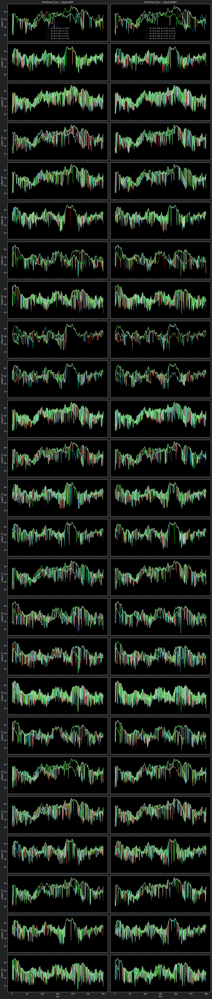

In [34]:
parameters_HDI_ranked = loadmat73('parameters_HDI_ranked.mat')['parameters_HDI_ranked']
plot_simulated_plays(simulations, parameters_HDI_ranked, 'PostTreat_Dun')